# Importy bibliotek

In [16]:
import gc
import logging
import operator 
import os
import pprint 
import sys    
import time
import traceback
import warnings
from collections import OrderedDict 
from functools import reduce        
from itertools import combinations, product 
from typing import Any, Dict, List, Optional, Tuple, Union, OrderedDict as OrderedDictType 


import numpy as np
import pandas as pd

# Biblioteki do wizualizacji
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px 
import plotly.io as pio     

# Biblioteki do modelowania i statystyki
import statsmodels.api as sm
import statsmodels.formula.api as smf
from patsy import bs 
import patsy
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.preprocessing import StandardScaler
from statsmodels.regression.mixed_linear_model import MixedLMResults
from statsmodels.tools.sm_exceptions import ConvergenceWarning, PerfectSeparationError
import umap 

# Tworzenie danych

## Parametry dla agumentacji danych

In [3]:
CONFIG = {
    # Parametry symulacji
    'num_subjects': 12,                # Liczba obiektów badawczych (subject/podmiot/warunek)
    'num_samples_per_condition': 250,  # Liczba losowych próbek/czasu na dany podmiot/warunek
    'cycle_range_max': 1000,           # Górny zakres dla losowania numerów próbek
    'seed': 123,                       # Ziarno losowości dla powtarzalności

    # Definicja siatki punktów pomiarowych (podmitów)
    'conditions_grid': {
        'Alpha': [15.0, 18, 20, 25, 26.5, 28, 30.0, 32, 35, 37, 40, 45.0],            # poziomy Alpha        
        'Beta':  [-1.5, -1.0, -0.5, -0.35, -0.25, 0.0, 0.25, 0.5, 1.0, 1.125, 2],     # poziomy Beta
        'Gamma': [0.25, 1.0, 1.5, 2, 2.25, 3.0, 4, 5.0, 5.25, 5.5, 2*np.pi-0.28]      # poziomy Gamma (w radianach)
    },
    #### Wartości do walidacji modelu
    #### Alpha 26.5 i 37, Beta -0.35 i 1.125, Gamma 2 i 5.25 <--- Scenariusz 1.
    #### Dodanie trzech nowych subjectów.                    <--- Scenariusz 2.

    # Parametry efektów stałych
    'fixed_intercept': 80.0,          # Wartość oczekiwana zmiennej zależnej "Reaction" na początku
    'mean_omega_slope': -1.0 / 50.0,  # Stałe średnie nachylenie (slope) odpowiedzi "Reaction" względem SampleNumber
    'beta_midpoint': 0.0,             # Punkt środkowy dla funkcji sigmoidalnej 
    'alpha_input_min': 10.0,          # Minimalna wartość wejściowa dla Alpha

    # Parametry struktury błędu resztkowego
    'error_type': 'homoscedastic', # Heteroskedastyczność [wariancja błędu losowego (reszty) jest stała dla wszystkich obserwacji (nie zależy od wartości predyktorów ani efektów losowych)]
    'error_std_dev': 0.25,         # Wartość efektu

    # Parametry efektów losowych
    'mean_random_effects': {
        'slope_cycle': 0.0,    # Nie zmieniać
        'alpha_center': 30.0,  # Wartość parametru centrum dla efektu Alpha (parabola)
        'beta_steepness': 2.5, # Wartość parametru "stromizny" dla sigmoidalnego efektu Beta
        'alpha_range': 20.0,   # Wartość  dla efektu Alpha
        'beta_max': 15.0,      # Maksimum zakresu dla sigmoidalnego efektu Beta
        'gamma_amp': 10.0      # Średnia amplituda dla sinusa efektu Gamma
    },
    
    # Odchylenia stanadarodwe dla każdego z 6 parametrów losowych
    'std_dev_random_effects': {
        'slope_cycle': 0.006,
        'alpha_center': 2.25,
        'beta_steepness': 0.42,
        'alpha_range': 0.6,
        'beta_max': 0.55,
        'gamma_amp': 0.8
    },
    
    # Macierz Korelacji parametrów 
    # Macierz korelacji między sześcioma efektami losowymi. Wartości poza przekątną określają stopień liniowej zależności między losowymi odchyleniami parametrów dla danego obiektu.
    # Ta macierz, w połączeniu ze średnimi i odchyleniami standardowymi, pozwala na wygenerowanie skorelowanych efektów losowych dla każdego obiektu. 
    # Na przykład, korelacja 0.20 między alpha_center a beta_steepness oznacza, że obiekty z wyższym alpha_center mają tendencję do posiadania również nieco wyższego beta_steepness.
    'correlation_matrix_6x6': np.array([
        [1.00 , -0.10, 0.10, 0.10, 0.05, 0.0],
        [-0.10, 1.00,  0.20, 0.15, 0.00, 0.0],
        [0.10 , 0.20,  1.00, 0.00, 0.10, 0.0],
        [0.10 , 0.15,  0.00, 1.00, 0.20, 0.0],
        [0.05 , 0.00,  0.10, 0.20, 1.00, 0.0],
        [0.00 , 0.00,  0.00, 0.10, 0.10, 1.00]
    ]),
    # Ograniczenia, dopuszczalne zakresy wartości dla wygenerowanych parametrów losowych dla poszczególnych obiektów.
        'constraints': {
        'alpha_center': {'min': 11.0, 'max': 45.0},
        'beta_steepness': {'min': 0.1},
        'alpha_range': {'min': 1.0},
        'beta_max': {'min': 1.0},
        'gamma_amp': {'min': 0.0}
    }
}

##  Generowanie danych

In [4]:
def calculate_covariance_matrix(stds: Dict[str, float], corr_matrix: np.ndarray) -> Tuple[np.ndarray, List[str]]:
    """
    Oblicza macierz kowariancji na podstawie odchyleń standardowych i macierzy korelacji.

    Args:
        stds (Dict[str, float]): Słownik odchyleń standardowych efektów losowych.
        corr_matrix (np.ndarray): Macierz korelacji.

    Returns:
        Tuple[np.ndarray, List[str]]: Macierz kowariancji i lista nazw efektów w kolejności.
    """
    param_names = list(stds.keys())
    std_devs_array = np.array([stds[name] for name in param_names])

    # Zapewnienie symetrii macierzy korelacji
    corr_matrix = (corr_matrix + corr_matrix.T) / 2
    np.fill_diagonal(corr_matrix, 1.0)

    if corr_matrix.shape[0] != len(std_devs_array):
        raise ValueError("Wymiary macierzy korelacji i liczby odchyleń standardowych nie zgadzają się.")

    covariance_matrix = np.outer(std_devs_array, std_devs_array) * corr_matrix

    # Sprawdzenie dodatniej półokreśloności
    eigenvalues = np.linalg.eigvalsh(covariance_matrix)
    if not np.all(eigenvalues >= -1e-8): # Tolerancja dla błędów numerycznych
        print(f"OSTRZEŻENIE: Macierz kowariancji {covariance_matrix.shape} może nie być dodatnio półokreślona!")
        print(f"Wartości własne: {eigenvalues}") # Odkomentuj dla debugowania
    
    return covariance_matrix, param_names

def generate_subject_specific_effects(means: Dict[str, float],
                                      cov_matrix: np.ndarray,
                                      param_names: List[str],
                                      num_subjects: int) -> pd.DataFrame:
    """
    Generuje skorelowane efekty losowe specyficzne dla każdego subjectu, z uwwzględnieniem średniej populacji
    macierzy kowiariancji dla efektu wielowymiarowego.

    Args:
        means (Dict[str, float]): Słownik średnich wartości efektów losowych.
        cov_matrix (np.ndarray): Macierz kowariancji.
        param_names (List[str]): Lista nazw parametrów (w kolejności zgodnej z means i cov_matrix).
        num_subjects (int): Liczba podmiotów.

    Returns:
        pd.DataFrame: Ramka danych z efektami losowymi dla każdego subjectu.
                      Kolumny: 'Subject', nazwy parametrów losowych.
    """
    means_array = np.array([means[name] for name in param_names])
    
    # Losowanie z wielowymiarowego rozkładu normalnego
    generated_effects = np.random.multivariate_normal(means_array, cov_matrix, num_subjects)
    
    # Tworzenie DataFrame
    effects_df = pd.DataFrame(generated_effects, columns=param_names)
    effects_df['Subject'] = np.arange(num_subjects)
    
    # Zmiana kolejności kolumn dla czytelności
    effects_df = effects_df[['Subject'] + param_names]
    
    return effects_df

def apply_constraints(effects_df: pd.DataFrame, constraints: Dict) -> pd.DataFrame:
    """
    Nakłada ograniczenia (min/max) na wygenerowane parametry losowe.

    Args:
        effects_df (pd.DataFrame): Ramka danych z parametrami losowymi podmiotów.
        constraints (Dict): Słownik ograniczeń, np. {'param_name': {'min': v1, 'max': v2}}.

    Returns:
        pd.DataFrame: Ramka danych z parametrami po nałożeniu ograniczeń.
    """
    constrained_df = effects_df.copy()
    for param_name, constraint_rules in constraints.items():
        if param_name in constrained_df.columns:
            if 'min' in constraint_rules and 'max' in constraint_rules:
                constrained_df[param_name] = np.clip(constrained_df[param_name], 
                                                     constraint_rules['min'], 
                                                     constraint_rules['max'])
            elif 'min' in constraint_rules:
                 constrained_df[param_name] = np.maximum(constrained_df[param_name], constraint_rules['min'])
            elif 'max' in constraint_rules:
                 constrained_df[param_name] = np.minimum(constrained_df[param_name], constraint_rules['max'])
                 
    return constrained_df

def map_effects_to_observations(subject_effects_df: pd.DataFrame, 
                                subject_ids_per_obs: np.ndarray,
                                param_names: List[str]) -> Dict[str, np.ndarray]:
    """
    Mapuje parametry specyficzne dla podmiotu na wszystkie obserwacje.

    Args:
        subject_effects_df (pd.DataFrame): Ramka danych z (ograniczonymi) parametrami podmiotów.
        subject_ids_per_obs (np.ndarray): Tablica ID podmiotu dla każdej obserwacji.
        param_names (List[str]): Lista nazw parametrów do zmapowania.

    Returns:
        Dict[str, np.ndarray]: Słownik, gdzie klucze to nazwy parametrów, 
                               a wartości to tablice NumPy z wartością parametru dla każdej obserwacji.
    """
    mapped_effects = {}
    subject_effects_df = subject_effects_df.sort_values('Subject').reset_index(drop=True) 
    
    for param_name in param_names:
        if param_name in subject_effects_df.columns:
             mapped_effects[param_name + '_subj'] = subject_effects_df[param_name].iloc[subject_ids_per_obs].values
             
    return mapped_effects

def calculate_effect_alpha(alpha_input: np.ndarray, 
                           alpha_center_subj: np.ndarray, 
                           alpha_range_subj: np.ndarray,
                           alpha_input_min: float) -> np.ndarray:
    """
    Oblicza efekt Alpha (parabola) dla każdej obserwacji.
    f_alpha: Parabola z indywidualnym centrum, zakresem i stała k, ograniczona >= 0.
             Współczynnik k jest obliczany tak, aby parabola miała wartość 0 dla alpha_input_min.

    Args:
        alpha_input (np.ndarray): Wartości wejściowe Alpha.
        alpha_center_subj (np.ndarray): Centrum paraboli specyficzne dla podmiotu.
        alpha_range_subj (np.ndarray): Zakres (wysokość) paraboli specyficzny dla podmiotu.
        alpha_input_min (float): Minimalna wartość wejściowa Alpha (punkt, gdzie parabola ma wartość 0).

    Returns:
        np.ndarray: Wartość efektu Alpha dla każdej obserwacji.
    """
    denominator = (alpha_center_subj - alpha_input_min)**2
    epsilon = 1e-9 
    alpha_k_subj = alpha_range_subj / (denominator + epsilon)
    
    # Obliczanie surowego efektu paraboli
    raw_effect_alpha = -alpha_k_subj * (alpha_input - alpha_center_subj)**2 + alpha_range_subj
    
    # Ograniczenie efektu do wartości nieujemnych
    effect_alpha = np.maximum(0.0, raw_effect_alpha)
    
    return effect_alpha

def calculate_effect_beta(beta_input: np.ndarray, 
                          beta_steepness_subj: np.ndarray, 
                          beta_max_subj: np.ndarray,
                          beta_midpoint: float) -> np.ndarray:
    """
    Oblicza efekt Beta (sigmoida) dla każdej obserwacji.
    f_beta: Sigmoida (funkcja logistyczna) z indywidualną stromością i SKALĄ (max).

    Args:
        beta_input (np.ndarray): Wartości wejściowe Beta.
        beta_steepness_subj (np.ndarray): Stromość sigmoidy specyficzna dla podmiotu.
        beta_max_subj (np.ndarray): Maksymalna wartość (nasycenie) sigmoidy specyficzna dla podmiotu.
        beta_midpoint (float): Punkt środkowy sigmoidy (stały).

    Returns:
        np.ndarray: Wartość efektu Beta dla każdej obserwacji.
    """
    effect_beta = beta_max_subj / (1 + np.exp(-beta_steepness_subj * (beta_input - beta_midpoint)))
    return effect_beta

def calculate_effect_gamma(gamma_input: np.ndarray, gamma_amp_subj: np.ndarray) -> np.ndarray:
    """
    Oblicza efekt Gamma (sinusoida) dla każdej obserwacji.
    f_gamma: Sinusoida z indywidualną AMPLITUDĄ.

    Args:
        gamma_input (np.ndarray): Wartości wejściowe Gamma (w radianach).
        gamma_amp_subj (np.ndarray): Amplituda sinusoidy specyficzna dla podmiotu.

    Returns:
        np.ndarray: Wartość efektu Gamma dla każdej obserwacji.
    """
    effect_gamma = gamma_amp_subj * np.sin(gamma_input)
    return effect_gamma

def calculate_effect_omega(cycles: np.ndarray, 
                           mean_omega_slope: float, 
                           slope_cycle_subj: np.ndarray) -> np.ndarray:
    """
    Oblicza efekt Omega (liniowy efekt czasu (SampleNumber/cycles)) dla każdej obserwacji.
    f_omega: Liniowy trend z indywidualnym nachyleniem (średnia + odchylenie losowe), 
             OGRANICZONYM do wartości niepozytywnych (<= 0).

    Args:
        cycles (np.ndarray): Numer cyklu dla każdej obserwacji.
        mean_omega_slope (float): Średnie (stałe) nachylenie trendu.
        slope_cycle_subj (np.ndarray): Odchylenie nachylenia od średniej, specyficzne dla podmiotu.

    Returns:
        np.ndarray: Wartość efektu Omega dla każdej obserwacji.
    """
    # Całkowite nachylenie specyficzne dla podmiotu dla danej obserwacji
    total_omega_slope_subj = mean_omega_slope + slope_cycle_subj 
    
    # Ograniczenie nachylenia do wartości niepozytywnych
    constrained_omega_slope_subj = np.minimum(total_omega_slope_subj, 0.0)
    
    # Obliczenie efektu liniowego
    effect_omega = constrained_omega_slope_subj * cycles
    return effect_omega

def generate_error_term(config: Dict, 
                        total_obs: int, 
                        subject_ids: np.ndarray, 
                        cycles: np.ndarray,
                        num_subjects: int,
                        num_cycles: int,
                        predicted_values_no_error: Optional[np.ndarray] = None) -> np.ndarray:
    """
    Generuje błąd homoskedastyczny (o stałej wariancji) z rozkładu normalnegodla dla każdej obserwacji.

    Args:
        config (Dict): Słownik konfiguracyjny.
        total_obs (int): Całkowita liczba obserwacji.
        subject_ids (np.ndarray): ID podmiotu dla każdej obserwacji.
        cycles (np.ndarray): Numer cyklu dla każdej obserwacji.
        num_subjects (int): Liczba podmiotów.
        num_cycles (int): Liczba cykli na podmiot.
        predicted_values_no_error (Optional[np.ndarray]): Przewidywane wartości Y
                                                        (bez błędu), potrzebne dla 'hetero_pred'.

    Returns:
        np.ndarray: Wygenerowany wektor błędów.
    """
    error_type = config.get('error_type', 'homoscedastic')
    base_std_dev = config['error_std_dev']
    
    if error_type == 'homoscedastic':
        # Błąd o stałej wariancji (standardowy)
        errors = np.random.normal(0, base_std_dev, total_obs)                  
    else:
        raise ValueError(f"Nieznany typ błędu: {error_type}")
        
    return errors

##########################################
# Główny Proces Generowania Danych 
def generate_nested_lmm_data(config: Dict) -> Tuple[pd.DataFrame, pd.DataFrame]:
    """
    Generuje dane symulacyjne dla struktury zagnieżdżonej (nested):
    Każdy Podmiot przechodzi przez wszystkie Warunki (kombinacje Alpha, Beta, Gamma).
    Dla każdej pary Podmiot-Warunek generowane są dane w losowo próbkowanych
    punktach czasowych (SampleNumber/Cycle).

    Args:
        config (Dict): Słownik konfiguracyjny symulacji.

    Returns:
        Tuple[pd.DataFrame, pd.DataFrame]:
            - Główna ramka danych z obserwacjami.
            - Ramka danych z parametrami specyficznymi dla podmiotów.
    """
    np.random.seed(config['seed'])

    # Parametry symulacji
    num_subjects = config['num_subjects']
    num_samples = config['num_samples_per_condition']
    cycle_range_max = config['cycle_range_max']

    # Generowanie listy warunków
    alpha_levels = config['conditions_grid']['Alpha']
    beta_levels = config['conditions_grid']['Beta']
    gamma_levels = config['conditions_grid']['Gamma']
    conditions_list = list(product(alpha_levels, beta_levels, gamma_levels))
    num_conditions = len(conditions_list)
    #conditions_map = {c_idx: cond for c_idx, cond in enumerate(conditions_list)} 

    total_obs = num_subjects * num_conditions * num_samples

    print(f"Generowanie danych dla {num_subjects} podmiotów.")
    print(f"Liczba warunków na podmiot: {num_conditions}")
    print(f"Liczba losowych próbek na podmiot-warunek: {num_samples}")
    print(f"Zakres losowania numerów próbek: 1 - {cycle_range_max}")
    print(f"Całkowita liczba obserwacji: {total_obs}")

    # Generowanie parametrów losowych dla Subjectów 
    cov_matrix, random_param_names = calculate_covariance_matrix(
        config['std_dev_random_effects'],
        config['correlation_matrix_6x6']
    )
    subject_params_df_raw = generate_subject_specific_effects(
        config['mean_random_effects'],
        cov_matrix,
        random_param_names,
        num_subjects
    )
    subject_params_df = apply_constraints( 
        subject_params_df_raw,
        config['constraints']
    )

    subject_ids_list = []
    condition_ids_list = []
    alpha_conditions_list = []
    beta_conditions_list = []
    gamma_conditions_list = []
    sample_numbers_list = []

    # Zagnieżdżone pętle do stworzenia struktury Subject-Condition-SampleNumber
    for s_idx in range(num_subjects):
        for c_idx, (alpha_c, beta_c, gamma_c) in enumerate(conditions_list):
            # Losuj 'num_samples' unikalnych numerów próbek dla tej kombinacji S-C
            current_samples = np.random.choice(
                range(1, cycle_range_max + 1),
                size=num_samples,
                replace=False
            )
            sample_numbers_list.append(current_samples)

            # Dodaj ID podmiotu i warunku
            subject_ids_list.append(np.full(num_samples, s_idx, dtype=int))
            condition_ids_list.append(np.full(num_samples, c_idx, dtype=int))

            # Dodaj stałe wartości warunku
            alpha_conditions_list.append(np.full(num_samples, alpha_c))
            beta_conditions_list.append(np.full(num_samples, beta_c))
            gamma_conditions_list.append(np.full(num_samples, gamma_c))

    # Konwersja list do tablic NumPy o rozmiarze total_obs
    subjects_per_obs = np.concatenate(subject_ids_list)
    condition_ids_per_obs = np.concatenate(condition_ids_list)
    alpha_cond_per_obs = np.concatenate(alpha_conditions_list)
    beta_cond_per_obs = np.concatenate(beta_conditions_list)
    gamma_cond_per_obs = np.concatenate(gamma_conditions_list)
    sample_numbers_per_obs = np.concatenate(sample_numbers_list) # Wylosowane numery próbek

    # Mapowanie Parametrów Losowych Podmiotów na Obserwacje 
    effects_per_obs = map_effects_to_observations(
        subject_params_df, # Przekazujemy DataFrame z parametrami wszystkich podmiotów
        subjects_per_obs,  # Tablica ID podmiotu dla każdej obserwacji
        random_param_names # Lista nazw parametrów do zmapowania
    )

    # Obliczanie Efektów dla Wszystkich Obserwacji 
    effect_alpha = calculate_effect_alpha(
        alpha_cond_per_obs, # Stałe wejście Alpha dla warunku
        effects_per_obs['alpha_center_subj'], # Parametr losowy podmiotu
        effects_per_obs['alpha_range_subj'],  # Parametr losowy podmiotu
        config['alpha_input_min']
    )
    effect_beta = calculate_effect_beta(
        beta_cond_per_obs,  # Stałe wejście Beta dla warunku
        effects_per_obs['beta_steepness_subj'], # Parametr losowy podmiotu
        effects_per_obs['beta_max_subj'],       # Parametr losowy podmiotu
        config['beta_midpoint']
    )
    effect_gamma = calculate_effect_gamma(
        gamma_cond_per_obs, # Stałe wejście Gamma dla warunku
        effects_per_obs['gamma_amp_subj'] # Parametr losowy podmiotu
    )
    effect_omega = calculate_effect_omega(
        sample_numbers_per_obs, # Używamy LOSOWYCH numerów próbek
        config['mean_omega_slope'],
        effects_per_obs['slope_cycle_subj'] # Parametr losowy podmiotu
    )

    # Generowanie błędu
    errors = generate_error_term(
    config=config,
    total_obs=total_obs,
    subject_ids=subjects_per_obs,
    cycles=sample_numbers_per_obs,
    num_cycles=num_samples,
    num_subjects=num_subjects,
    predicted_values_no_error=None
    )

    # Obliczaniue reakcji
    Reaction = (config['fixed_intercept'] +
                effect_alpha +
                effect_beta +
                effect_gamma +
                effect_omega +
                errors)

    # Tworzenie Końcowego DataFrame 
    data = pd.DataFrame({
        'Subject': subjects_per_obs,
        'ConditionID': condition_ids_per_obs,       # Numeryczny ID warunku (0 do K-1)
        'SampleNumber': sample_numbers_per_obs,
        'Alpha_Condition': alpha_cond_per_obs,
        'Beta_Condition': beta_cond_per_obs,
        'Gamma_Condition': gamma_cond_per_obs,
        'Reaction': Reaction,
        # Opcjonalnie: obliczone efekty dla wglądu
        'Effect_Alpha': effect_alpha,
        'Effect_Beta': effect_beta,
        'Effect_Gamma': effect_gamma,
        'Effect_Omega': effect_omega,
        'Error': errors
    })
    data['Subject'] = data['Subject'].astype('category')
    data['ConditionID'] = data['ConditionID'].astype('category')
    return data, subject_params_df

# Generowanie danych w strukturze zagnieżdżonej
main_data_nested, subject_params_nested = generate_nested_lmm_data(CONFIG)


Generowanie danych dla 12 podmiotów.
Liczba warunków na podmiot: 1452
Liczba losowych próbek na podmiot-warunek: 250
Zakres losowania numerów próbek: 1 - 1000
Całkowita liczba obserwacji: 4356000


$$
\begin{aligned}
\text{Reaction}_{ijk} = \Psi_0 &+ f_{\alpha}(\text{Alpha}_j, \alpha_{\text{center},i}, \alpha_{\text{range},i}, \alpha_{\text{min}}) \\
                               &+ f_{\beta}(\text{Beta}_j, \beta_{\text{steepness},i}, \beta_{\text{max},i}, \beta_{\text{midpoint}}) \\
                               &+ f_{\gamma}(\text{Gamma}_j, \gamma_{\text{amp},i}) \\
                               &+ f_{\omega}(\text{SampleNumber}_k, \omega_{\text{slope,mean}}, \omega_{\text{slope},i}) \\
                               &+ \epsilon_{ijk}
\end{aligned}
$$

$$
\text{gdzie:}
$$

$$
\begin{aligned}
i &: \text{indeks podmiotu } (1, \dots, N_{\text{subjects}}) \\
j &: \text{indeks warunku (kombinacja } \alpha, \beta, \gamma) \quad (1, \dots, N_{\text{conditions}}) \\
k &: \text{indeks próbki/pomiaru w czasie w ramach podmiotu } i \text{ i warunku } j \quad (1, \dots, N_{\text{samples}}) \\
\Psi_0 &: \text{stały wyraz wolny (fixed\_intercept)} \\
\alpha_{\text{min}} &: \text{stała minimalna wartość Alpha (alpha\_input\_min)} \\
\beta_{\text{midpoint}} &: \text{stały punkt środkowy Beta (beta\_midpoint)} \\
\omega_{\text{slope,mean}} &: \text{stałe średnie nachylenie Omega (mean\_omega\_slope)}
\end{aligned}
$$

$$
\text{Funkcje efektów:}
$$

$$
\begin{aligned}
f_{\alpha}(x, \text{center}_i, \text{range}_i, \text{min\_val}) &= \max\left(0, -k_i (x - \text{center}_i)^2 + \text{range}_i\right), \quad \text{gdzie } k_i = \frac{\text{range}_i}{(\text{center}_i - \text{min\_val})^2 + \delta} \\
\\
f_{\beta}(x, \text{steepness}_i, \text{max}_i, \text{midpoint}) &= \frac{\text{max}_i}{1 + \exp(-\text{steepness}_i (x - \text{midpoint}))} \\
\\
f_{\gamma}(x, \text{amp}_i) &= \text{amp}_i \sin(x) \\
\\
f_{\omega}(t, \text{slope}_{\text{mean}}, \text{slope}_{\text{dev},i}) &= \min(0, \text{slope}_{\text{mean}} + \text{slope}_{\text{dev},i}) \times t
\end{aligned}
$$

$$
(\delta \text{ to mała stała zapobiegająca dzieleniu przez zero})
$$

$$
\text{Rozkład błędu losowego:}
$$

$$
\epsilon_{ijk} \sim \mathcal{N}(0, \sigma_{\epsilon}^2) \quad (\text{gdzie } \sigma_{\epsilon} = \texttt{error\_std\_dev})
$$

$$
\text{Efekty losowe podmiotu } i:
$$

$$
\mathbf{u}_i = \begin{bmatrix} \omega_{\text{slope},i} \\ \alpha_{\text{center},i} \\ \beta_{\text{steepness},i} \\ \alpha_{\text{range},i} \\ \beta_{\text{max},i} \\ \gamma_{\text{amp},i} \end{bmatrix} \sim \mathcal{N}(\boldsymbol{\mu}_u, \boldsymbol{\Sigma}_u)
$$

$$
\text{gdzie } \boldsymbol{\mu}_u \text{ to wektor średnich (\texttt{mean\_random\_effects}), a } \boldsymbol{\Sigma}_u \text{ to macierz kowariancji}
$$
$$
\text{obliczona z odchyleń standardowych (\texttt{std\_dev\_random\_effects}) i macierzy korelacji.}
$$

### Proces Generowania Danych Symulacyjnych

Kod generuje syntetyczne dane tabelaryczne, naśladujące wyniki badań z powtarzanymi pomiarami na tych samych obiektach (`Subject`) w różnych warunkach.

#### Składowa Efektów Stałych

Podstawą jest składowa **efektów stałych**, reprezentująca średnie trendy w populacji. Pochodzi ona z parametrów konfiguracyjnych:
* `fixed_intercept`: określa średni punkt startowy dla `Reaction`.
* `mean_omega_slope`: definiuje przeciętne liniowe nachylenie `Reaction` względem czasu (`SampleNumber`).
* Parametry jak `beta_midpoint` czy `alpha_input_min`: wpływają na *średni kształt* nieliniowych zależności od warunków Beta i Alpha.

Te stałe parametry tworzą wspólną "bazę" odpowiedzi dla wszystkich obiektów.

#### Składowa Efektów Losowych

Kluczowym elementem wprowadzającym realizm i zmienność jest symulacja **efektów losowych**. Odzwierciedlają one indywidualne różnice między obiektami (`Subject`), pokazując, jak charakterystyka odpowiedzi każdego z nich odchyla się od średniej populacyjnej.

Dla każdego obiektu losowany jest unikalny zestaw sześciu parametrów (np. `slope_cycle_subj`, `alpha_center_subj`, `beta_steepness_subj`, `alpha_range_subj`, `beta_max_subj`, `gamma_amp_subj`) z wielowymiarowego rozkładu normalnego. Rozkład ten jest precyzyjnie zdefiniowany w konfiguracji przez:
* Średnie (`mean_random_effects`)
* Odchylenia standardowe (`std_dev_random_effects`)
* Macierz korelacji (`correlation_matrix_6x6`)

Co ważne, te wylosowane, **specyficzne dla obiektu parametry** bezpośrednio **modyfikują** sposób, w jaki dany obiekt reaguje na czas i warunki – np.:
* `alpha_center_subj` przesuwa optimum parabolicznego efektu Alpha dla tego obiektu.
* `beta_steepness_subj` zmienia stromość jego sigmoidalnej odpowiedzi na Beta.
* `slope_cycle_subj` koryguje jego indywidualne nachylenie trendu czasowego.

#### Obliczanie Wartości 'Reaction' dla Obserwacji

Zagnieżdżona, hierarchiczna struktura danych – gdzie liczne obserwacje (każda z własnym `SampleNumber` i przypisaną kombinacją warunków `Alpha_Condition`, `Beta_Condition`, `Gamma_Condition`) są grupowane wewnątrz każdego obiektu – pozwala na obliczenie finalnej wartości `Reaction` dla **każdej pojedynczej obserwacji** jako sumy tych wpływów.

Zgodnie z logiką kodu (funkcje `calculate_effect_*` i finalne sumowanie), wartość `Reaction` dla danego wiersza danych jest obliczana według schematu:

**`Reaction` = `fixed_intercept` + `Effect_Alpha` + `Effect_Beta` + `Effect_Gamma` + `Effect_Omega` + `Error`**

Gdzie poszczególne składowe `Effect_*` dla tego konkretnego wiersza (obserwacji) są wyliczane następująco:

* **`Effect_Alpha`**: Wynik funkcji `calculate_effect_alpha`, biorący pod uwagę wartość `Alpha_Condition` z tego wiersza oraz parametry `alpha_center_subj` i `alpha_range_subj` specyficzne dla podmiotu, do którego należy ten wiersz (oraz stały `alpha_input_min`).
* **`Effect_Beta`**: Wynik funkcji `calculate_effect_beta`, zależny od `Beta_Condition` z wiersza, parametrów `beta_steepness_subj` i `beta_max_subj` podmiotu oraz stałego `beta_midpoint`.
* **`Effect_Gamma`**: Wynik funkcji `calculate_effect_gamma`, zależny od `Gamma_Condition` z wiersza i parametru `gamma_amp_subj` podmiotu.
* **`Effect_Omega`**: Wynik funkcji `calculate_effect_omega`, zależny od `SampleNumber` z wiersza oraz **całkowitego nachylenia dla podmiotu** (obliczonego jako suma stałego `mean_omega_slope` i losowego `slope_cycle_subj` tego podmiotu).
* **`Error`**: Wartość losowa dodana na końcu, pochodząca z rozkładu normalnego o średniej 0 i odchyleniu standardowym `error_std_dev` (zdefiniowanym w konfiguracji).

#### Struktura Danych

Ostatecznie, wygenerowana tabela obserwacji, wraz z osobną tabelą parametrów obiektów, dostarcza kompletny, ustrukturyzowany zestaw danych. Każdy punkt danych `Reaction` odzwierciedla złożoną interakcję między wspólnymi trendami populacyjnymi, indywidualnymi cechami obiektu, specyficznymi warunkami eksperymentalnymi w danym punkcie czasowym oraz losową zmiennością resztkową. Takie dane są idealne do testowania i stosowania zaawansowanych modeli statystycznych (jak LMM czy modele bayesowskie), które potrafią analizować dane o strukturze hierarchicznej i modelować różne źródła zmienności.

## Podział danych

In [5]:
# Konfiguracja
SUBJECT_VAR = "Subject"
TRAIN_VAL1_SUBJECT_IDS = list(range(9)) # Podmioty dla treningu i walidacji S1
VAL2_SUBJECT_IDS = [9, 10, 11]          # Podmioty dla walidacji S2
CONDITION_COLS = ['Alpha_Condition', 'Beta_Condition', 'Gamma_Condition'] # Kolumny warunków
VALIDATION_CONDITIONS_S1 = {              # Warunki dla podziału S1 
    'Alpha_Condition': [26.5, 37.0],
    'Beta_Condition': [-0.35, 1.125],
    'Gamma_Condition': [2.0, 5.25]
}

def update_categoricals(df_list, subject_col, original_categories):
    """Aktualizuje typ kolumny Subject na kategoryczny i usuwa nieużywane kategorie."""
    print(f"Aktualizowanie typu kategorycznego dla kolumny '{subject_col}'...")
    updated_count = 0
    for df in df_list:
        if df is not None and not df.empty and subject_col in df.columns:
            try:
                current_dtype_is_cat = isinstance(df[subject_col].dtype, pd.CategoricalDtype)

                needs_setting = True
                if current_dtype_is_cat:
                    if df[subject_col].cat.categories.equals(original_categories):
                        needs_setting = False

                if needs_setting:
                    df[subject_col] = pd.Categorical(df[subject_col], categories=original_categories)
                    current_dtype_is_cat = True

                if current_dtype_is_cat:
                    unique_vals_in_df = df[subject_col].unique()
                    if len(df[subject_col].cat.categories) > len(unique_vals_in_df):
                         df[subject_col] = df[subject_col].cat.remove_unused_categories()
                    updated_count += 1 # Zliczamy udaną próbę aktualizacji/sprawdzenia
            except Exception as e:
                 print(f"Ostrzeżenie: Nie udało się zaktualizować kategorii w jednym z DF: {e}")
                 print(traceback.format_exc(limit=1)) # traceback dla debugowania
    if updated_count > 0:
         print(f"Próbowano zaktualizować kategorie w {updated_count} DataFrame'ach.")
    else:
         print("Nie dokonano aktualizacji kategorii (brak potrzeby, błędy lub puste DF).")


def print_dataset_summary(df_name, df):
    """Wyświetla podsumowanie zawartości DataFrame."""
    print(f"\n--- Zawartość zbioru: {df_name} ({df.shape[0] if df is not None else 0} wierszy) ---")
    if df is None or df.empty:
        print("Zbiór jest pusty lub None.")
        return

    try:
        if SUBJECT_VAR in df.columns:
            unique_subjects = sorted(df[SUBJECT_VAR].unique().tolist())
            print(f"Unikalni Subjectci ({len(unique_subjects)}): {unique_subjects}")
        else:
             print(f"Brak kolumny '{SUBJECT_VAR}' do analizy podmiotów.")

    except Exception as e: # Ogólny wyjątek na wypadek problemów z unique/tolist/sorted
        print(f"Błąd podczas analizy podmiotów: {e}")


    for col in CONDITION_COLS:
         try:
            if col in df.columns:
                  unique_values = sorted(df[col].unique().tolist())
                  print(f"Unikalne {col} ({len(unique_values)}): {unique_values}")
            else:
                  print(f"Brak kolumny '{col}' do analizy warunków.")
         except Exception as e: # Ogólny wyjątek
            print(f"Błąd podczas analizy kolumny '{col}': {e}")

# Inicjalizacja zmiennych wynikowych
training_data = pd.DataFrame()      
validation_data_s1 = pd.DataFrame()
validation_data_s2 = pd.DataFrame()
data_subj_0_8 = pd.DataFrame()

# Sprawdzenie czy wejściowy DF istnieje i nie jest pusty
if 'main_data_nested' not in locals() or not isinstance(main_data_nested, pd.DataFrame) or main_data_nested.empty:
        raise ValueError("DataFrame `main_data_nested` nie istnieje, nie jest typu DataFrame lub jest pusty.")

# Krok 1: Podział wg Podmiotów (Walidacja S2) 
print("\n Krok 1: Podział wg Podmiotów (Walidacja S2)")
if SUBJECT_VAR not in main_data_nested.columns:
    raise KeyError(f"Brak kolumny '{SUBJECT_VAR}' w main_data_nested do podziału wg podmiotów.")
print(f"Dzielenie wg kolumny '{SUBJECT_VAR}', podmioty walidacyjne S2: {VAL2_SUBJECT_IDS}")

mask_val_s2 = main_data_nested[SUBJECT_VAR].isin(VAL2_SUBJECT_IDS)
validation_data_s2 = main_data_nested.loc[mask_val_s2].copy()
data_subj_0_8 = main_data_nested.loc[~mask_val_s2].copy()

print(f"Rozmiar danych dla podziału S1 (Subj 0-8): {data_subj_0_8.shape}")
print(f"Rozmiar zbioru walidacyjnego S2 (przed filtrowaniem): {validation_data_s2.shape}")

# Krok 1.5: Usunięcie warunków S1 ze zbioru S2 
print("\n Krok 1.5: Usuwanie warunków walidacyjnych S1 ze zbioru S2 ")
if not validation_data_s2.empty:
    # Sprawdzenie wymaganych kolumn do filtrowania w validation_data_s2
    cols_for_filtering_s2 = [col for col in VALIDATION_CONDITIONS_S1 if col in validation_data_s2.columns]
    if not cols_for_filtering_s2:
            print(f"Ostrzeżenie: Brak kolumn {list(VALIDATION_CONDITIONS_S1.keys())} w Validation S2 do filtrowania warunków S1. Pomijanie.")
    else:
        # Tworzenie maski dla wierszy do USUNIĘCIA z S2 (logika OR)
        masks_to_remove_s2 = [
            validation_data_s2[col].isin(VALIDATION_CONDITIONS_S1[col])
            for col in cols_for_filtering_s2 # Iteruj tylko po istniejących kolumnach
        ]
        # Połączenie masek za pomocą OR (reduce jest bezpieczny dla >0 masek)
        if masks_to_remove_s2: 
            final_mask_remove_s2 = reduce(operator.or_, masks_to_remove_s2)
            rows_before = validation_data_s2.shape[0]
            # Zastosowanie maski do usunięcia wierszy za pomocą .loc
            validation_data_s2 = validation_data_s2.loc[~final_mask_remove_s2].copy()
            rows_after = validation_data_s2.shape[0]
            print(f"Usunięto {rows_before - rows_after} wierszy z Validation S2. Nowy rozmiar: {validation_data_s2.shape}")
        else:
                print("Brak poprawnych warunków/kolumn do filtrowania w Validation S2.")
else:
    print("Zbiór Validation S2 jest pusty, pomijanie filtrowania.")

# Krok 2: Podział wg Warunków (Walidacja S1 - AND, Trening - WYKLUCZENIE OR) 
print(f"\n Krok 2: Podział wg Warunków (Walidacja S1, Trening) ")
if data_subj_0_8 is None or data_subj_0_8.empty:
    print("Brak danych dla podmiotów 0-8 do dalszego podziału.")
    # Inicjalizuj jako puste DF
    training_data = pd.DataFrame(columns=data_subj_0_8.columns if data_subj_0_8 is not None else None)
    validation_data_s1 = pd.DataFrame(columns=data_subj_0_8.columns if data_subj_0_8 is not None else None)
else:
    # Sprawdzenie wymaganych kolumn warunkowych w data_subj_0_8
    required_cond_cols_s1 = list(VALIDATION_CONDITIONS_S1.keys())
    cols_for_split_s1 = [col for col in required_cond_cols_s1 if col in data_subj_0_8.columns]
    if len(cols_for_split_s1) != len(required_cond_cols_s1):
            missing_cols = set(required_cond_cols_s1) - set(cols_for_split_s1)
            raise KeyError(f"Brak wymaganych kolumn warunkowych {list(missing_cols)} w danych dla podmiotów 0-8.")

    # --- Tworzenie validation_data_s1 (Logika AND) ---
    print("Tworzenie Validation Data S1:")
    pprint.pprint(VALIDATION_CONDITIONS_S1)
    masks_s1_and = [
        data_subj_0_8[col].isin(VALIDATION_CONDITIONS_S1[col])
        for col in cols_for_split_s1
    ]
    if not masks_s1_and:
        final_mask_s1 = pd.Series(False, index=data_subj_0_8.index)
    else:
        final_mask_s1 = reduce(operator.and_, masks_s1_and) # Maska AND

    validation_data_s1 = data_subj_0_8.loc[final_mask_s1].copy()
    print(f"Rozmiar zbioru walidacyjnego S1: {validation_data_s1.shape}")

    # Tworzenie training_data 
    print("\nTworzenie Training Data (wykluczenie wierszy z logiką OR):")
    pprint.pprint(VALIDATION_CONDITIONS_S1)
    masks_exclude_or = [
        data_subj_0_8[col].isin(VALIDATION_CONDITIONS_S1[col])
        for col in cols_for_split_s1
    ]
    if not masks_exclude_or:
            # Jeśli nie ma warunków do wykluczenia, maska jest False (nic nie wykluczamy)
            final_mask_exclude = pd.Series(False, index=data_subj_0_8.index)
    else:
            # Połącz maski OR, aby znaleźć WSZYSTKIE wiersze do wykluczenia
            final_mask_exclude = reduce(operator.or_, masks_exclude_or) # Maska OR

    # Zbiór treningowy to wiersze NIE pasujące do maski wykluczenia OR
    training_data = data_subj_0_8.loc[~final_mask_exclude].copy()
    print(f"Rozmiar FINALNEGO zbioru treningowego (po wykluczeniu OR): {training_data.shape}")

    # Sprawdzenie i Komentarz o Nieskomplementarności 
    original_rows = data_subj_0_8.shape[0]
    train_rows = training_data.shape[0]
    val1_rows = validation_data_s1.shape[0]
    lost_rows = original_rows - train_rows - val1_rows

    if lost_rows > 0:
            print(f"\nUWAGA: Zbiory 'training_data' ({train_rows} w.) i 'validation_data_s1' ({val1_rows} w.) "
                f"NIE sumują się do danych wejściowych dla Subjectów 0-8 ({original_rows} w.). "
                f"{lost_rows} wierszy zostało wykluczonych z obu zbiorów, ponieważ zawierały *niektóre*, "
                f"ale nie *wszystkie* warunki walidacyjne S1.")
    elif lost_rows < 0:
            # Teoretycznie nie powinno się zdarzyć przy .loc i .copy()
            print(f"\nOSTRZEŻENIE: Niespójność w liczbie wierszy! Sprawdź logikę podziału. "
                f"Wejście: {original_rows}, Trening: {train_rows}, Walidacja S1: {val1_rows}")

print(f"Rozmiar FINALNEGO zbioru treningowego: {training_data.shape}")
print(f"Rozmiar zbioru walidacyjnego S1: {validation_data_s1.shape}")

# Krok 3: Aktualizacja Typów Kategorycznych (Opcjonalnie) 
print("\n Krok 3: Aktualizacja Typów Kategorycznych ")
# Sprawdzenie typu w oryginalnym DataFrame
if SUBJECT_VAR in main_data_nested.columns and isinstance(main_data_nested[SUBJECT_VAR].dtype, pd.CategoricalDtype):
    all_original_categories = main_data_nested[SUBJECT_VAR].cat.categories
    # Przygotuj listę DataFrame'ów do aktualizacji (pomijając None lub puste)
    dfs_to_update = [df for df in [training_data, validation_data_s1, validation_data_s2] if isinstance(df, pd.DataFrame) and not df.empty]
    if dfs_to_update:
            update_categoricals(dfs_to_update, SUBJECT_VAR, all_original_categories)
    else:
            print("Brak niepustych DataFrame'ów do aktualizacji kategorii.")
else:
    print(f"Kolumna '{SUBJECT_VAR}' nie jest typu kategorycznego w danych wejściowych lub nie istnieje. Pomijanie aktualizacji.")

# Krok 4: Podsumowanie Zawartości Zbiorów 
print("\n Krok 4: Podsumowanie Zawartości Utworzonych Zbiorów ")
training_data = training_data if isinstance(training_data, pd.DataFrame) else pd.DataFrame()
validation_data_s1 = validation_data_s1 if isinstance(validation_data_s1, pd.DataFrame) else pd.DataFrame()
validation_data_s2 = validation_data_s2 if isinstance(validation_data_s2, pd.DataFrame) else pd.DataFrame()

datasets_to_summarize = {
    "Training Data": training_data,
    "Validation Data S1": validation_data_s1, 
    "Validation Data S2": validation_data_s2
}
for name, df_summary in datasets_to_summarize.items():
        print_dataset_summary(name, df_summary)


 Krok 1: Podział wg Podmiotów (Walidacja S2)
Dzielenie wg kolumny 'Subject', podmioty walidacyjne S2: [9, 10, 11]
Rozmiar danych dla podziału S1 (Subj 0-8): (3267000, 12)
Rozmiar zbioru walidacyjnego S2 (przed filtrowaniem): (1089000, 12)

 Krok 1.5: Usuwanie warunków walidacyjnych S1 ze zbioru S2 
Usunięto 481500 wierszy z Validation S2. Nowy rozmiar: (607500, 12)

 Krok 2: Podział wg Warunków (Walidacja S1, Trening) 
Tworzenie Validation Data S1:
{'Alpha_Condition': [26.5, 37.0],
 'Beta_Condition': [-0.35, 1.125],
 'Gamma_Condition': [2.0, 5.25]}
Rozmiar zbioru walidacyjnego S1: (18000, 12)

Tworzenie Training Data (wykluczenie wierszy z logiką OR):
{'Alpha_Condition': [26.5, 37.0],
 'Beta_Condition': [-0.35, 1.125],
 'Gamma_Condition': [2.0, 5.25]}
Rozmiar FINALNEGO zbioru treningowego (po wykluczeniu OR): (1822500, 12)

UWAGA: Zbiory 'training_data' (1822500 w.) i 'validation_data_s1' (18000 w.) NIE sumują się do danych wejściowych dla Subjectów 0-8 (3267000 w.). 1426500 wierszy z

### Podział Danych na Zbiory Treningowy i Walidacyjne

Ten kod dzieli wejściowy zbiór danych (`main_data_nested`) na trzy części: treningową (`training_data`), walidacyjną S1 (`validation_data_s1`) i walidacyjną S2 (`validation_data_s2`). Celem jest przygotowanie danych do oceny wydajności modelu predykcyjnego w różnych aspektach.

* Zbiór **`training_data`**: Zawiera dane podmiotów 0-8 po usunięciu wszystkich wierszy powiązanych z jakimkolwiek warunkiem walidacyjnym S1. Zapewnia to "czystość" procesu uczenia, eliminując dane graniczne lub ściśle walidacyjne.
* Zbiór **`validation_data_s1`**: Selekcjonuje obserwacje z podmiotów 0-8, które ściśle odpowiadają *pełnej kombinacji* warunków S1. Służy do sprawdzania **precyzji** modelu w konkretnych, choć niewidzianych w treningu, punktach warunkowych (test interpolacji/ekstrapolacji warunkowej).
* Zbiór **`validation_data_s2`**: Izoluje podmioty 9-11, które nie były używane w treningu. Testuje zdolność modelu do **generalizacji** na zupełnie nowe, niewidziane wcześniej obiekty.

Dzięki takiemu podziałowi możliwa jest kompleksowa weryfikacja modelu: nauka na danych treningowych oraz ocena generalizacji (S2) i precyzji w specyficznych warunkach (S1).

# Wizualizacja danych

### Podstawowe parametry

Uruchamianie głównego bloku...

--- ROZPOCZYNANIE WIZUALIZACJI ---

--- SPRAWDZANIE DANYCH ---
Podmioty: 9, Warunki: 810, Obserwacje: 1822500
Kolumny: ['Subject', 'ConditionID', 'SampleNumber', 'Alpha_Condition', 'Beta_Condition', 'Gamma_Condition', 'Reaction', 'Effect_Alpha', 'Effect_Beta', 'Effect_Gamma', 'Effect_Omega', 'Error']
--- KONIEC SPRAWDZANIA ---

Wybrano 9 Subjectów do wizualizacji: [0, 1, 2, 3, 4, 5, 6, 7, 8]

Generowanie ogólnych wykresów...
Rysowanie Reaction vs SampleNumber (lmplot)...

Rysowanie teoretycznych kształtów z nałożonymi punktami...

Generowanie paneli Reaction vs Condition z średnim efektem...
Rysowanie panelu: 5a (Alpha_Condition)...
Rysowanie panelu: 5b (Beta_Condition)...
Rysowanie panelu: 5c (Gamma_Condition)...

Rysowanie rozkładów parametrów losowych...

Rysowanie heatmapy korelacji parametrów losowych...

Generowanie Pairplot jest wyłączone.


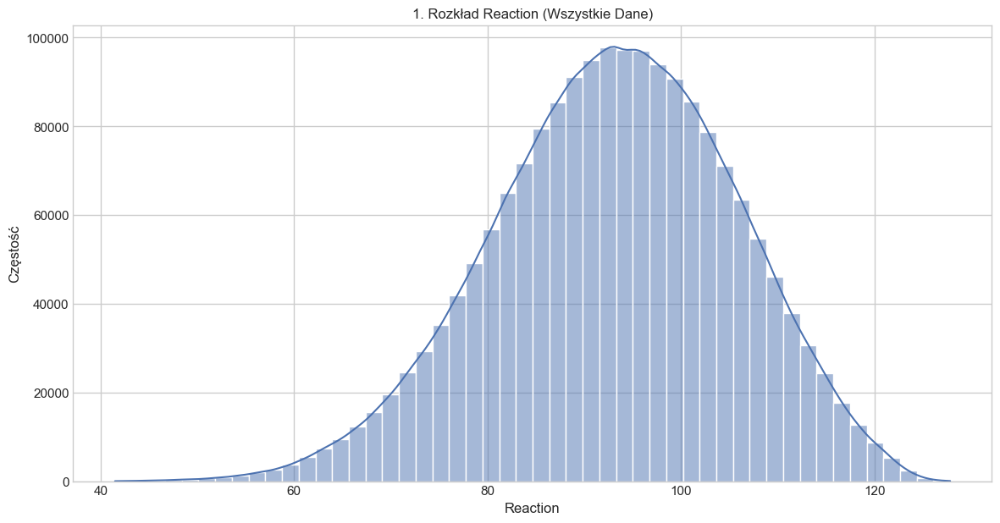

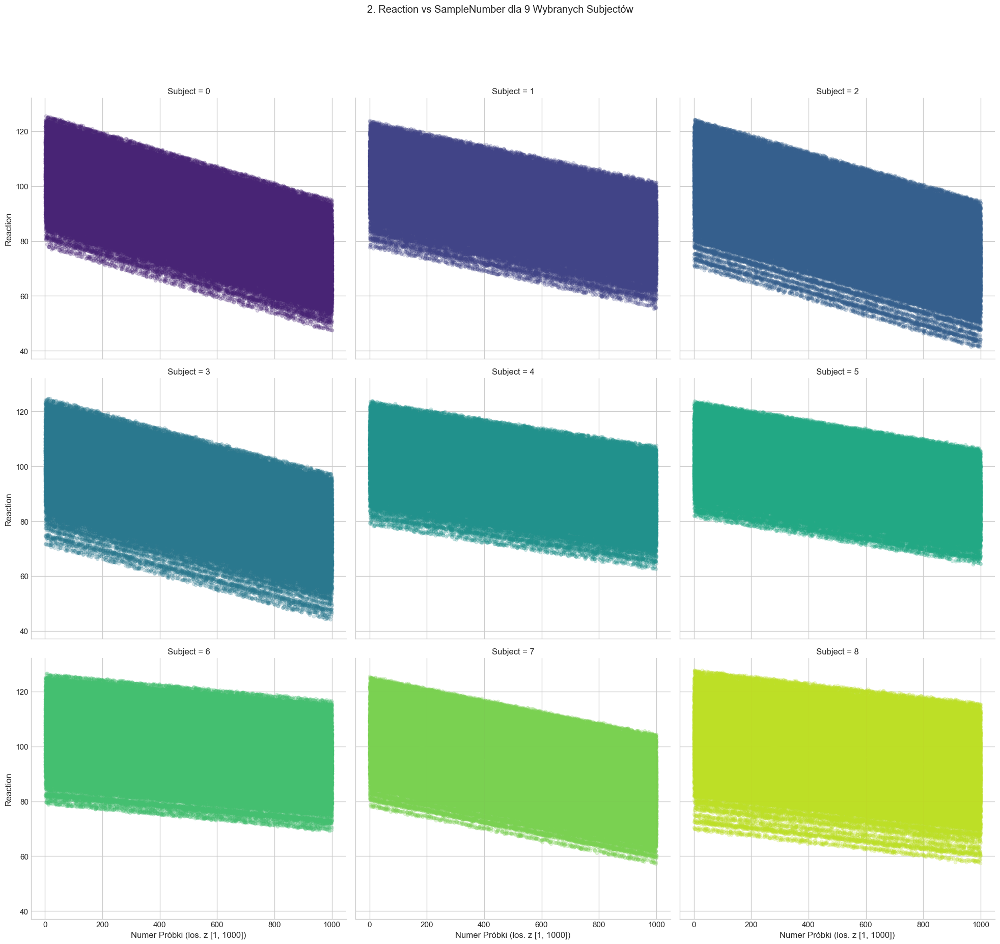

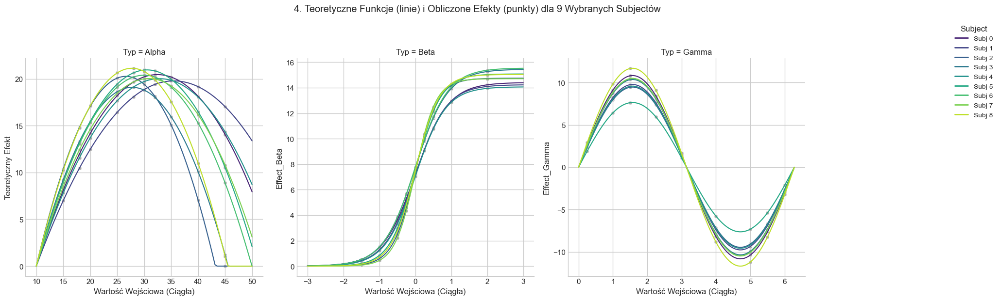

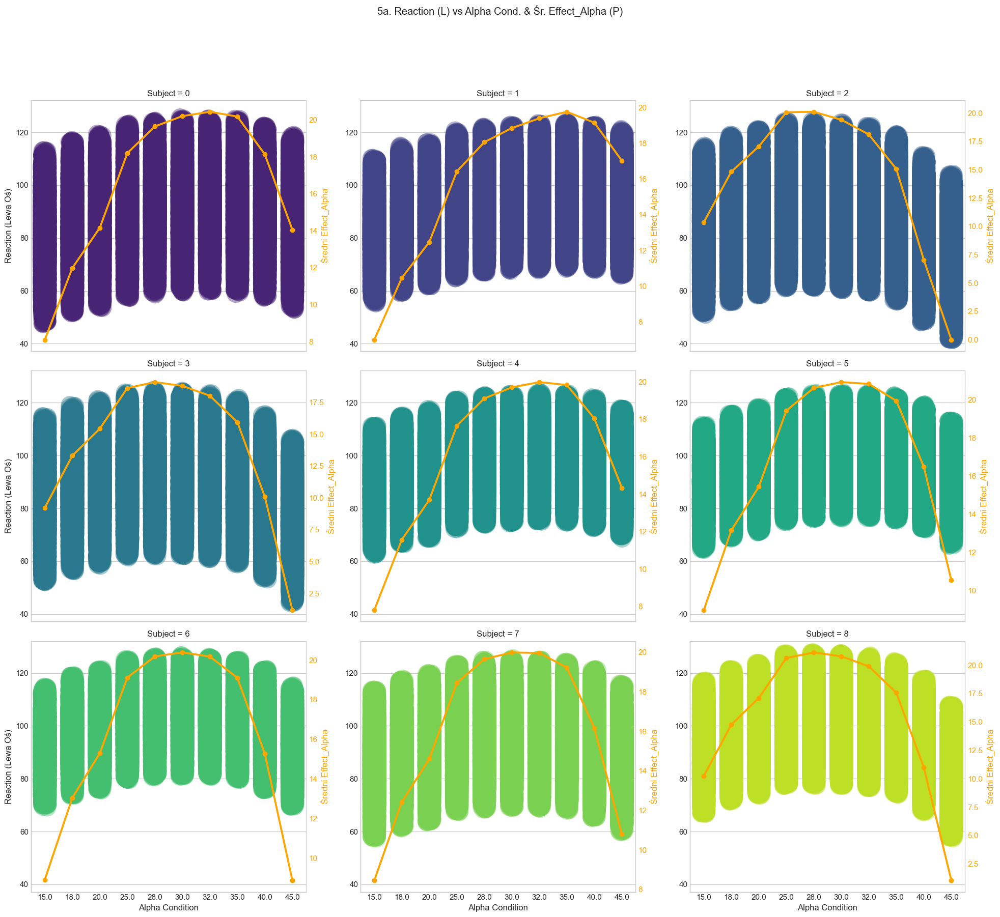

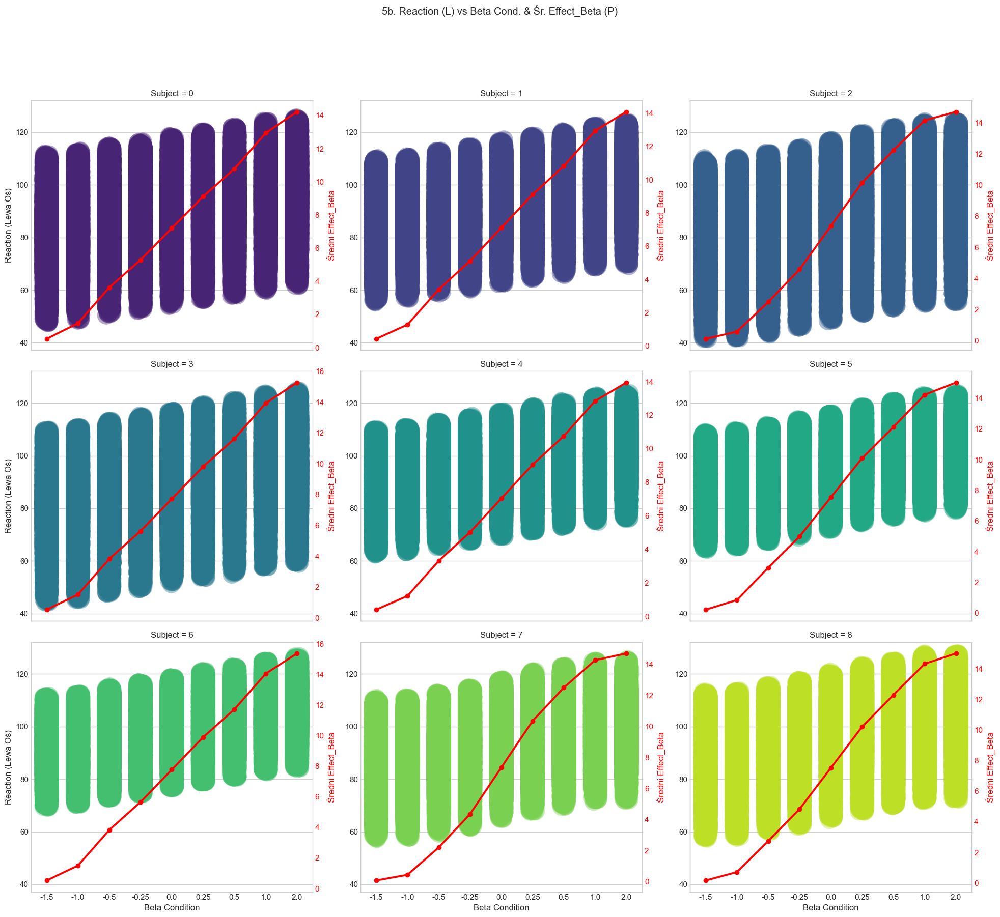

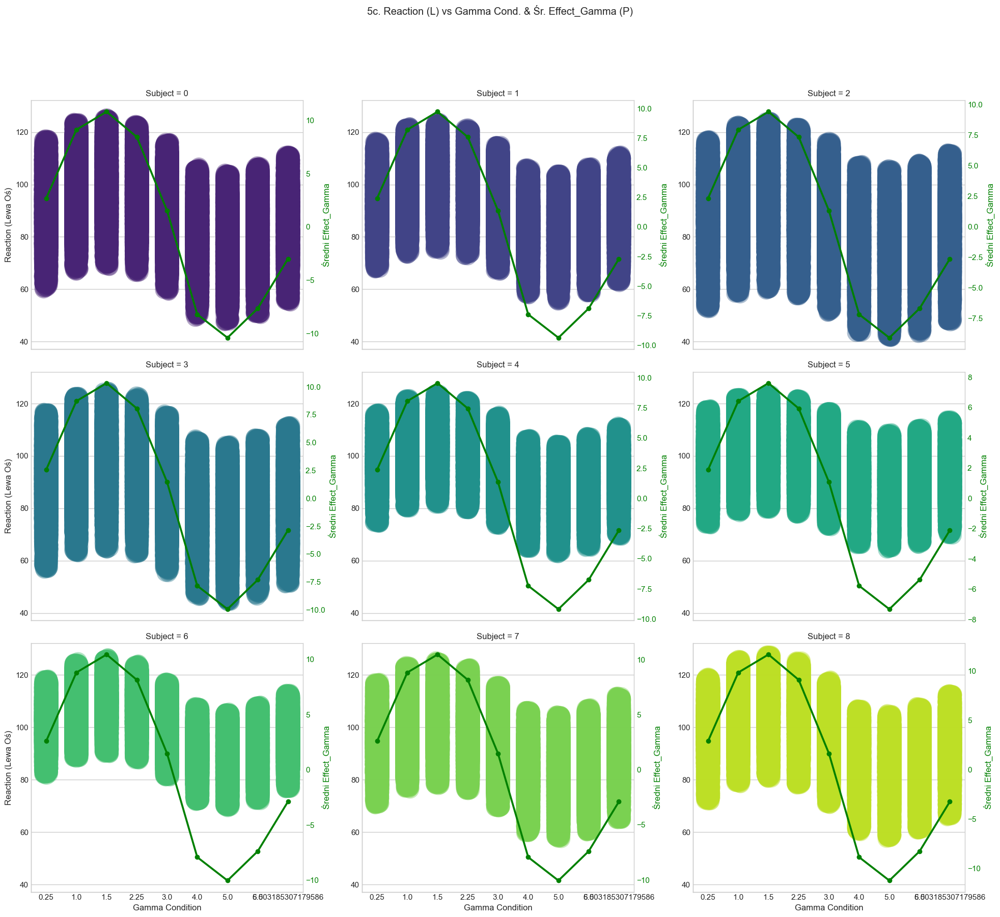

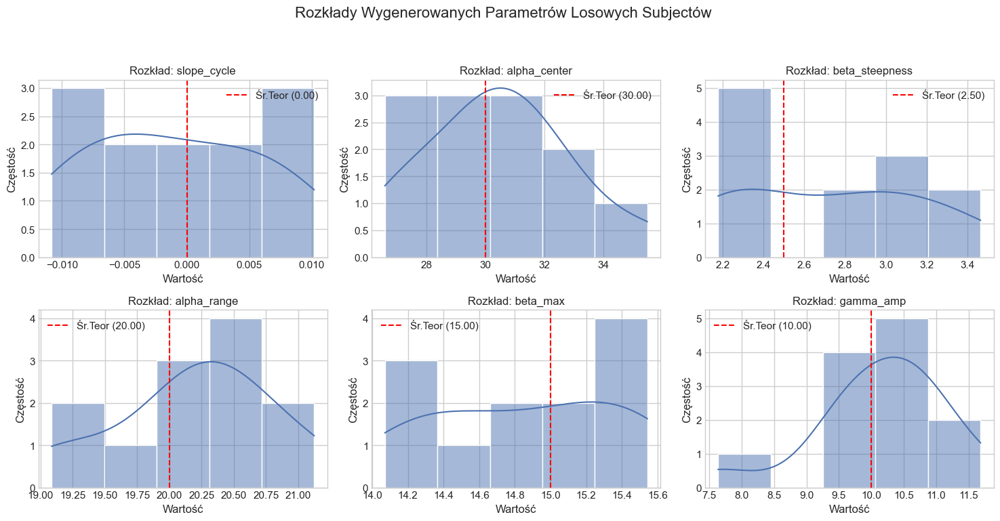

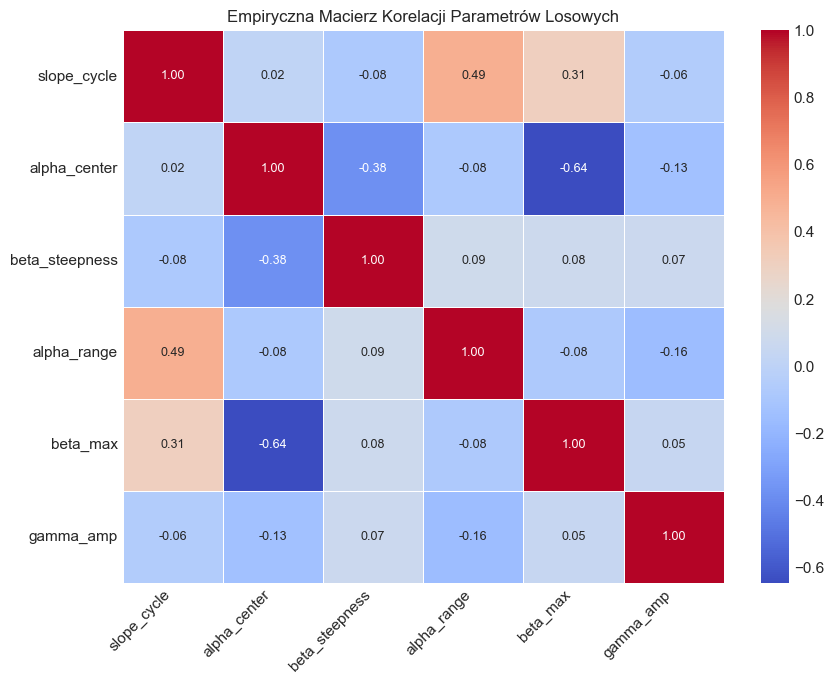

In [5]:
# --- Konfiguracja Wizualizacji ---
if 'CONFIG' not in locals() or 'CONFIG' not in globals():
    raise NameError("Słownik 'CONFIG' nie został znaleziony.")

# --- Konfiguracja Stylu i Parametrów Wizualizacji ---
plt.style.use('seaborn-v0_8-whitegrid')
DEFAULT_N_SUBJECTS_TO_PLOT = 9
DEFAULT_PLOT_ALPHA = 0.4
DEFAULT_POINT_SIZE = 26
DEFAULT_SAMPLE_SIZE_PAIRPLOT = 1000
DEFAULT_RUN_PAIRPLOT = False
DEFAULT_FACET_HEIGHT = 6
DEFAULT_FACET_ASPECT = 1.1
DEFAULT_HEATMAP_BASE_W = 9; DEFAULT_HEATMAP_BASE_H = 7
DEFAULT_HEATMAP_MULT_W = 1.0; DEFAULT_HEATMAP_MULT_H = 0.9
DEFAULT_FIG_SIZE = (14, 7)
DEFAULT_SUBJECT_PALETTE_NAME = 'viridis'
DEFAULT_LINE_COLORS = {'alpha': 'orange', 'beta': 'red', 'gamma': 'green'}

def plot_mean_effect_on_twinx(x, y_point, **kwargs):
    """Rysuje średnią y_point na drugiej osi Y jako pointplot."""
    ax = plt.gca(); ax2 = ax.twinx()
    data = kwargs.pop('data')
    line_color = kwargs.pop('line_color', 'black')
    # Usuń nieużywane argumenty przekazywane przez map_dataframe
    kwargs.pop('color', None); kwargs.pop('palette', None); kwargs.pop('hue', None)
    kwargs.pop('col', None); kwargs.pop('row', None); kwargs.pop('marker', None); kwargs.pop('s', None)
    order = sorted(data[x].unique()) if data[x].nunique() < 10 else None

    # Sprawdź czy kolumna y istnieje w danych dla tego panelu
    if y_point not in data.columns or data[y_point].isnull().all():
        #print(f"Ostrzeżenie w plot_mean_effect_on_twinx: Brak danych dla '{y_point}' w panelu.")
        ax2.set_visible(False)
        return

    sns.pointplot(data=data, x=x, y=y_point, order=order, color=line_color, ax=ax2,
                  errorbar=('ci', 95), linestyle='-', marker='o', markersize=5, **kwargs)
    ax2.set_ylabel(f'Średni {y_point}', color=line_color)
    ax2.tick_params(axis='y', labelcolor=line_color)
    ax2.grid(False)

def create_condition_facet_plot(data, x_condition_col, y_reaction_col, y_effect_col,
                                subject_col, col_order, col_wrap, line_color,
                                plot_title_prefix, scatter_alpha, point_size, facet_height, facet_aspect, palette):
    """Tworzy FacetGrid Reaction (L) vs Warunek (X) i Śr. Efekt (P) vs Warunek (X)."""
    print(f"Rysowanie panelu: {plot_title_prefix} ({x_condition_col})...")
    condition_base_name = x_condition_col.replace('_Condition', '')
    grid = sns.FacetGrid(data, col=subject_col, col_wrap=col_wrap,
                         col_order=col_order, height=facet_height, aspect=facet_aspect,
                         sharey=True, palette=palette)

    unique_x_vals = data[x_condition_col].unique()
    order = sorted(unique_x_vals) if len(unique_x_vals) > 0 else None

    # Reakcja na lewej osi
    grid.map_dataframe(sns.stripplot, x=x_condition_col, y=y_reaction_col, hue=subject_col,
                       order=order, alpha=scatter_alpha, size=point_size, jitter=0.1, legend=False, palette=palette)

    # Średni Efekt na prawej osi
    grid.map_dataframe(plot_mean_effect_on_twinx, x=x_condition_col, y_point=y_effect_col, line_color=line_color)
    title_suffix = f"& Śr. {y_effect_col} (P)" 

    grid.fig.suptitle(f'{plot_title_prefix}. {y_reaction_col} (L) vs {condition_base_name} Cond. {title_suffix}', y=1.03)
    grid.set_titles("Subject = {col_name}")
    grid.set_axis_labels(f'{condition_base_name} Condition', f'{y_reaction_col} (Lewa Oś)')
    grid.fig.tight_layout(rect=[0, 0.03, 1, 0.97])

def plot_random_effect_distributions(params_df, num_subjects, mean_params_config, facet_col_wrap):
    """Rysuje histogramy dla parametrów losowych."""
    print("\nRysowanie rozkładów parametrów losowych...")
    param_cols = params_df.columns.drop(['Subject'], errors='ignore')
    if not len(param_cols): print("Brak parametrów losowych."); return
    num_param_cols = len(param_cols)
    n_cols_facet = facet_col_wrap
    num_rows = (num_param_cols + n_cols_facet - 1) // n_cols_facet
    fig_dist, axes_dist = plt.subplots(num_rows, n_cols_facet, figsize=(5 * n_cols_facet, num_rows * 4), squeeze=False)
    axes_flat = axes_dist.flatten()
    for i, col in enumerate(param_cols):
        ax = axes_flat[i]
        if params_df[col].nunique() > 1: sns.histplot(params_df[col], kde=True, bins=max(5, num_subjects // 4), ax=ax)
        else: ax.axvline(params_df[col].iloc[0], color='blue', label=f'Stała: {params_df[col].iloc[0]:.2f}'); ax.set_yticks([])
        if col in mean_params_config: ax.axvline(mean_params_config[col], color='red', linestyle='--', label=f'Śr.Teor ({mean_params_config[col]:.2f})')
        if ax.get_legend_handles_labels()[0]: ax.legend()
        ax.set_title(f'Rozkład: {col}'); ax.set_xlabel('Wartość'); ax.set_ylabel('Częstość')
    for j in range(i + 1, len(axes_flat)): axes_flat[j].set_visible(False)
    fig_dist.suptitle('Rozkłady Wygenerowanych Parametrów Losowych Subjectów', fontsize=16, y=0.99)
    fig_dist.tight_layout(rect=[0, 0.03, 1, 0.95])

def plot_random_effect_correlation_heatmap(params_df, base_w, base_h, mult_w, mult_h):
     """Rysuje heatmapę korelacji parametrów losowych."""
     print("\nRysowanie heatmapy korelacji parametrów losowych...")
     param_cols = params_df.columns.drop(['Subject'], errors='ignore')
     if len(param_cols) < 2: print("Potrzebne co najmniej 2 parametry."); return
     empirical_corr = params_df[param_cols].corr()
     plt.figure(figsize=(max(base_w, len(param_cols)*mult_w), max(base_h, len(param_cols)*mult_h)))
     sns.heatmap(empirical_corr, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5, cbar=True, annot_kws={"size": 9})
     plt.title('Empiryczna Macierz Korelacji Parametrów Losowych')
     plt.xticks(rotation=45, ha='right'); plt.yticks(rotation=0)
     plt.tight_layout()

def plot_optional_pairplot(data, columns, sample_size, seed, enabled=False, plot_alpha=0.4):
     """Generuje pairplot dla próbki danych, jeśli włączone."""
     if enabled:
         actual_sample_size = min(sample_size, len(data))
         print(f"\nGenerowanie Pairplot (próbka {actual_sample_size} obs.)...")
         valid_columns = [col for col in columns if col in data.columns]
         if len(valid_columns) < len(columns): print(f"Ostrzeżenie: Brakujące kolumny dla pairplot: {set(columns)-set(valid_columns)}")
         if len(valid_columns) < 2: print("Brak wystarczającej liczby kolumn dla pairplot."); return
         sampled_data = data.sample(actual_sample_size, random_state=seed)
         pairplot_fig = sns.pairplot(sampled_data[valid_columns], diag_kind='kde', plot_kws={'alpha':plot_alpha}) # Użycie plot_alpha
         pairplot_fig.fig.suptitle(f'Pairplot dla Wybranych Zmiennych (próbka {actual_sample_size} obs.)', y=1.02)
     else: print("\nGenerowanie Pairplot jest wyłączone.")

def plot_theoretical_with_overlay(subset_data, subset_params, config, n_subjects_to_plot, subset_palette, subset_subjects_ids, subject_color_map, facet_height, facet_aspect, facet_col_wrap, plot_alpha, point_size):
    """Rysuje Krok 4 - Teoretyczne Kształty + Nałożone Punkty."""
    print(f"\nRysowanie teoretycznych kształtów z nałożonymi punktami...")
    if subset_params.empty: print("Brak parametrów podmiotów. Pomijam Krok 4."); return

    theo_data_list = []
    n_points_theo = 100
    alpha_input_theo = np.linspace(10, 50, n_points_theo)
    beta_input_theo = np.linspace(-3, 3, n_points_theo)
    gamma_input_theo = np.linspace(0, 2 * np.pi, n_points_theo)

    for subject_id in subset_subjects_ids:
        if subject_id not in subset_params['Subject'].values: continue
        params = subset_params.loc[subset_params['Subject'] == subject_id].iloc[0]
        required_params = ['alpha_center', 'alpha_range', 'beta_steepness', 'beta_max', 'gamma_amp']
        if not all(p in params for p in required_params): continue

        # Obliczenia teoretyczne
        alpha_center_subj_vec=np.full(n_points_theo, params['alpha_center']); alpha_range_subj_vec=np.full(n_points_theo, params['alpha_range'])
        beta_steepness_subj_vec=np.full(n_points_theo, params['beta_steepness']); beta_max_subj_vec=np.full(n_points_theo, params['beta_max'])
        gamma_amp_subj_vec=np.full(n_points_theo, params['gamma_amp'])
        theo_effect_alpha = calculate_effect_alpha(alpha_input_theo, alpha_center_subj_vec, alpha_range_subj_vec, config['alpha_input_min'])
        theo_effect_beta = calculate_effect_beta(beta_input_theo, beta_steepness_subj_vec, beta_max_subj_vec, config['beta_midpoint'])
        theo_effect_gamma = calculate_effect_gamma(gamma_input_theo, gamma_amp_subj_vec)
        theo_data_list.append(pd.DataFrame({'Subject': subject_id, 'Input_Type': 'Alpha', 'Input_Value': alpha_input_theo, 'Theoretical_Effect': theo_effect_alpha}))
        theo_data_list.append(pd.DataFrame({'Subject': subject_id, 'Input_Type': 'Beta', 'Input_Value': beta_input_theo, 'Theoretical_Effect': theo_effect_beta}))
        theo_data_list.append(pd.DataFrame({'Subject': subject_id, 'Input_Type': 'Gamma', 'Input_Value': gamma_input_theo, 'Theoretical_Effect': theo_effect_gamma}))

    if not theo_data_list: print("Brak danych do wygenerowania wykresu teoretycznych efektów."); return

    theoretical_effects_df = pd.concat(theo_data_list, ignore_index=True)
    theoretical_effects_df['Subject'] = pd.Categorical(theoretical_effects_df['Subject'], categories=subset_subjects_ids, ordered=True)

    # Rysowanie linii teoretycznych
    g_theo = sns.relplot(
        data=theoretical_effects_df, x='Input_Value', y='Theoretical_Effect',
        hue='Subject', col='Input_Type', kind='line', palette=subset_palette,
        height=facet_height, aspect=facet_aspect, col_wrap=facet_col_wrap,
        facet_kws={'sharex': False, 'sharey': False}, legend=False
    )
    g_theo.set_titles("Typ = {col_name}")
    g_theo.set_axis_labels("Wartość Wejściowa (Ciągła)", "Teoretyczny Efekt")

    # Nakładanie punktów obliczonych efektów
    input_type_to_cols = {'Alpha': ('Alpha_Condition', 'Effect_Alpha'), 'Beta': ('Beta_Condition', 'Effect_Beta'), 'Gamma': ('Gamma_Condition', 'Effect_Gamma')}
    point_color = 'darkgray'
    for i, ax in enumerate(g_theo.axes.flat):
         if i < len(g_theo.col_names):
            input_type = g_theo.col_names[i]
            if input_type in input_type_to_cols:
                x_cond_col, y_effect_col = input_type_to_cols[input_type]
                if y_effect_col not in subset_data.columns: continue 
                plot_data_subset = subset_data[[x_cond_col, y_effect_col]].copy()
                if not plot_data_subset.empty:
                   sns.scatterplot(data=plot_data_subset, x=x_cond_col, y=y_effect_col,
                                    color=point_color, s=point_size*0.8, alpha=plot_alpha*0.7, ax=ax, legend=False)
         else: ax.set_visible(False)

    g_theo.fig.suptitle(f'4. Teoretyczne Funkcje (linie) i Obliczone Efekty (punkty) dla {n_subjects_to_plot} Wybranych Subjectów', y=1.03)
    handles = [plt.Line2D([0], [0], color=subject_color_map[subj_id], lw=2) for subj_id in subset_subjects_ids if subj_id in subject_color_map]
    labels = [f"Subj {id}" for id in subset_subjects_ids]
    if handles: g_theo.fig.legend(handles, labels, title='Subject', bbox_to_anchor=(0.99, 0.98), loc='upper left', fontsize='small')
    g_theo.fig.tight_layout(rect=[0, 0, 0.85, 0.97])


def run_visualization(data, subject_params, config):
    """Główna funkcja uruchamiająca całą wizualizację."""
    print("\n--- ROZPOCZYNANIE WIZUALIZACJI ---")

    # Podstawowe sprawdzenia
    if data is None or subject_params is None: raise ValueError("Dane wejściowe ('data', 'subject_params') nie mogą być None.")
    # Sprawdzenie funkcji obliczających efekty jest kluczowe dla Kroku 4
    if not all(func in globals() for func in ['calculate_effect_alpha', 'calculate_effect_beta', 'calculate_effect_gamma']):
         raise NameError("Funkcje 'calculate_effect_alpha'/'_beta'/'_gamma' nie są zdefiniowane!")

    # Pobieranie parametrów wizualizacji z configu
    num_subjects_actual = data['Subject'].nunique()
    n_subjects_to_plot = min(config.get('n_subjects_to_plot', DEFAULT_N_SUBJECTS_TO_PLOT), num_subjects_actual)
    facet_col_wrap = min(n_subjects_to_plot, 3)
    plot_alpha = config.get('plot_alpha', DEFAULT_PLOT_ALPHA)
    point_size = config.get('plot_point_size', DEFAULT_POINT_SIZE)
    sample_size_pairplot = config.get('sample_size_pairplot', DEFAULT_SAMPLE_SIZE_PAIRPLOT)
    run_pairplot_flag = config.get('run_pairplot', DEFAULT_RUN_PAIRPLOT)
    facet_height = config.get('facet_height', DEFAULT_FACET_HEIGHT)
    facet_aspect = config.get('facet_aspect', DEFAULT_FACET_ASPECT)
    default_fig_w, default_fig_h = config.get('default_fig_size', DEFAULT_FIG_SIZE)
    heatmap_base_w = config.get('heatmap_base_w', DEFAULT_HEATMAP_BASE_W)
    heatmap_base_h = config.get('heatmap_base_h', DEFAULT_HEATMAP_BASE_H)
    heatmap_mult_w = config.get('heatmap_mult_w', DEFAULT_HEATMAP_MULT_W)
    heatmap_mult_h = config.get('heatmap_mult_h', DEFAULT_HEATMAP_MULT_H)
    line_colors = config.get('line_colors', DEFAULT_LINE_COLORS)


    # Paleta kolorów
    subject_palette_name = config.get('subject_palette_name', DEFAULT_SUBJECT_PALETTE_NAME)
    subject_palette_full = sns.color_palette(subject_palette_name, n_colors=num_subjects_actual)
    subject_color_map = {subj_id: color for subj_id, color in zip(sorted(data['Subject'].unique()), subject_palette_full)}

    # Krok 1: Sprawdzenie Danych
    print("\n--- SPRAWDZANIE DANYCH ---")
    print(f"Podmioty: {num_subjects_actual}, Warunki: {data['ConditionID'].nunique()}, Obserwacje: {len(data)}")
    print(f"Kolumny: {data.columns.tolist()}")
    print("--- KONIEC SPRAWDZANIA ---")

    # Krok 2: Wybór Podzbioru Subjectów
    if n_subjects_to_plot >= num_subjects_actual:
        subset_subjects_ids = np.sort(data['Subject'].unique())
    else:
        rng = np.random.default_rng(config.get('seed', None))
        subset_subjects_ids = np.sort(rng.choice(data['Subject'].unique(), n_subjects_to_plot, replace=False))
    subset_data_main = data[data['Subject'].isin(subset_subjects_ids)].copy()
    subset_params_vis = subject_params[subject_params['Subject'].isin(subset_subjects_ids)].copy() 
    subset_palette = [subject_color_map[subj_id] for subj_id in subset_subjects_ids if subj_id in subject_color_map]
    print(f"\nWybrano {len(subset_subjects_ids)} Subjectów do wizualizacji: {subset_subjects_ids.tolist()}")

    # Sprawdzenie, czy mamy jakiekolwiek dane/parametry dla wybranego podzbioru
    if subset_data_main.empty:
        print("OSTRZEŻENIE: Brak danych dla wybranych podmiotów. Przerywam wizualizację.")
        return
    if subset_params_vis.empty and n_subjects_to_plot > 0:
         print("Ostrzeżenie: Brak parametrów dla wybranych podmiotów. Krok 4 i 6 mogą nie zadziałać poprawnie.")


    # --- Generowanie Wykresów ---
    # Krok 3: Ogólne Rozkłady i Trendy
    print("\nGenerowanie ogólnych wykresów...")
    plt.figure(figsize=(default_fig_w, default_fig_h))
    sns.histplot(data['Reaction'], kde=True, bins=50)
    plt.title('1. Rozkład Reaction (Wszystkie Dane)')
    plt.xlabel('Reaction'); plt.ylabel('Częstość')

    print("Rysowanie Reaction vs SampleNumber (lmplot)...")
    g_lm = sns.lmplot(data=subset_data_main, x='SampleNumber', y='Reaction',
                      hue='Subject', col='Subject', palette=subset_palette,
                      col_wrap=facet_col_wrap, height=facet_height, aspect=facet_aspect,
                      scatter_kws={'alpha': plot_alpha*0.5, 's': point_size*0.8},
                      line_kws={'lw': 1.5}, ci=None, legend=False)
    g_lm.set_titles("Subject = {col_name}")
    g_lm.set_axis_labels(f'Numer Próbki (los. z [1, {config["cycle_range_max"]}])', 'Reaction')
    g_lm.fig.suptitle(f'2. Reaction vs SampleNumber dla {n_subjects_to_plot} Wybranych Subjectów', y=1.03)
    g_lm.fig.tight_layout(rect=[0, 0, 1, 0.97])

    # Krok 4: Teoretyczne Kształty Funkcji + Nałożone Punkty
    plot_theoretical_with_overlay(
        subset_data=subset_data_main, subset_params=subset_params_vis, config=config,
        n_subjects_to_plot=n_subjects_to_plot, subset_palette=subset_palette,
        subset_subjects_ids=subset_subjects_ids, subject_color_map=subject_color_map,
        facet_height=facet_height, facet_aspect=facet_aspect, facet_col_wrap=facet_col_wrap,
        plot_alpha=plot_alpha, point_size=point_size
    )


    # Krok 5: Wykresy Panelowe Warunków (Przywrócona Wersja z 2 Osiami Y)
    print(f"\nGenerowanie paneli Reaction vs Condition z średnim efektem...")
    condition_plot_details = [
        {'prefix': '5a', 'x_cond': 'Alpha_Condition', 'y_react': 'Reaction', 'y_effect': 'Effect_Alpha', 'color': line_colors.get('alpha','orange')},
        {'prefix': '5b', 'x_cond': 'Beta_Condition',  'y_react': 'Reaction', 'y_effect': 'Effect_Beta',  'color': line_colors.get('beta','red')},
        {'prefix': '5c', 'x_cond': 'Gamma_Condition', 'y_react': 'Reaction', 'y_effect': 'Effect_Gamma', 'color': line_colors.get('gamma','green')}
    ]
    required_cols_step5 = [p['y_effect'] for p in condition_plot_details] + [p['x_cond'] for p in condition_plot_details] + ['Reaction']
    if all(col in data.columns for col in required_cols_step5):
        for plot_params in condition_plot_details:
            create_condition_facet_plot(
                data=subset_data_main,
                x_condition_col=plot_params['x_cond'], y_reaction_col=plot_params['y_react'],
                y_effect_col=plot_params['y_effect'], subject_col='Subject',
                col_order=subset_subjects_ids, col_wrap=facet_col_wrap,
                line_color=plot_params['color'], plot_title_prefix=plot_params['prefix'],
                scatter_alpha=plot_alpha, point_size=point_size, facet_height=facet_height, 
                facet_aspect=facet_aspect, palette=subset_palette 
            )
    else: print(f"\nOstrzeżenie: Brak wymaganych kolumn ({[c for c in required_cols_step5 if c not in data.columns]}). Pomijam Krok 5.")


    # Krok 6: Wizualizacja Parametrów Losowych
    if not subject_params.empty:
        plot_random_effect_distributions(subject_params, num_subjects_actual, config['mean_random_effects'], facet_col_wrap) 
        plot_random_effect_correlation_heatmap(subject_params, heatmap_base_w, heatmap_base_h, heatmap_mult_w, heatmap_mult_h) 
    else: print("\nOstrzeżenie: Brak `subject_params`. Pomijam Krok 6.")


    # Krok 7: Opcjonalny Pairplot
    pairplot_cols = ['SampleNumber', 'Alpha_Condition', 'Beta_Condition', 'Gamma_Condition', 'Reaction']
    pairplot_cols.extend([col for col in ['Effect_Alpha', 'Effect_Beta', 'Effect_Gamma', 'Effect_Omega', 'Error'] if col in data.columns])
    plot_optional_pairplot(data, columns=pairplot_cols, sample_size=sample_size_pairplot, seed=config.get('seed'), enabled=run_pairplot_flag, plot_alpha=plot_alpha*0.7) 

    # Pokaż wszystkie figury na końcu
    plt.show()




if __name__ == "__main__":
    print("Uruchamianie głównego bloku...")
    try:
        # Uruchom wizualizację używając istniejących zmiennych
        run_visualization(training_data, subject_params_nested, CONFIG)
    except NameError as e:
        print(f"\nBŁĄD KRYTYCZNY: Nie znaleziono potrzebnych zmiennych lub funkcji: {e}")
        print("Upewnij się, że kod generujący dane został uruchomiony przed wizualizacją,")
        print("oraz że funkcje calculate_effect_* są zdefiniowane.")
    except Exception as e:
        print(f"\nWystąpił nieoczekiwany błąd podczas wizualizacji: {e}")

### Wizualizacja Danych i Parametrów

Kolejnym elementem analizy jest wizualizacja danych, składająca się z serii wykresów. Celem jest eksploracja właściwości wygenerowanych danych treningowych, oraz parametrów losowych, które je kształtują.

1.  **Rozkład `Reaction` (Histogram):**
    Wykres przedstawia histogram rozkładu wartości `Reaction`. Kształt rozkładu przypomina krzywą dzwonową z lekką asymetrią (skośnością), a jego centrum (najwyższy słupek) wypada w okolicach wartości 100.

2.  **`Reaction` vs `SampleNumber` (Panele wg `Subject`):**
    Ten zestaw wykresów panelowych przedstawia zależność zmiennej `Reaction` (oś Y) od `SampleNumber` (oś X) indywidualnie dla dziewięciu wybranych podmiotów (`Subject`). W każdym panelu widoczne są poszczególne punkty danych oraz **dopasowana liniowa linia trendu**, która dla pokazanych podmiotów wskazuje na **ujemną zależność** – `Reaction` średnio maleje wraz ze wzrostem `SampleNumber`. Różnice w położeniu i nachyleniu linii trendu między panelami, a także rozrzut punktów, wizualizują indywidualne różnice (efekty losowe) oraz wpływ warunków i błędu.

3.  **Teoretyczne Funkcje vs Obliczone Efekty:**
    Wykres panelowy porównuje teoretyczne kształty nieliniowych efektów (Alpha, Beta, Gamma) z faktycznie obliczonymi wartościami tych efektów (`Effect_*`). Kolorowe linie reprezentują teoretyczne funkcje specyficzne dla parametrów losowych każdego podmiotu, a szare punkty to obliczone wartości efektów z danych symulacyjnych, potwierdzając zgodność obliczeń z założonym modelem matematycznym.

4.  **`Reaction` vs Warunki (Panele wg `Subject`):**
    Trzy zestawy wykresów panelowych (wykresy "5a", "5b", "5c"), osobne dla warunków Alpha, Beta i Gamma. Każdy panel reprezentuje jednego podmiotu i pokazuje, jak wartość `Reaction` (oś Y) zmienia się w zależności od poziomu danego warunku (`Alpha_Condition`, `Beta_Condition`, `Gamma_Condition` - oś X), ilustrując indywidualną odpowiedź każdego podmiotu na zmiany tych warunków.

5.  **Rozkłady Parametrów Losowych (Histogramy):**
    Zestaw histogramów pokazujących rozkład wartości każdego z sześciu typów parametrów losowych (np. `slope_cycle`, `alpha_center`) wygenerowanych dla wszystkich podmiotów. Czerwona linia na każdym panelu wskazuje teoretyczną średnią wartość danego parametru (zdefiniowaną w `CONFIG`), co pozwala ocenić zgodność centrum rozkładu empirycznego z założeniami konfiguracyjnymi.

6.  **Empiryczna Macierz Korelacji (Heatmapa):**
    Mapa ciepła wizualizująca empiryczne (rzeczywiste) korelacje obliczone pomiędzy wygenerowanymi parametrami losowymi dla wszystkich podmiotów. Umożliwia porównanie zaobserwowanych zależności z teoretyczną macierzą korelacji zdefiniowaną w konfiguracji, przy czym ewentualne różnice są oczekiwane ze względu na niewielką liczbę podmiotów (N=12) w symulacji.

## Wizualizacja UMAP (Uniform Manifold Approximation and Projection)

--- Rozpoczynanie Analizy UMAP (Load-or-Calculate) ---
Próba wczytania wyników UMAP z: 'umap_results_cache_pca.pkl'
  Wczytano 1822500 wyników UMAP.
--- Łączenie wyników UMAP z danymi ---
  Połączenie wyników zakończone.
--- Krok 3: Wizualizacja Wyników UMAP ---
  Próbka do 2D: 40000 obs.
  Generowanie wykresu 2D... OK
  Próbka do 3D: 40000 obs.
  Generowanie wykresu 3D...

 OK


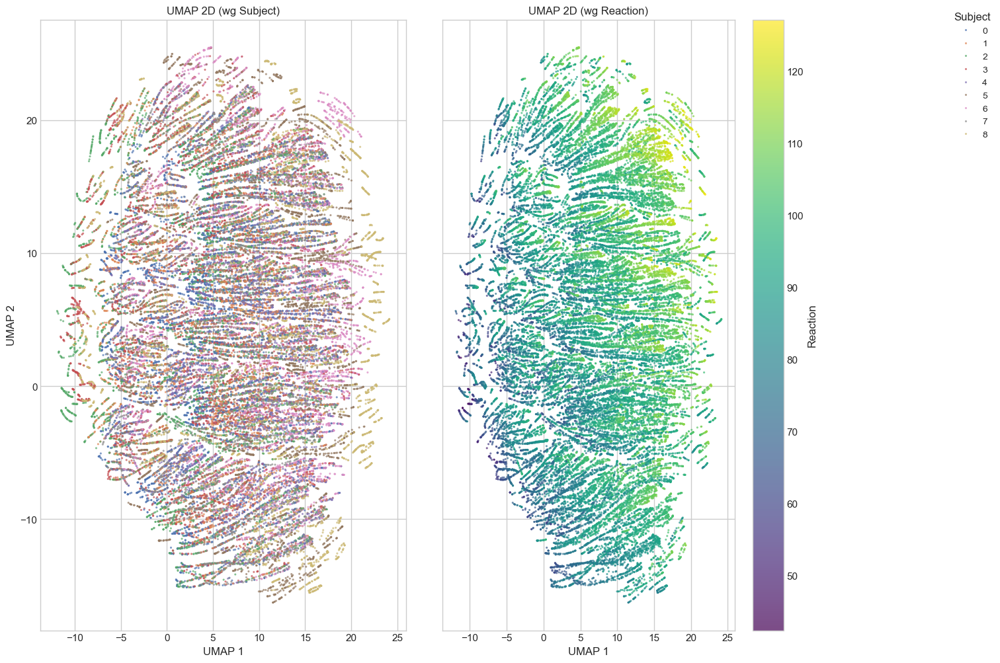

--- Wizualizacja UMAP zakończona ---

Analiza UMAP zakończona pomyślnie.


In [6]:
# Konfiguracja UMAP
DEFAULT_UMAP_CONFIG = {
    'seed': 42,
    'features_for_umap': ['Effect_Alpha', 'Effect_Beta', 'Effect_Gamma', 'Effect_Omega'],
    'subject_col': 'Subject',
    'reaction_col': 'Reaction',
    'sample_number_col': 'SampleNumber',
    # UMAP Params
    'umap_n_neighbors': 75,
    'umap_min_dist': 0.1,
    'umap_init_strategy': 'spectral', # NOWE: 'spectral', 'random', 'pca'
    'umap_add_jitter': False,
    'umap_jitter_scale': 1e-9,
    'umap_n_jobs': -1,
    'umap_random_state': None,
    'run_3d_umap': True,
    # Plotting Params
    'plot_alpha': 0.7,
    'plot_point_size': 5,
    'plot_sample_size_2d': 10000,
    'plot_sample_size_3d': 20000,
    'plot_point_size_3d_factor': 0.4,
    'subject_palette_name': 'qualitative',
    'plotly_renderer': 'vscode',
    'save_2d_plot': False,
    'plot_2d_filename': 'umap_plot_2d.png',
    'verbose': True,
}

# Funkcja UMAP 
def run_umap_core(data: np.ndarray, n_components: int, cfg: Dict) -> Optional[np.ndarray]:
    """Wykonanie UMAP z konfiguracji, w tym strategią inicjalizacji."""
    random_state = cfg.get('umap_random_state', None)
    n_jobs = cfg['umap_n_jobs']
    init_strategy = cfg.get('umap_init_strategy', 'spectral') # Pobierz strategię init

    if random_state is not None and n_jobs != 1:
        warnings.warn(f"Ustawienie 'umap_random_state' wymusi n_jobs=1.")
        n_jobs = 1

    if cfg['verbose']: print(f"  Obliczanie UMAP ({n_components}D, init='{init_strategy}')...", end='', flush=True)
    reducer = umap.UMAP(
        n_components=n_components,
        n_neighbors=cfg['umap_n_neighbors'],
        min_dist=cfg['umap_min_dist'],
        init=init_strategy, # Użyj strategii z configu
        random_state=random_state,
        n_jobs=n_jobs,
        verbose=False
    )
    try:
        embedding = reducer.fit_transform(data)
        if cfg['verbose']: print(" OK")
        if np.isnan(embedding).any():
            print(f"\nBŁĄD KRYTYCZNY: Wynik UMAP {n_components}D zawiera NaN!", file=sys.stderr)
            return None
        return embedding.astype(np.float32)
    except Exception as e:
        if cfg['verbose']: print(" BŁĄD")
        # Dodano typ błędu dla lepszej diagnostyki
        print(f"\nBŁĄD podczas obliczeń UMAP {n_components}D ({type(e).__name__}): {e}", file=sys.stderr)
        # Jeśli błąd dotyczy PCA i braku sklearn, można dodać specyficzny komunikat
        if init_strategy == 'pca' and isinstance(e, ImportError):
             print("Upewnij się, że biblioteka 'scikit-learn' jest zainstalowana dla inicjalizacji PCA.", file=sys.stderr)
        return None

# Funkcje Wizualizacji
def plot_umap_2d(df_sample: pd.DataFrame, cfg: Dict):
    """Wizualizacja 2D UMAP (mniej 'try...except')."""
    if cfg['verbose']: print("  Generowanie wykresu 2D...", end='', flush=True)

    plt.style.use('seaborn-v0_8-whitegrid')
    fig, axes = plt.subplots(1, 2, figsize=(16, 12), sharey=True)

    # --- Wykres 1: Kolor wg Subject ---
    # Usunięto zewnętrzny try-except; błąd tutaj prawdopodobnie wskazuje na większy problem
    scatter_subj = sns.scatterplot(data=df_sample, x='UMAP1', y='UMAP2', hue=cfg['subject_col'],
                                   s=cfg['plot_point_size'], alpha=cfg['plot_alpha'], linewidth=0,
                                   ax=axes[0], legend='auto')
    axes[0].set_title(f'UMAP 2D (wg {cfg["subject_col"]})')
    axes[0].set_xlabel('UMAP 1'); axes[0].set_ylabel('UMAP 2')
    # Legenda na zewnątrz (zabezpieczenie przed brakiem legendy pozostaje)
    try:
        handles, labels = axes[0].get_legend_handles_labels()
        if handles:
            axes[0].legend_.remove()
            fig.legend(handles, labels, title=cfg['subject_col'],
                       bbox_to_anchor=(0.98, 0.9), loc='upper left', fontsize='small')
    except AttributeError:
        pass # Ok, jeśli nie ma legendy do przeniesienia

    # --- Wykres 2: Kolor wg Reaction ---
    reaction_col = cfg.get('reaction_col')
    plot_title = 'UMAP 2D (Punkty)'
    if reaction_col and reaction_col in df_sample.columns:
        try:
            # Ten try-except jest uzasadniony, bo obsługuje fallback na szary kolor
            scatter_react = axes[1].scatter(df_sample['UMAP1'], df_sample['UMAP2'],
                                            c=df_sample[reaction_col], cmap='viridis',
                                            s=cfg['plot_point_size'], alpha=cfg['plot_alpha'], linewidth=0)
            fig.colorbar(scatter_react, ax=axes[1], label=reaction_col)
            plot_title = f'UMAP 2D (wg {reaction_col})'
        except Exception as e:
            axes[1].scatter(df_sample['UMAP1'], df_sample['UMAP2'], c='grey',
                            s=cfg['plot_point_size'], alpha=cfg['plot_alpha'], linewidth=0)
            plot_title = f'UMAP 2D (wg {reaction_col} - ?)'
            # Używamy warning zamiast print
            warnings.warn(f"Nie udało się pokolorować wg '{reaction_col}': {e}. Rysowanie na szaro.")
    else:
         axes[1].scatter(df_sample['UMAP1'], df_sample['UMAP2'], c='grey',
                        s=cfg['plot_point_size'], alpha=cfg['plot_alpha'], linewidth=0)

    axes[1].set_title(plot_title)
    axes[1].set_xlabel('UMAP 1')

    plt.subplots_adjust(right=0.85, wspace=0.1)

    if cfg['save_2d_plot']:
        # Try-except dla zapisu jest ważny - operacje I/O mogą zawieść
        try:
            plt.savefig(cfg['plot_2d_filename'], dpi=150, bbox_inches='tight')
            if cfg['verbose']: print(f" OK (Zapisano: {cfg['plot_2d_filename']})")
        except Exception as e:
             if cfg['verbose']: print(" BŁĄD ZAPISU")
             print(f"BŁĄD zapisu wykresu 2D do '{cfg['plot_2d_filename']}': {e}", file=sys.stderr)
    else:
         if cfg['verbose']: print(" OK")

def plot_umap_3d(df_sample: pd.DataFrame, cfg: Dict):
    """Wizualizacja 3D UMAP (zachowane kluczowe try...except)."""
    if cfg['verbose']: print("  Generowanie wykresu 3D...", end='', flush=True)
    render_ok_count = 0
    plots_attempted = 0

    try: pio.renderers.default = cfg['plotly_renderer']
    except Exception: pass # Nadal ignorujemy błąd renderera

    hover_cols = [cfg['subject_col']]
    for col in [cfg.get('reaction_col'), cfg.get('sample_number_col')]:
         if col and col in df_sample.columns: hover_cols.append(col)

    point_size_3d = max(1.0, cfg['plot_point_size'] * cfg.get('plot_point_size_3d_factor', 0.4))

    # --- Wykres 1: Kolor wg Subject ---
    plots_attempted += 1
    try:
        # Ten try-except jest ważny, bo Plotly może zawieść
        fig_subj = px.scatter_3d(
            df_sample, x='UMAP1', y='UMAP2', z='UMAP3', color=cfg['subject_col'],
            title=f'UMAP 3D (wg {cfg["subject_col"]})', opacity=cfg['plot_alpha'], hover_data=hover_cols
        )
        fig_subj.update_traces(marker=dict(size=point_size_3d))
        fig_subj.show()
        render_ok_count += 1
    except Exception as e:
        print(f"\nBŁĄD podczas tworzenia wykresu 3D (Subject): {e}", file=sys.stderr)

    # --- Wykres 2: Kolor wg Reaction ---
    reaction_col = cfg.get('reaction_col')
    if reaction_col and reaction_col in df_sample.columns:
        plots_attempted += 1
        try:
            # Ten try-except jest ważny
            fig_react = px.scatter_3d(
                df_sample, x='UMAP1', y='UMAP2', z='UMAP3', color=reaction_col,
                color_continuous_scale='Viridis', title=f'UMAP 3D (wg {reaction_col})',
                opacity=cfg['plot_alpha'], hover_data=hover_cols
            )
            fig_react.update_traces(marker=dict(size=point_size_3d))
            fig_react.show()
            render_ok_count += 1
        except Exception as e:
            print(f"\nBŁĄD podczas tworzenia wykresu 3D (Reaction): {e}", file=sys.stderr)
            if cfg['verbose']: warnings.warn(f"Problem z kolorowaniem 3D wg '{reaction_col}'.")

    # Podsumowanie statusu renderowania 3D
    if cfg['verbose']:
        if render_ok_count == plots_attempted: print(" OK")
        else: print(f" ({render_ok_count}/{plots_attempted} wykresów 3D OK)")

# Funkcja Obliczeń UMAP 
def perform_umap_calculation(data_df: pd.DataFrame, config: Dict[str, Any]) -> Optional[pd.DataFrame]:
    """Wykonuje obliczenia UMAP i zwraca DataFrame z wynikami (tylko kolumny UMAP)."""
    cfg = config
    verbose = cfg['verbose']
    if verbose: print("--- Krok 1: Przygotowanie Danych do UMAP ---")

    if not isinstance(data_df, pd.DataFrame) or data_df.empty:
        print("BŁĄD: Wejściowy DataFrame jest nieprawidłowy lub pusty.", file=sys.stderr); return None
    features = cfg['features_for_umap']
    if not all(f in data_df.columns for f in features):
        print(f"BŁĄD: Brak wymaganych kolumn cech w DataFrame: {features}", file=sys.stderr); return None

    data_clean = data_df.dropna(subset=features)
    original_indices = data_clean.index
    if len(data_clean) == 0:
        print(f"BŁĄD: Brak danych po usunięciu NaN z cech: {features}", file=sys.stderr); return None
    if verbose: print(f"  Użyto {len(data_clean)}/{len(data_df)} wierszy.")

    scaler = StandardScaler()
    scaled_data = scaler.fit_transform(data_clean[features].values)

    if cfg.get('umap_add_jitter', False):
        jitter_scale = cfg.get('umap_jitter_scale', 1e-9)
        if verbose: print(f"  Dodawanie szumu (jitter) ze skalą: {jitter_scale}")
        scaled_data += np.random.normal(0, jitter_scale, scaled_data.shape)

    if verbose: print("--- Krok 2: Obliczanie Osadzenia UMAP ---")
    embedding_2d = run_umap_core(scaled_data, n_components=2, cfg=cfg)
    if embedding_2d is None: return None

    umap_results_df = pd.DataFrame(embedding_2d, columns=['UMAP1', 'UMAP2'], index=original_indices)

    if cfg['run_3d_umap']:
        embedding_3d = run_umap_core(scaled_data, n_components=3, cfg=cfg)
        if embedding_3d is not None:
            umap_results_df['UMAP3'] = embedding_3d[:, 2]

    if verbose: print("--- Obliczenia UMAP zakończone ---")
    return umap_results_df

# Funkcja Wizualizacji Wyników UMAP 
def visualize_umap_results(data_with_umap_df: pd.DataFrame, config: Dict[str, Any]):
    """Wizualizuje istniejące wyniki UMAP."""
    cfg = config
    verbose = cfg['verbose']
    if verbose: print("--- Krok 3: Wizualizacja Wyników UMAP ---")

    if not isinstance(data_with_umap_df, pd.DataFrame) or data_with_umap_df.empty:
        print("BŁĄD: DataFrame do wizualizacji jest nieprawidłowy lub pusty.", file=sys.stderr); return
    required_cols = ['UMAP1', 'UMAP2', cfg['subject_col']]
    if not all(c in data_with_umap_df.columns for c in required_cols):
        print(f"BŁĄD: Brak wymaganych kolumn w DataFrame do wizualizacji: {required_cols}", file=sys.stderr); return

    # Wizualizacja 2D
    sample_size_2d = min(len(data_with_umap_df), cfg.get('plot_sample_size_2d', 10000))
    df_sample_2d = data_with_umap_df.sample(n=sample_size_2d, random_state=cfg.get('seed'))
    if verbose: print(f"  Próbka do 2D: {sample_size_2d} obs.")
    plot_umap_2d(df_sample_2d, cfg)

    # Wizualizacja 3D
    run_3d = cfg['run_3d_umap'] and 'UMAP3' in data_with_umap_df.columns
    if run_3d:
        sample_size_3d = min(len(data_with_umap_df), cfg.get('plot_sample_size_3d', 20000))
        df_sample_3d = data_with_umap_df.sample(n=sample_size_3d, random_state=cfg.get('seed'))
        if verbose: print(f"  Próbka do 3D: {sample_size_3d} obs.")
        # Sprawdzenie kolumn przed wywołaniem plot_umap_3d jest niejawne w tej funkcji
        plot_umap_3d(df_sample_3d, cfg)
    elif cfg['run_3d_umap'] and verbose:
         print("  Pomijanie wykresu 3D: Brak kolumny 'UMAP3'.")

    if not cfg['save_2d_plot']:
        plt.show() # Pokaż wykresy Matplotlib na końcu

    if verbose: print("--- Wizualizacja UMAP zakończona ---")

# Główna Funkcja Zintegrowana
def run_or_load_umap_analysis(
    data_df: pd.DataFrame,
    config: Optional[Dict[str, Any]] = None,
    umap_results_save_path: Optional[str] = 'umap_results_cache.pkl',
    force_recalculate: bool = False
) -> Optional[pd.DataFrame]:
    """Wykonuje analizę UMAP (oblicza lub wczytuje) i wizualizuje."""

    cfg = DEFAULT_UMAP_CONFIG.copy()
    if config: cfg.update(config)
    verbose = cfg['verbose']
    if verbose: print("--- Rozpoczynanie Analizy UMAP (Load-or-Calculate) ---")

    umap_results_df = None
    can_load = umap_results_save_path and os.path.exists(umap_results_save_path) and not force_recalculate

    if can_load:
        if verbose: print(f"Próba wczytania wyników UMAP z: '{umap_results_save_path}'")
        try:
            umap_results_df = pd.read_pickle(umap_results_save_path)
            if not isinstance(umap_results_df, pd.DataFrame) or not {'UMAP1', 'UMAP2'}.issubset(umap_results_df.columns):
                 warnings.warn("Wczytany plik nie zawiera poprawnych wyników UMAP. Obliczanie od nowa.")
                 umap_results_df = None
            elif verbose: print(f"  Wczytano {len(umap_results_df)} wyników UMAP.")
        except Exception as e:
            warnings.warn(f"Nie udało się wczytać wyników UMAP: {e}. Obliczanie od nowa.")
            umap_results_df = None

    if umap_results_df is None:
        if verbose and can_load: print("  Wczytanie nie powiodło się, obliczanie UMAP...")
        umap_results_df = perform_umap_calculation(data_df, cfg)
        if umap_results_df is None: return None # Błąd krytyczny w obliczeniach

        if umap_results_save_path:
            if verbose: print(f"  Zapisywanie wyników UMAP do: '{umap_results_save_path}'...", end='', flush=True)
            try:
                umap_results_df.to_pickle(umap_results_save_path)
                if verbose: print(" OK")
            except Exception as e:
                if verbose: print(" BŁĄD")
                print(f"BŁĄD zapisu wyników UMAP: {e}", file=sys.stderr)

    if verbose: print("--- Łączenie wyników UMAP z danymi ---")
    cols_to_add = umap_results_df.columns.difference(data_df.columns)
    final_df = data_df.join(umap_results_df[cols_to_add])

    missing_join_mask = final_df.loc[umap_results_df.index, 'UMAP1'].isnull()
    if missing_join_mask.any():
          warnings.warn(f"{missing_join_mask.sum()} wierszy nie połączono z wynikami UMAP.")
    elif verbose: print("  Połączenie wyników zakończone.")

    visualize_umap_results(final_df, cfg)
    return final_df

if __name__ == "__main__":
    warnings.filterwarnings('ignore', message='.*invalid value encountered.*')
    warnings.filterwarnings('ignore', message='.*Trying to convert non-categorical.*')
    warnings.filterwarnings('ignore', message='.*Parameters.*has the same name.*') 
    warnings.filterwarnings('ignore', category=UserWarning, module='umap.umap_') 

    try:
        if 'main_data_nested' not in locals() or main_data_nested is None:
             nazwa_pliku_pickle = 'moje_wyniki.pkl'
             if not os.path.exists(nazwa_pliku_pickle):
                 raise FileNotFoundError(f"Plik z danymi '{nazwa_pliku_pickle}' nie został znaleziony.")
             print(f"Wczytywanie danych wejściowych z: {nazwa_pliku_pickle}")
             main_data_nested = pd.read_pickle(nazwa_pliku_pickle)

        my_custom_config = {
            'verbose': True,
            'run_3d_umap': True,
            'umap_init_strategy': 'pca', # <-- Przykład użycia PCA
            # 'umap_init_strategy': 'spectral', # <-- Domyślna
            'umap_random_state': None,         # <-- None dla szybkości
            # 'umap_random_state': 42,         # <-- Liczba dla powtarzalności (wolniej)
            'plot_sample_size_2d': 40000,
            'plot_sample_size_3d': 40000,
        }
        umap_cache_file = 'umap_results_cache_pca.pkl' # Inna nazwa dla cache PCA

        final_data_with_umap = run_or_load_umap_analysis(
            data_df=training_data,
            config=my_custom_config,
            umap_results_save_path=umap_cache_file,
            force_recalculate=False
        )

        if final_data_with_umap is not None: print("\nAnaliza UMAP zakończona pomyślnie.")
        else: print("\nAnaliza UMAP zakończyła się błędem.")

    except FileNotFoundError as e: print(f"BŁĄD KRYTYCZNY: {e}")
    except NameError as e: print(f"BŁĄD KRYTYCZNY: Brak zmiennej/funkcji: {e}")
    except ImportError as e: print(f"BŁĄD KRYTYCZNY: Brak biblioteki: {e}")
    except Exception as e:
        print(f"\nWystąpił nieoczekiwany błąd krytyczny: {e}")
        traceback.print_exc() 

### Analiza UMAP

**UMAP (Uniform Manifold Approximation and Projection)** to technika **redukcji wymiarowości**, zastosowana tutaj do wizualizacji wielowymiarowej struktury danych. Celem UMAP jest rzutowanie rzeczywistej wielowymiarowej zależności (tutaj 4 wymiary efektów: `Effect_Alpha`, `Effect_Beta`, `Effect_Gamma`, `Effect_Omega`) na niższą przestrzeń (`2D` lub `3D`), aby uwidocznić strukturę, a separacja kolorów jest kluczową obserwacją.

UMAP zastosowano tu do redukcji wymiarowości, rzutując cztery obliczone efekty (`Effect_*`), które wpływają na `Reaction`, do przestrzeni `2D` i `3D`, aby wizualnie zbadać strukturę tej zależności. Lewy panel (kolory według `Subject`) pokazuje, że obserwacje dla różnych podmiotów tworzą **częściowo odseparowane skupiska**, co sugeruje, że kombinacje efektów różnią się systematycznie między podmiotami i potencjalnie nadają się do modelowania na poziomie indywidualnym. Prawy panel (kolory według `Reaction`) ujawnia **wyraźny gradient i separację kolorystyczną** wzdłuż osi UMAP, wskazując, że niska wymiarowość dobrze oddaje zmienność `Reaction` i że ta struktura (powiązanie rzutowanych efektów z `Reaction`) jest obiecująca dla dalszego modelowania.

# Rozszerzone Modele Liniowe Mieszane (LLM)

## Liniowy Model Mieszany (LMM)

### Cel i Podstawowa Struktura Modelu

**Liniowy Model Mieszany (LMM)** zastosowany w tej analizie ma na celu wyjaśnienie zmienności w zmiennej odpowiedzi `Reaction`. Model stara się powiązać tę zmienność z warunkami eksperymentalnymi (`Alpha_Condition`, `Beta_Condition`, `Gamma_Condition`) oraz upływem czasu/kolejnością próby (`SampleNumber`), jednocześnie uwzględniając fakt, że dane pochodzą od wielu różnych podmiotów (`Subject` - w przykładzie 9 podmiotów w zbiorze treningowym).

Struktura modelu bezpośrednio odzwierciedla **zagnieżdżony i powtarzalny charakter** procesu generowania danych: dla każdego podmiotu (`Subject`) mierzono `Reaction` wielokrotnie, dla każdej możliwej kombinacji poziomów warunków Alpha/Beta/Gamma, przy różnych (losowo wybranych) wartościach `SampleNumber` w ramach tych kombinacji. LMM jest odpowiedni do analizy takich danych hierarchicznych, gdzie obserwacje wewnątrz jednego podmiotu mogą być bardziej do siebie podobne niż obserwacje pochodzące od różnych podmiotów.

### Struktura Efektów Stałych

Efekty stałe w modelu opisują **średnie trendy i zależności** obserwowane w całej analizowanej populacji (tutaj: w zbiorze treningowym).

* **Efekt Czasu (`SampleNumber`):** W modelu uwzględniono prosty, **liniowy efekt stały** dla `SampleNumber`. Ma on na celu uchwycenie średniego, liniowego spadku (lub wzrostu) wartości `Reaction` w miarę postępu prób, co odpowiada średniej populacyjnej komponentu `Effect_Omega` użytego w symulacji.
* **Efekty Warunków (`Alpha`, `Beta`, `Gamma`):** Aby precyzyjnie zamodelować potencjalnie **nieliniowy** wpływ warunków `Alpha_Condition`, `Beta_Condition` i `Gamma_Condition` na `Reaction` (zgodnie ze złożonymi funkcjami: paraboli, sigmoidy i sinusoidy, które generowały `Effect_Alpha/Beta/Gamma` w symulacji), w części efektów stałych modelu zastosowano **funkcje sklejane (splajny bazowe)**, np. za pomocą `patsy.bs()`. Splajny pozwalają elastycznie dopasować krzywą do danych *bez* konieczności zakładania z góry dokładnej formy matematycznej (parabola, sigmoida, sinusoida), co byłoby trudne do zapisania w standardowej formule LMM. Modelują one *średni* kształt zależności `Reaction` od każdego z warunków w populacji. Wybór parametrów splajnów (np. liczba węzłów, stopień wielomianu) wpływa na elastyczność dopasowanej krzywej.

### Struktura Efektów Losowych

Efekty losowe służą do modelowania **zmienności międzyosobniczej**, czyli tego, jak poszczególne podmioty (`Subject`) różnią się od siebie, nawet przy tych samych warunkach i czasie. W opisywanym modelu przyjęto stosunkowo prostą strukturę efektów losowych:

* **Losowy Intercept (Wyraz Wolny):** Dla każdego `Subject` model estymuje indywidualne odchylenie od średniego, stałego interceptu (`fixed_intercept`). Modeluje to stałe, bazowe różnice w poziomie `Reaction` między podmiotami.
* **Losowe Nachylenie dla `SampleNumber`:** Dla każdego `Subject` model estymuje indywidualne odchylenie od średniego, stałego nachylenia dla `SampleNumber` (`mean_omega_slope`). Pozwala to modelować indywidualne różnice w tempie *liniowej* zmiany `Reaction` w czasie, co częściowo odpowiada zmienności parametru `slope_cycle_subj` wprowadzonej podczas generowania danych.

Formuła efektów losowych (parametr `re_formula` w `statsmodels`) dla takiej struktury ma zazwyczaj postać `~ 1 + SampleNumber`.

### Wyzwania Obliczeniowe i Funkcja `fit_lmm_safely`

Dopasowanie modeli LMM, szczególnie tych zawierających efekty nieliniowe (jak splajny) i złożone struktury losowe, może być **wymagające obliczeniowo i numerycznie niestabilne**. Standardowe algorytmy optymalizacyjne mogą mieć problemy ze zbieżnością (znalezieniem optymalnych parametrów modelu) lub zwracać wyniki obarczone błędami numerycznymi lub ostrzeżeniami.

Właśnie dlatego wprowadzono funkcję **`fit_lmm_safely`**. Jej celem jest **solidne i bezpieczne** przeprowadzenie procesu dopasowania modelu LMM:
* **Testowanie Wielu Optymalizatorów:** Funkcja automatycznie próbuje dopasować model przy użyciu listy różnych algorytmów optymalizacyjnych (np. `lbfgs`, `powell`, `cg`, `bfgs`), zaczynając od preferowanego.
* **Wybór Najlepszego Wyniku:** Wybiera wynik z pierwszego optymalizatora, który osiągnął zbieżność (`converged=True`) i nie zgłosił istotnych ostrzeżeń systemowych podczas dopasowania (wynik "czysty"). Jeśli żaden optymalizator nie dał "czystego" wyniku, funkcja zwraca najlepszy spośród tych, które w ogóle zbiegły (np. ten z najwyższą wartością log-wiarygodności), ale sygnalizuje obecność ostrzeżeń.
* **Obsługa Błędów i Ostrzeżeń:** Przechwytuje i rejestruje błędy krytyczne (np. `LinAlgError`, `MemoryError`) oraz ostrzeżenia systemowe (np. o braku zbieżności, problemach z macierzą Hessego), zwracając je w słowniku wynikowym dla późniejszej analizy.
* **Zarządzanie Pamięcią:** Zawiera mechanizmy (`gc.collect()`, `del`) wspomagające zarządzanie pamięcią RAM podczas testowania wielu optymalizatorów.
* **Elastyczność:** Przyjmuje formułę dla efektów stałych (`formula`), formułę dla efektów losowych (`re_formula`), dane (`data`), nazwę kolumny grupującej (`group_col`) oraz inne parametry kontrolujące proces dopasowania (np. `maxiter`, `use_ml` dla estymacji ML/REML).

Użycie `fit_lmm_safely` znacząco zwiększa szansę na uzyskanie wiarygodnego wyniku dopasowania modelu LMM, nawet przy złożonych formułach i potencjalnie trudnych danych.

### Ograniczenia Opisanego LMM vs. Proces Generowania Danych

Należy **wyraźnie podkreślić**, że opisany powyżej, standardowy model LMM (nawet ze splajnami w części stałej i losowym interceptem/nachyleniem czasowym) **nie jest w stanie w pełni zamodelować całej złożoności**, która została celowo wprowadzona podczas generowania danych symulacyjnych.

Główne ograniczenia tego LMM w stosunku do danych:
* **Brak Modelowania Losowej Zmienności Kształtu Nieliniowych Efektów:** Podczas generowania danych, parametry określające *kształt* nieliniowych odpowiedzi na warunki Alpha, Beta i Gamma były **losowe i specyficzne dla każdego podmiotu** (np. `alpha_center_subj`, `alpha_range_subj`, `beta_steepness_subj`, `beta_max_subj`, `gamma_amp_subj`). Standardowy LMM z losowym interceptem i nachyleniem czasowym **nie modeluje** tej zmienności w kształcie krzywych między podmiotami. Wszelkie nieliniowości modelowane przez splajny w części stałej reprezentują jedynie *średni* kształt dla całej populacji.
* **Uproszczona Zmienność Czasowa:** Model uwzględnia tylko losową zmienność w *liniowym* trendzie czasowym, podczas gdy dane mogłyby potencjalnie zawierać bardziej złożone, nieliniowe wzorce czasowe różniące się między osobnikami.

Aby w pełni uchwycić bogactwo wygenerowanych danych, konieczne byłoby zastosowanie bardziej zaawansowanych technik, takich jak:
* **Uogólnione Addytywne Modele Mieszane (GAMM)**: Pozwalają one na włączenie losowych krzywych sklejalnych (random smooths), które mogą modelować zmienność kształtu nieliniowych zależności między podmiotami.
* **Nieliniowe Modele Mieszane (NLMM)**: Wymagają jawnego zdefiniowania nieliniowej funkcji, ale pozwalają na losowe efekty w parametrach tej funkcji.
* **Podejście Bayesowskie**: Oferuje dużą elastyczność w definiowaniu złożonych modeli hierarchicznych z różnymi poziomami efektów losowych.

### Podsumowanie

Opisany LMM stanowi narzędzie do analizy danych hierarchicznych, pozwalając elastycznie modelować średnie zależności (w tym nieliniowe, dzięki splajnom) oraz podstawową zmienność międzyosobniczą (różnice w poziomie bazowym i liniowym trendzie czasowym). Funkcja `fit_lmm_safely` zapewnia proces estymacji parametrów tego modelu, jednak pamiętać należy o jego ograniczeniach w kontekście bogatszej struktury wygenerowanych danych, której pełne zamodelowanie wymagałoby bardziej zaawansowanych metod statystycznych.

In [6]:
def fit_lmm_safely(formula: str,
                   re_formula: str,
                   data: pd.DataFrame,         # Oczekuje danych ze skonwertowaną kolumną group_col
                   group_col: str = "Subject", # Nadal potrzebne do formuły i wewnętrznie przez statsmodels
                   optimizers: list = ['lbfgs', 'powell', 'cg', 'bfgs'],
                   preferred_optimizer: str = 'lbfgs',
                   maxiter: int = 10000,
                   verbose: bool = False,      # Kontroluje drukowanie postępów
                   use_ml: bool = True,
                   optimizer_kwargs: dict = None
                   ) -> dict:
    """
    Próbuje dopasować model MixedLM żądaną metodą (ML lub REML),
    testując różne optymalizatory. Wybiera najlepszy zbieżny wynik.
    Używa full_output=False. "Czysty" wynik oznacza converged=True
    i brak istotnych ostrzeżeń systemowych złapanych podczas fit.
    Weryfikacja Hesjanu/Score musi być wykonana poza funkcją.

    Optymalizacje RAM:
    - Nie kopiuje wewnętrznie danych wejściowych ('data'). Wymaga pre-konwersji group_col.
    - Używa `gc.collect()` i `del` do sprzątania obiektów w pętli.
    
    Args:
        formula: Formuła modelu (efekty stałe, np. "Reaction ~ Var1 + Var2").
        data: DataFrame z danymi.
        group_col: Nazwa kolumny grupującej (np. "Subject").
        re_formula: Formuła dla macierzy kowariancji efektów losowych (np. "~ 1 + Time").
                    Jeśli None, domyślnie tylko losowe intercepty.
        vc_formula: Słownik dla bardziej zaawansowanych struktur wariancji/kowariancji.
        use_ml: Czy użyć estymacji ML zamiast REML.
        maxiter: Maksymalna liczba iteracji optymalizatora.
        optimizer: Nazwa optymalizatora (np. 'bfgs', 'lbfgs', 'cg', 'powell', 'nm').
        verbose: Czy wyświetlać komunikaty o przebiegu.

    Returns:
        Słownik zawierający:
        - 'result': Obiekt wyniku dopasowania (MixedLMResults) lub None w razie błędu.
        - 'converged_cleanly': True, jeśli dopasowanie zakończyło się bez błędów i ostrzeżeń o konwergencji.
        - 'error_message': Komunikat błędu (jeśli wystąpił).
        - 'unique_warnings_list': Lista unikalnych ostrzeżeń złapanych podczas dopasowania.
    """

    # Inicjalizacje 
    best_result = None  # Przechowuje najlepszy obiekt MixedLMResults
    best_optimizer_name = None
    best_loglike = -np.inf
    converged_cleanly = False     # Czy znaleziono wynik zbieżny i bez krytycznych ostrzeżeń?
    any_warnings_detected = False # Czy jakikolwiek optymalizator zgłosił ostrzeżenie?
    fit_time = np.nan             # Czas dopasowania dla najlepszego modelu
    final_error_message = None    # Ostatni napotkany błąd krytyczny
    tried_optimizers = []         # Lista testowanych optymalizatorów
    all_caught_warnings = []      # Lista *unikalnych* ostrzeżeń ze *wszystkich* prób

    fitting_method = "ML (reml=False)" if use_ml else "REML (reml=True)"
    # Komunikaty drukowane tylko jeśli verbose=True
    if verbose: print(f"    Fitting model using method: {fitting_method}")

    if not isinstance(data[group_col].dtype, pd.CategoricalDtype):
         warnings.warn(f"Kolumna grupująca '{group_col}' nie jest typu 'category'. Może to wpłynąć na wydajność/pamięć.", UserWarning)
    data_internal = data

    # --- Przygotowanie listy optymalizatorów ---
    optimizers_to_test = [preferred_optimizer] + [opt for opt in optimizers if opt != preferred_optimizer]
    optimizers_to_test = list(dict.fromkeys(optimizers_to_test)) # Usuwa duplikaty jeśli preferred był też w liście

    # --------------------------------------------------------------------------
    # Pętla Robust Search po optymalizatorach
    # --------------------------------------------------------------------------
    for i, optimizer in enumerate(optimizers_to_test):
        tried_optimizers.append(optimizer)
        if verbose: print(f"      [{i+1}/{len(optimizers_to_test)}] Trying optimizer: {optimizer}...")
        iter_start_time = time.time()
        iter_result_object = None # Wynik dla bieżącego optymalizatora
        iter_converged = False
        iter_sys_warning = False # Czy wystąpiło krytyczne ostrzeżenie systemowe w tej iteracji?
        iter_error_msg = None # Komunikat błędu dla tej iteracji
        _model = None # Obiekt definicji modelu

        try:
            # --- Kontekst łapania ostrzeżeń ---
            with warnings.catch_warnings(record=True) as caught_warnings_runtime:
                warnings.simplefilter("always") # Łap wszystkie ostrzeżenia

                # --- Dopasowanie modelu ---
                # Tworzymy obiekt modelu (stosunkowo lekki)
                _model = smf.mixedlm(formula, data_internal, groups=data_internal[group_col], re_formula=re_formula)

                # Argumenty dla metody fit
                fit_args = { 'method': [optimizer], 'maxiter': maxiter, 'reml': not use_ml, 'full_output': False }
                if optimizer_kwargs:
                    fit_args['optimizer_kwargs'] = optimizer_kwargs
                    if verbose: print(f"        Using common optimizer_kwargs: {optimizer_kwargs}")
                # 'disp' nie jest bezpośrednio używane w fit() przy full_output=False; postęp kontrolowany przez 'verbose'

                # Ten krok zużywa najwięcej pamięci i czasu
                iter_result_object = _model.fit(**fit_args)

                # --- Sprawdzenie zbieżności ---
                iter_converged = getattr(iter_result_object, 'converged', False)
                fit_duration = time.time() - iter_start_time
                status_msg = "converged=True" if iter_converged else "converged=False"
                if verbose: print(f"        Fit completed. Status: {status_msg} (Time: {fit_duration:.2f}s)")

                # Brak zbieżności traktujemy jako ostrzeżenie systemowe
                if not iter_converged:
                    iter_sys_warning = True
                    conv_warn_msg = f"Optimizer '{optimizer}' failed to converge after {fit_duration:.1f}s."
                    # Dodajemy do globalnej listy unikalnych ostrzeżeń
                    if conv_warn_msg not in all_caught_warnings:
                        all_caught_warnings.append(conv_warn_msg)
                    any_warnings_detected = True # Oznaczamy globalnie

                # --- Analiza złapanych ostrzeżeń systemowych (jeśli zbiegł lub nie) ---
                iter_caught_warnings_details = [] # Ostrzeżenia tylko z tej iteracji
                if caught_warnings_runtime:
                    for w in caught_warnings_runtime:
                        # Ignoruj DeprecationWarning
                        if isinstance(w.category, DeprecationWarning): continue

                        msg_str = str(w.message)
                        category_name = w.category.__name__

                        # Sprawdzamy kluczowe ostrzeżenia wskazujące na potencjalne problemy
                        keywords = ['singular matrix', 'singular hessian', 'hessian', 'positive definite',
                                    'optimization', 'boundary', 'iteration limit', 'converge', 'failed',
                                    'line search', 'precision loss'] # Dodano precision loss
                        is_critical_warning = any(k in msg_str.lower() for k in keywords)

                        # Jeśli ostrzeżenie jest krytyczne lub pochodzi od statsmodels (pomijając ogólne UserWarning)
                        # Sprawdzamy też, czy nie jest to samo ostrzeżenie o braku zbieżności, które już dodaliśmy
                        if (is_critical_warning or not isinstance(w.category, UserWarning)) and "converge" not in msg_str.lower():
                            full_warning_msg = f"[{category_name}] {msg_str}"
                            if full_warning_msg not in all_caught_warnings:
                                all_caught_warnings.append(full_warning_msg)
                            iter_caught_warnings_details.append(full_warning_msg)
                            iter_sys_warning = True # Oznaczamy jako problem systemowy
                            any_warnings_detected = True # Oznaczamy globalnie

                # Wydrukuj ostrzeżenia z tej iteracji, jeśli verbose=True
                if iter_caught_warnings_details and verbose:
                    print(f"        System Warnings ({optimizer}):")
                    for warn_msg in iter_caught_warnings_details: print(f"          - {warn_msg[:150]}{'...' if len(warn_msg)>150 else ''}")

            # --- Koniec bloku `with warnings.catch_warnings` ---

            # --- Aktualizacja najlepszego wyniku ---
            # Działamy tylko jeśli bieżąca iteracja dała zbieżny wynik
            if iter_result_object is not None and iter_converged:
                iter_loglike = getattr(iter_result_object, 'llf', -np.inf)
                # "Czysty" = Zbieżny + Brak krytycznych ostrzeżeń systemowych *w tej iteracji*
                iter_is_clean = iter_converged and not iter_sys_warning

                # Scenariusz 1: Znaleziono PIERWSZY CZYSTY wynik
                if iter_is_clean and not converged_cleanly:
                    if verbose: print(f"        Found first CLEAN result ({fitting_method}) with {optimizer} (LogLik: {iter_loglike:.2f}). Replacing previous best (if any).")
                    # Usuń stary 'best_result' zanim przypiszemy nowy
                    if best_result is not None:
                        del best_result
                        gc.collect() # Opcjonalnie, może spowolnić, ale uwalnia pamięć szybciej
                    best_result = iter_result_object
                    best_optimizer_name = optimizer
                    best_loglike = iter_loglike
                    converged_cleanly = True # Mamy czysty wynik!
                    fit_time = fit_duration
                    final_error_message = None # Nadpisujemy ewentualne wcześniejsze błędy
                    iter_result_object = None # Zapobiega usunięciu w 'finally', bo jest już w 'best_result'
                    # Znaleziono optymalny wynik, można przerwać pętlę optymalizatorów
                    break

                # Scenariusz 2: Nie mamy jeszcze czystego wyniku, ale znaleźliśmy:
                #               a) Pierwszy jakikolwiek zbieżny wynik
                #               b) Lepszy zbieżny wynik (wyższy LogLik) niż dotychczasowy (który też nie był czysty)
                elif not converged_cleanly and (best_result is None or iter_loglike > best_loglike):
                    status = "clean" if iter_is_clean else "with warnings" # Status tego konkretnego wyniku
                    update_reason = "first CONVERGED" if best_result is None else f"BETTER converged (LogLik: {iter_loglike:.2f} > {best_loglike:.2f})"
                    if verbose: print(f"        Found {update_reason} result ({fitting_method}, {status}) with {optimizer}. Replacing previous best.")
                    # Usuń stary 'best_result'
                    if best_result is not None:
                        del best_result
                        # gc.collect() # Opcjonalnie
                    best_result = iter_result_object
                    best_optimizer_name = optimizer
                    best_loglike = iter_loglike
                    fit_time = fit_duration
                    # Zapisz komunikat o ostrzeżeniach z tej iteracji jako potencjalny final_error_message
                    # Zostanie on nadpisany, jeśli później znajdziemy czysty wynik lub wystąpi krytyczny błąd
                    if iter_sys_warning:
                        final_error_message = f"Best result from '{optimizer}' converged but had warnings: {iter_caught_warnings_details}"
                    else:
                         final_error_message = None # Ten wynik jest ok, ale może być nadpisany później
                    iter_result_object = None # Zapobiega usunięciu w 'finally'

                # Scenariusz 3: Mamy już jakiś wynik (czysty lub nie), a ten jest gorszy - ignorujemy
                # W tym przypadku iter_result_object nie jest ustawiany na None i zostanie usunięty w 'finally'

            # Jeśli wystąpił błąd krytyczny (wyjątek) w tej iteracji i nie mamy jeszcze *żadnego* wyniku,
            # zapisz ten błąd jako potencjalny komunikat końcowy.
            if iter_error_msg and best_result is None:
                 final_error_message = iter_error_msg

        # --- Obsługa wyjątków krytycznych (łapane poza `with warnings`) ---
        except np.linalg.LinAlgError as lae: iter_error_msg = f"LinAlgError with {optimizer}: {lae}"; print(f"      CRITICAL ERROR: {iter_error_msg}"); iter_sys_warning = True; any_warnings_detected = True; iter_converged = False
        except sm.tools.sm_exceptions.ConvergenceWarning as cw: iter_error_msg = f"ConvergenceWarning Exception with {optimizer}: {cw}"; print(f"      WARNING Exception: {iter_error_msg}"); iter_sys_warning = True; any_warnings_detected = True; iter_converged = False
        except ValueError as ve: iter_error_msg = f"ValueError with {optimizer}: {ve}"; print(f"      CRITICAL ERROR: {iter_error_msg}"); iter_sys_warning = True; any_warnings_detected = True; iter_converged = False
        except MemoryError as me: iter_error_msg = f"MemoryError with {optimizer}: {me}"; print(f"      CRITICAL ERROR: {iter_error_msg}"); iter_sys_warning = True; any_warnings_detected = True; iter_converged = False; raise me # Przerwij całkowicie przy braku pamięci
        except Exception as e: iter_error_msg = f"Unexpected Error with {optimizer}: {e}\n{traceback.format_exc(limit=1)}"; print(f"      Unexpected ERROR: {iter_error_msg}"); iter_sys_warning = True; any_warnings_detected = True; iter_converged = False

        # --- Sprzątanie po każdej iteracji optymalizatora ---
        finally:
            # Usuń obiekt definicji modelu, jeśli został stworzony
            if _model is not None:
                del _model
            # Usuń obiekt wyniku iteracji, *tylko jeśli nie został* przypisany do best_result
            # (bo jeśli został, to referencja jest w `best_result` i nie chcemy jej usuwać)
            if iter_result_object is not None:
                del iter_result_object
            # Okresowe lub warunkowe wywołanie garbage collectora
            # Wywołaj co 5 iteracji lub jeśli wystąpił problem (ostrzeżenie/błąd)
            if iter_sys_warning or iter_error_msg or (i % 5 == 4):
                if verbose: print(f"        Running garbage collection after optimizer '{optimizer}'...")
                collected_count = gc.collect() # Wywołaj GC
                if verbose: print(f"        Garbage collection done (collected {collected_count} objects).")
    
    # Przygotowanie finalnego wyniku funkcji
    aic = np.nan; bic = np.nan; loglike = np.nan

    if best_result is not None:
        final_method_used = fitting_method
        final_optimizer = best_optimizer_name
        # final_warnings = True jeśli najlepszy model nie był 'czysty' (miał iter_sys_warning)
        final_warnings = not converged_cleanly
        try:
            loglike = best_result.llf
            # Licz AIC/BIC tylko dla ML i jeśli loglike jest dostępne i skończone
            if use_ml and pd.notna(loglike) and np.isfinite(loglike):
                try: aic = best_result.aic
                except AttributeError: pass
                try: bic = best_result.bic
                except AttributeError: pass
        except AttributeError:
             loglike = -np.inf
    else: # Nic nie zadziałało
        final_method_used = "Failed"
        final_optimizer = None
        converged_cleanly = False
        final_warnings = True
        # final_error_message powinien zawierać błąd ostatniej nieudanej próby

    # Zwracany słownik - zawiera najlepszy obiekt 'result' lub None
    return_dict = {
        'result': best_result,
        'converged_cleanly': converged_cleanly,
        'warnings_detected': final_warnings, # Czy najlepszy wynik miał ostrzeżenia?
        'any_warnings_detected_overall': any_warnings_detected, # Czy jakikolwiek optymalizator miał ostrzeżenia?
        'unique_warnings_list': sorted(list(set(all_caught_warnings))), # Unikalne ostrzeżenia ze wszystkich prób
        'best_optimizer': final_optimizer,
        'aic': aic, 'bic': bic, 'loglike': loglike,
        'time': fit_time,
        'error_message': final_error_message,
        'tried_optimizers': tried_optimizers,
        'method_used': final_method_used,
    }

    # Ostateczne sprzątanie przed zwróceniem wyniku, zwłaszcza dużych list
    del all_caught_warnings
    del tried_optimizers
    gc.collect()

    return return_dict

## Generowanie Struktur Liniowych Modeli Mieszanych (LMM)

In [18]:
# --- Kluczowe Nazwy Zmiennych ---
REACTION_VAR: str = "Reaction"
CONDITIONS: List[str] = ["Alpha_Condition", "Beta_Condition", "Gamma_Condition"]
TIME_VAR: str = "SampleNumber"
SUBJECT_VAR: str = "Subject" 

# --- Konfiguracja Generowania FE ---
FE_CONFIG = {
    # --- Poziom 1 ---
    "base_spline_configs": OrderedDict([ # Używamy OrderedDict dla spójnej kolejności FE
        ("d2g2", (2, 2)), 
        ("d3g2", (3, 2)), ("d3g3", (3, 3)),
        ("d4g2", (4, 2)), ("d4g3", (4, 3)), ("d4g4", (4, 4)) 
    ]),
    # --- NOWOŚĆ: Poziom 1.5 - Splajny dla Czasu ---
    "time_spline_configs": OrderedDict([ # Konfiguracje dla bs(TIME_VAR)
        ("tdf2d2", (2, 2)),
        ("tdf3d2", (3, 2)), 
        ("tdf3d3", (3, 3)),
    ]),
    "apply_time_splines_to": ["bases_only"], # Gdzie dodać splajny czasu? 'bases_only', 'bases_with_lin_time', 'both'
    # --- Poziom 3 ---
    "quadratic_time": {
        # Lista nazw (bez _LinTime) baz FE, do których *może* zostać dodany czas kwadratowy
        # Jeśli baza nie istnieje (np. ograniczono base_spline_configs), zostanie pominięta.
         "eligible_bases": ["SplineCond(d3g2)", "SplineCond(d3g3)", "SplineCond(d4g3)"],
         "term": f"I({TIME_VAR}**2)"
     },
    # --- Poziomy 4, 5, 6 ---
    "interactions": {
        # Lista baz FE (z _LinTime), do których dodajemy interakcje LINIOWE (Poziom 4)
        "linear_interaction_bases": ["SplineCond(d3g3)_LinTime", "SplineCond(d2g2)_LinTime"], # <<< NOWOŚĆ: Lista baz
        # Baza FE (z _LinTime) i konfiguracja splajnu dla interakcji SPLAJN:SPLAJN i SPLAJN:CZAS (Poziomy 5, 6)
        # Ograniczamy do jednej bazy dla uproszczenia, ale można by to rozszerzyć
        "spline_interaction_base": "SplineCond(d3g3)_LinTime",
        "spline_config_for_interactions": "d3g3", # Sufix ('d3g3') odpowiadający bazie powyżej
        "condition_shorts": ["A", "B", "G"] # Skróty dla nazw warunków
    }
}

# --- Konfiguracja Generowania RE ---
RE_CONFIG = {
    "condition_shorts": ["A", "B", "G"], # Skróty dla nazw warunków w nazwach RE
    # --- Grupa 3 ---
    "g3_spline_types": OrderedDict([     # Konfiguracje splajnów dla RE w Grupie 3
        ("d2g2", (2, 2)), ("d3g2", (3, 2)), ("d3g3", (3, 3))
    ]),
    # --- NOWOŚĆ: Grupy 4 i 5 - Systematyczne generowanie ---
    "systematic_re": {
        "slope_terms": OrderedDict([ # Terminy do kombinacji w RE (NazwaSkrócona: TerminFormuły)
             ("Time", TIME_VAR),
             ("A", CONDITIONS[0]),
             ("B", CONDITIONS[1]),
             ("G", CONDITIONS[2])
         ]),
         "max_slopes_g4": 2, # Liczba nachyleń w Grupie 4
         "max_slopes_g5": 3  # Liczba nachyleń w Grupie 5
         # UWAGA: Można by dodać tu terminy splajnowe np. {"bsA_d2g2": make_spline_term(CONDITIONS[0], 2, 2)}
         # ale na razie trzymamy się tylko liniowych dla G4/G5 dla prostoty.
    }
}

# ==========================================================
# === Funkcje Pomocnicze ===
# ==========================================================

def make_spline_term(var: str, df: int, degree: int) -> str:
    """Tworzy string termu splajnu bs() dla formuł."""
    return f"bs({var}, df={int(df)}, degree={int(degree)})"

def build_formula(base: str, *args: Any) -> str:
    """Łączy bazę formuły z dodatkowymi termami."""
    valid_args = [str(arg) for arg in args if arg]
    if not valid_args:
        return base
    # Proste sprawdzenie, aby unikać "X + X" - działa dla podstawowych przypadków
    base_terms = set(term.strip() for term in base.split("~")[1].split("+"))
    new_args = [arg for arg in valid_args if arg.strip() not in base_terms]
    if not new_args:
         return base
    return f"{base} + {' + '.join(new_args)}"

def _find_formula_by_name(name_to_find: str, definitions: OrderedDictType[str, str]) -> Optional[str]:
    """Pomocnik do znajdowania formuły w słowniku po jej nazwie."""
    return next((f for f, n in definitions.items() if n == name_to_find), None)

def _add_term_if_unique(formula: str, name: str, definitions: OrderedDictType[str, str]):
    """Dodaje formułę i nazwę do słownika, jeśli formuła jest unikalna."""
    if formula not in definitions:
        definitions[formula] = name

# ==========================================================
# === Krok 1: Funkcja Generująca Struktury FE ===
# ==========================================================

def generate_fe_structures(config: Dict[str, Any], reaction_var: str, conditions: List[str], time_var: str) -> Tuple[OrderedDictType[str, str], Dict[str, Dict[str, str]]]:
    """Generuje programistycznie struktury efektów stałych (FE)."""
    print("\n--- Generowanie Struktur FE ---")
    fe_definitions = OrderedDict()
    spline_terms_cache = {} # Cache: {suffix: {cond_name: spline_term}}
    time_spline_cache = {}  # Cache: {suffix: time_spline_term}

    # --- Poziom 1: Bazowe splajny dla warunków (bez czasu) ---
    print(" Poziom 1: Generowanie bazowych splajnów warunków...")
    base_cond_spline_formulas = [] # Przechowuje formuły bazowe do późniejszego użycia
    for name_suffix, (df, degree) in config["base_spline_configs"].items():
        current_spline_terms = {c: make_spline_term(c, df, degree) for c in conditions}
        spline_terms_cache[name_suffix] = current_spline_terms
        formula_base = f"{reaction_var} ~ {' + '.join(current_spline_terms.values())}"
        name = f"SplineCond({name_suffix})"
        _add_term_if_unique(formula_base, name, fe_definitions)
        base_cond_spline_formulas.append((name, formula_base)) # Zapisz nazwę i formułę
    print(f"   ... Liczba struktur FE po Poziomie 1: {len(fe_definitions)}")

    # --- NOWOŚĆ: Poziom 1.5 - Dodawanie splajnów czasu ---
    if config.get("time_spline_configs"):
         print(" Poziom 1.5: Dodawanie splajnów czasu...")
         apply_to = config.get("apply_time_splines_to", [])
         formulas_to_modify = []

         # Zbierz formuły bazowe do modyfikacji
         if "bases_only" in apply_to:
             formulas_to_modify.extend(base_cond_spline_formulas)
         if "bases_with_lin_time" in apply_to:
              # Znajdź formuły z LinTime powstałe z baz z Poziomu 1
              for base_name, _ in base_cond_spline_formulas:
                   lin_time_name = f"{base_name}_LinTime"
                   formula = _find_formula_by_name(lin_time_name, fe_definitions)
                   if formula:
                        formulas_to_modify.append((lin_time_name, formula))

         # Generuj i dodawaj splajny czasu
         for time_suffix, (df, degree) in config["time_spline_configs"].items():
             time_spline_term = make_spline_term(time_var, df, degree)
             time_spline_cache[time_suffix] = time_spline_term
             for name_base, formula_base in formulas_to_modify:
                  # Unikaj dodawania splajnu czasu do formuł już go zawierających (np. jeśli dodajemy do _LinTime)
                  if time_var in formula_base and not formula_base.endswith(time_var): # Heurystyka: sprawdź czy jest time_var, ale nie na końcu jako pojedynczy termin liniowy
                      print(f"    Ostrzeżenie: Pomijanie dodawania {time_spline_term} do '{name_base}', która może już zawierać efekt czasu.")
                      continue

                  # Decyzja: Czy zastąpić liniowy czas, czy dodać? Na razie dodajemy.
                  # Jeśli chcemy zastąpić, potrzebna bardziej złożona logika usuwania TIME_VAR
                  formula_with_time_spline = build_formula(formula_base, time_spline_term)
                  name_with_time_spline = f"{name_base}_SplineTime({time_suffix})"
                  _add_term_if_unique(formula_with_time_spline, name_with_time_spline, fe_definitions)
         print(f"   ... Liczba struktur FE po Poziomie 1.5: {len(fe_definitions)}")


    # --- Poziom 2: Dodawanie liniowego efektu czasu (do baz, które go jeszcze nie mają) ---
    print(" Poziom 2: Dodawanie liniowego efektu czasu do baz...")
    # Dodajemy tylko do tych baz z Poziomu 1, które nie zostały już zmodyfikowane przez dodanie czasu w innej formie
    initial_fe_defs = list(fe_definitions.items()) # Kopia przed dodaniem czasu lin/quad/spline
    added_linear_time_bases = set() # Zbiór nazw baz, do których dodano czas liniowy
    for formula_base, name_base in initial_fe_defs:
        # Sprawdź czy nazwa nie zawiera już oznaczenia czasu
        has_time_term = any(suffix in name_base for suffix in ["_LinTime", "_QuadTime", "_SplineTime"])
        if not has_time_term:
            formula_time = build_formula(formula_base, time_var)
            name_time = f"{name_base}_LinTime"
            _add_term_if_unique(formula_time, name_time, fe_definitions)
            added_linear_time_bases.add(name_time) # Zapisz, że ta baza ma teraz czas liniowy
    print(f"   ... Liczba struktur FE po Poziomie 2: {len(fe_definitions)}")


    # --- Poziom 3: Dodawanie kwadratowego efektu czasu ---
    print(" Poziom 3: Dodawanie kwadratowego efektu czasu do wybranych baz...")
    quad_config = config["quadratic_time"]
    for base_name_short in quad_config["eligible_bases"]:
        name_base_with_lin_time = f"{base_name_short}_LinTime"
        # Sprawdź, czy taka baza z czasem liniowym faktycznie istnieje (mogła zostać pominięta lub jest w konfiguracji)
        if name_base_with_lin_time in added_linear_time_bases or _find_formula_by_name(name_base_with_lin_time, fe_definitions):
             formula_base_lin_time = _find_formula_by_name(name_base_with_lin_time, fe_definitions)
             if formula_base_lin_time:
                 formula_quad = build_formula(formula_base_lin_time, quad_config["term"])
                 name_quad = f"{base_name_short}_QuadTime"
                 _add_term_if_unique(formula_quad, name_quad, fe_definitions)
             # else: - Już sprawdzane przez _find_formula_by_name
        else:
            print(f"    Ostrzeżenie: Baza '{name_base_with_lin_time}' nie kwalifikuje się lub nie istnieje do dodania efektu kwadratowego.")
    print(f"   ... Liczba struktur FE po Poziomie 3: {len(fe_definitions)}")

    # --- Poziomy 4-6: Dodawanie interakcji ---
    interact_config = config["interactions"]
    cond_shorts = interact_config["condition_shorts"]

    # --- Poziom 4: Interakcje LINIOWE (dla wielu baz) ---
    print(f" Poziom 4: Dodawanie interakcji liniowych do baz: {interact_config['linear_interaction_bases']}...")
    for base_fe_name_ref in interact_config["linear_interaction_bases"]:
        base_fe_formula_ref = _find_formula_by_name(base_fe_name_ref, fe_definitions)
        if not base_fe_formula_ref:
             print(f"    Ostrzeżenie: Nie znaleziono bazy '{base_fe_name_ref}' do generowania interakcji liniowych.")
             continue # Przejdź do następnej bazy

        print(f"    Generowanie interakcji liniowych dla bazy: {base_fe_name_ref}")
        terms_lin_map = OrderedDict(zip(cond_shorts, conditions)) # Użyj OrderedDict dla spójności
        terms_lin_map["Time"] = time_var
        # 2-czynnikowe (Warunek:Warunek, Warunek:Czas)
        for (t1_short, t1_full), (t2_short, t2_full) in combinations(terms_lin_map.items(), 2):
            formula = build_formula(base_fe_formula_ref, f"{t1_full}:{t2_full}")
            name = f"{base_fe_name_ref}_LinInteract({t1_short}:{t2_short})"
            _add_term_if_unique(formula, name, fe_definitions)
        # 3-czynnikowe (Warunek:Warunek:Czas)
        for (c1_short, c1_full), (c2_short, c2_full) in combinations(zip(cond_shorts, conditions), 2):
            formula = build_formula(base_fe_formula_ref, f"{c1_full}:{c2_full}:{time_var}")
            name = f"{base_fe_name_ref}_LinInteract({c1_short}:{c2_short}:Time)"
            _add_term_if_unique(formula, name, fe_definitions)
        # 3-czynnikowe (Warunek:Warunek:Warunek)
        formula_abg = build_formula(base_fe_formula_ref, f"{conditions[0]}:{conditions[1]}:{conditions[2]}")
        name_abg = f"{base_fe_name_ref}_LinInteract({'_'.join(cond_shorts)})"
        _add_term_if_unique(formula_abg, name_abg, fe_definitions)
        # Specjalne: Wszystkie 2-czynnikowe Warunek:Warunek
        all_2way_cond_terms = " + ".join([f"{c1}:{c2}" for c1, c2 in combinations(conditions, 2)])
        formula_all2way_cond = build_formula(base_fe_formula_ref, all_2way_cond_terms)
        name_all2way_cond = f"{base_fe_name_ref}_LinInteract(AllCond2Way)"
        _add_term_if_unique(formula_all2way_cond, name_all2way_cond, fe_definitions)
        # Specjalne: Wszystkie 2-czynnikowe Warunek:Warunek + Warunek:Czas
        all_2way_cond_time_terms = all_2way_cond_terms + " + " + " + ".join([f"{c}:{time_var}" for c in conditions])
        formula_all2way_cond_time = build_formula(base_fe_formula_ref, all_2way_cond_time_terms)
        name_all2way_cond_time = f"{base_fe_name_ref}_LinInteract(AllCondTime2Way)"
        _add_term_if_unique(formula_all2way_cond_time, name_all2way_cond_time, fe_definitions)
    print(f"   ... Liczba struktur FE po Poziomie 4: {len(fe_definitions)}")

    # --- Poziomy 5 i 6: Interakcje SPLAJNOWE (tylko dla jednej wybranej bazy) ---
    spline_interact_base_name = interact_config["spline_interaction_base"]
    spline_interact_suffix = interact_config["spline_config_for_interactions"]
    spline_base_formula_ref = _find_formula_by_name(spline_interact_base_name, fe_definitions)
    spline_terms_for_interact = spline_terms_cache.get(spline_interact_suffix)

    if not spline_base_formula_ref:
         print(f"    Ostrzeżenie: Nie znaleziono bazy '{spline_interact_base_name}' do generowania interakcji splajnowych (Poziomy 5, 6).")
    elif not spline_terms_for_interact:
         print(f"    Ostrzeżenie: Brak definicji splajnów '{spline_interact_suffix}' w cache do generowania interakcji splajnowych.")
    else:
        # --- Poziom 5: Interakcje SPLAJN:SPLAJN ---
        print(f" Poziom 5: Dodawanie interakcji splajnów ({spline_interact_suffix}) do bazy '{spline_interact_base_name}'...")
        spline_terms_named = {s: spline_terms_for_interact[c] for s, c in zip(cond_shorts, conditions)}
        for (t1_short, t1_full), (t2_short, t2_full) in combinations(spline_terms_named.items(), 2):
            formula = build_formula(spline_base_formula_ref, f"{t1_full}:{t2_full}")
            name = f"{spline_interact_base_name}_SplineInteract({t1_short}:{t2_short})"
            _add_term_if_unique(formula, name, fe_definitions)
        interact_spl_abg = ":".join(spline_terms_named.values())
        formula_abg_spl = build_formula(spline_base_formula_ref, interact_spl_abg)
        name_abg_spl = f"{spline_interact_base_name}_SplineInteract({'_'.join(cond_shorts)})"
        _add_term_if_unique(formula_abg_spl, name_abg_spl, fe_definitions)
        all_2way_spl_terms = " + ".join([f"{t1}:{t2}" for (s1,t1), (s2,t2) in combinations(spline_terms_named.items(), 2)])
        formula_all2way_spl = build_formula(spline_base_formula_ref, all_2way_spl_terms)
        name_all2way_spl = f"{spline_interact_base_name}_SplineInteract(AllCond2Way)"
        _add_term_if_unique(formula_all2way_spl, name_all2way_spl, fe_definitions)
        print(f"   ... Liczba struktur FE po Poziomie 5: {len(fe_definitions)}")

        # --- Poziom 6: Interakcje SPLAJN:CZAS ---
        print(f" Poziom 6: Dodawanie interakcji splajn ({spline_interact_suffix}) : czas do bazy '{spline_interact_base_name}'...")
        for t_short, t_full_spline in spline_terms_named.items():
            formula = build_formula(spline_base_formula_ref, f"{t_full_spline}:{time_var}")
            name = f"{spline_interact_base_name}_SplineInteract({t_short}:Time)"
            _add_term_if_unique(formula, name, fe_definitions)
        print(f"   ... Liczba struktur FE po Poziomie 6: {len(fe_definitions)}")

    print(f"\nZakończono generowanie FE. Łączna liczba unikalnych struktur: {len(fe_definitions)}")
    return fe_definitions, spline_terms_cache

# ==========================================================
# === Krok 2: Funkcja Definiująca Struktury RE ===
# ==========================================================

def define_re_structures(config: Dict[str, Any], conditions: List[str], time_var: str) -> Dict[int, OrderedDictType[str, str]]:
    """
    Definiuje struktury efektów losowych (RE) dla każdej grupy.

    Args:
        config (Dict): Słownik konfiguracyjny RE_CONFIG.
        conditions (List[str]): Lista nazw zmiennych warunków.
        time_var (str): Nazwa zmiennej czasu.

    Returns:
        Dict[int, OrderedDict[str, str]]: Słownik, gdzie kluczem jest numer grupy (0-5),
                                          a wartością jest OrderedDict {nazwa_re: formula_re}.
    """
    print("\n--- Definiowanie Struktur RE ---")
    re_structures = {}
    cond_s = config["condition_shorts"]

    # --- RE dla Grupy 0 ---
    re_list_g0 = OrderedDict([
        ("InterceptOnly", f"~ 1"),
        ("InterceptLinSlopeTime", f"~ 1 + {time_var}"),
        (f"InterceptLinSlope{cond_s[0]}", f"~ 1 + {conditions[0]}"),
        (f"InterceptLinSlope{cond_s[1]}", f"~ 1 + {conditions[1]}"),
        (f"InterceptLinSlope{cond_s[2]}", f"~ 1 + {conditions[2]}"),
        (f"InterceptLinSlope({cond_s[0]}+{cond_s[1]})", f"~ 1 + {conditions[0]} + {conditions[1]}"),
        (f"InterceptLinSlope({cond_s[0]}+{cond_s[2]})", f"~ 1 + {conditions[0]} + {conditions[2]}"),
        (f"InterceptLinSlope({cond_s[1]}+{cond_s[2]})", f"~ 1 + {conditions[1]} + {conditions[2]}"),
        (f"InterceptLinSlope({cond_s[0]}+Time)", f"~ 1 + {conditions[0]} + {time_var}"),
        (f"InterceptLinSlope({cond_s[1]}+Time)", f"~ 1 + {conditions[1]} + {time_var}"),
        (f"InterceptLinSlope({cond_s[2]}+Time)", f"~ 1 + {conditions[2]} + {time_var}"),
        (f"InterceptLinSlope({cond_s[0]}+{cond_s[1]}+{cond_s[2]})", f"~ 1 + {conditions[0]} + {conditions[1]} + {conditions[2]}"),
        (f"InterceptLinSlope({cond_s[0]}+{cond_s[1]}+Time)", f"~ 1 + {conditions[0]} + {conditions[1]} + {time_var}"),
        (f"InterceptLinSlope({cond_s[0]}+{cond_s[2]}+Time)", f"~ 1 + {conditions[0]} + {conditions[2]} + {time_var}"),
        (f"InterceptLinSlope({cond_s[1]}+{cond_s[2]}+Time)", f"~ 1 + {conditions[1]} + {conditions[2]} + {time_var}"),
        ("InterceptLinSlopeAll", f"~ 1 + {conditions[0]} + {conditions[1]} + {conditions[2]} + {time_var}")
    ])
    re_structures[0] = re_list_g0
    print(f"Zdefiniowano {len(re_list_g0)} struktur RE dla Grupy 0.")

    # --- RE dla Grupy 1 ---
    re_list_g1 = OrderedDict([("InterceptOnly", "~ 1")])
    re_structures[1] = re_list_g1
    print(f"Zdefiniowano {len(re_list_g1)} struktur RE dla Grupy 1.")

    # --- RE dla Grupy 2 ---
    re_list_g2 = OrderedDict([
        ("InterceptLinSlopeTime", f"~ 1 + {time_var}"),
        (f"InterceptLinSlope{cond_s[0]}", f"~ 1 + {conditions[0]}"),
        (f"InterceptLinSlope{cond_s[1]}", f"~ 1 + {conditions[1]}"),
        (f"InterceptLinSlope{cond_s[2]}", f"~ 1 + {conditions[2]}")
    ])
    re_structures[2] = re_list_g2
    print(f"Zdefiniowano {len(re_list_g2)} struktur RE dla Grupy 2.")

    # --- RE dla Grupy 3 ---
    re_list_g3 = OrderedDict()
    for cond_short, cond_full in zip(cond_s, conditions):
        for re_spec_name, (df, degree) in config["g3_spline_types"].items():
            re_name = f"InterceptSplineSlope{cond_short}({re_spec_name})"
            re_formula = f"~ 1 + {make_spline_term(cond_full, df, degree)}"
            re_list_g3[re_name] = re_formula
    re_structures[3] = re_list_g3
    print(f"Zdefiniowano {len(re_list_g3)} struktur RE dla Grupy 3.")

    # --- RE dla Grupy 4 (Systematycznie: Int + 2 LINIOWE nachylenia) ---
    re_list_g4 = OrderedDict()
    re_list_g4[("InterceptOnly")] = "~ 1" # Zawsze dodajemy sam intercept jako opcję bazową
    slope_terms = config["systematic_re"]["slope_terms"]
    n_slopes = config["systematic_re"]["max_slopes_g4"]
    for combo_indices in combinations(slope_terms.keys(), n_slopes):
        combo_formulas = [slope_terms[key] for key in combo_indices]
        combo_name = "+".join(combo_indices)
        re_name = f"InterceptLinSlope({combo_name})"
        re_formula = f"~ 1 + {' + '.join(combo_formulas)}"
        re_list_g4[re_name] = re_formula
    re_structures[4] = re_list_g4
    print(f"Zdefiniowano {len(re_list_g4)} struktur RE dla Grupy 4 (Systematycznie, {n_slopes} nachyleń liniowych).")

    # ---  RE dla Grupy 5 (Systematycznie: Int + 3 LINIOWE nachylenia) ---
    re_list_g5 = OrderedDict()
    re_list_g5[("InterceptOnly")] = "~ 1" # Zawsze dodajemy sam intercept jako opcję bazową
    slope_terms = config["systematic_re"]["slope_terms"]
    n_slopes = config["systematic_re"]["max_slopes_g5"]
    for combo_indices in combinations(slope_terms.keys(), n_slopes):
         combo_formulas = [slope_terms[key] for key in combo_indices]
         combo_name = "+".join(combo_indices)
         re_name = f"InterceptLinSlope({combo_name})"
         re_formula = f"~ 1 + {' + '.join(combo_formulas)}"
         re_list_g5[re_name] = re_formula
    re_structures[5] = re_list_g5
    print(f"Zdefiniowano {len(re_list_g5)} struktur RE dla Grupy 5 (Systematycznie, {n_slopes} nachyleń liniowych).")

    return re_structures

# ==========================================================
# === Krok 3: Funkcja Generująca Modele dla Grupy ===
# ==========================================================
def generate_models_for_group(group_num: int,
                              fe_input_list: List[Tuple[str, str]],
                              re_structures: OrderedDictType[str, str],
                              subject_var: str) -> List[Dict[str, Any]]:
    """Generuje listę definicji modeli (słowników) dla danej grupy."""
    generated_models = []
    print(f"\n--- Generowanie Modeli dla Grupy {group_num} ---")

    # --- Walidacja wejść (jak poprzednio) ---
    if not isinstance(fe_input_list, list) or not fe_input_list: # ... (reszta walidacji) ...
         print(f"BŁĄD: Oczekiwano niepustej listy krotek FE dla grupy {group_num}.")
         return []
    if not isinstance(fe_input_list[0], tuple) or len(fe_input_list[0]) != 2:
         print(f"BŁĄD: Oczekiwano listy krotek (nazwa_fe, formula_fe) dla grupy {group_num}.")
         return []
    if not isinstance(re_structures, dict) or not re_structures:
        print(f"Ostrzeżenie: Brak lub pusta definicja struktur RE dla grupy {group_num}.")
        return []

    # --- Ustalenie formatowania dla complexity score (jak poprzednio) ---
    max_re_idx = len(re_structures) - 1 # ... (reszta formatowania) ...
    max_fe_idx = len(fe_input_list) - 1
    re_digits = max(2, len(str(max_re_idx)) if max_re_idx >= 0 else 1)
    fe_digits = max(3, len(str(max_fe_idx)) if max_fe_idx >= 0 else 1)

    # --- Generowanie modeli ---
    for fe_index, (fe_name_part, fe_formula) in enumerate(fe_input_list):
        for re_index, (re_name_part, re_formula_base) in enumerate(re_structures.items()):

            model_name = f"G{group_num}_RE({re_name_part})_FE({fe_name_part})"

            # Formatowanie formuły RE dla lme4 (bez zmian)
            re_formula_lme4 = f"({re_formula_base.lstrip('~ ').strip()} | {subject_var})" if re_formula_base.strip() not in ["~", "~ 1"] else f"(1 | {subject_var})"

            # Logika dla re_formula_statsmodels (bez zmian)
            re_formula_simple = re_formula_base.lstrip('~ ').strip()
            if not re_formula_simple or re_formula_simple == '1':
                re_formula_statsmodels = '1'
            else:
                re_formula_statsmodels = re_formula_simple

            # Tworzenie complexity score (bez zmian)
            complexity_str = f"{group_num}.{re_index:0{re_digits}d}{fe_index:0{fe_digits}d}"
            try:
                complexity = float(complexity_str)
            except ValueError:
                print(f"Błąd konwersji complexity '{complexity_str}' na float dla modelu: {model_name}")
                complexity = float(group_num)

            comment = f"# G{group_num} | RE: {re_name_part} | FE: {fe_name_part}"

            # --- NOWOŚĆ: Definicja listy all_predictors (prosta heurystyka) ---
            # Zbierz wszystkie potencjalne *podstawowe* zmienne (oryginalne kolumny)
            # które MOGŁY zostać użyte do budowy formuł FE lub RE.
            # UWAGA: To uproszczenie, lista może zawierać zmienne nieużyte w *konkretnym* modelu.
            potential_base_predictors = set()
            if 'CONDITIONS' in globals() and isinstance(CONDITIONS, list):
                potential_base_predictors.update(CONDITIONS)
            if 'TIME_VAR' in globals() and isinstance(TIME_VAR, str):
                potential_base_predictors.add(TIME_VAR)
            # Dodaj inne zmienne, jeśli są używane w bardziej złożonych formułach

            # Posortuj dla spójności
            all_predictors_list = sorted(list(potential_base_predictors))
            # --- KONIEC NOWOŚCI ---

            generated_models.append({
                'name': model_name,
                'fixed_formula': fe_formula,
                're_formula_lme4': re_formula_lme4,
                're_formula_base': re_formula_base,
                're_formula_statsmodels': re_formula_statsmodels,
                'complexity': complexity,
                'comment': comment,
                'group': group_num,
                're_structure_name': re_name_part,
                'fe_structure_name': fe_name_part,
                'all_predictors': all_predictors_list  # <<< DODANY KLUCZ Z LISTĄ
            })

    print(f"Wygenerowano {len(generated_models)} modeli dla Grupy {group_num}.")
    return generated_models


# ==========================================================
# === Główna Część Skryptu ===
# ==========================================================

def main():
    """Główna funkcja sterująca generowaniem modeli."""

    # --- Krok 1: Generowanie Struktur FE ---
    fe_definitions, _ = generate_fe_structures(FE_CONFIG, REACTION_VAR, CONDITIONS, TIME_VAR)
    # Lista FE dla grup 1-5
    fe_defs_g1_to_g5 = [(name, formula) for formula, name in fe_definitions.items()]
    num_fe_generated = len(fe_defs_g1_to_g5)

    # --- Krok 2: Definiowanie Struktur RE ---
    re_structures_all_groups = define_re_structures(RE_CONFIG, CONDITIONS, TIME_VAR)

    # --- Definicja FE dla Grupy 0 ---
    linear_base_g0_formula = f"{REACTION_VAR} ~ {' + '.join(CONDITIONS)} + {TIME_VAR}"
    linear_base_g0_name = "LinCondTime"
    fe_list_g0 = [(linear_base_g0_name, linear_base_g0_formula)]

    # --- Sprawdzenie zmiennej grupującej ---
    if not SUBJECT_VAR or SUBJECT_VAR == "Subject":
        print("\nOSTRZEŻENIE: Używana jest domyślna nazwa zmiennej grupującej 'Subject'.")
        print(f">>> Upewnij się, że kolumna '{SUBJECT_VAR}' istnieje w Twoich danych,")
        print(">>> lub zmień wartość zmiennej SUBJECT_VAR na początku skryptu.\n")

    # --- Krok 4: Generowanie Modeli dla Wszystkich Grup ---
    all_models_to_test = []
    models_by_group = {} # Do przechowywania modeli pogrupowanych

    for group_num in range(6): # Pętla po grupach 0-5
        current_fe_list = fe_list_g0 if group_num == 0 else fe_defs_g1_to_g5
        current_re_list = re_structures_all_groups.get(group_num, OrderedDict()) # Pobierz RE dla grupy

        models_for_current_group = generate_models_for_group(
            group_num=group_num,
            fe_input_list=current_fe_list,
            re_structures=current_re_list,
            subject_var=SUBJECT_VAR
        )
        all_models_to_test.extend(models_for_current_group)
        models_by_group[group_num] = models_for_current_group

    # --- Podsumowanie ---
    print(f"\n--- Zakończono generowanie ---")
    print(f"Łączna liczba wygenerowanych modeli: {len(all_models_to_test)}")

    # Obliczanie oczekiwanej liczby dla weryfikacji
    expected_total = len(re_structures_all_groups.get(0, {})) * len(fe_list_g0)
    for i in range(1, 6):
         expected_total += len(re_structures_all_groups.get(i, {})) * len(fe_defs_g1_to_g5)

    print(f"(Oczekiwano: {expected_total} modeli na podstawie {num_fe_generated} struktur FE dla G1-5 i zdefiniowanych RE)")
    if len(all_models_to_test) != expected_total:
        print("OSTRZEŻENIE: Rzeczywista liczba modeli różni się od oczekiwanej. Sprawdź logi.")

    # --- Opcjonalne Wyświetlanie Przykładów ---
    print("\n--- Przykładowe modele z każdej grupy ---")
    for i, group_list in models_by_group.items():
        print(f"\n--- Grupa {i} (Liczba modeli: {len(group_list)}) ---")
        if group_list:
            print("Pierwszy model:")
            pprint.pprint(group_list[0], width=160, indent=2)
            if len(group_list) > 1:
                print("\nOstatni model:")
                pprint.pprint(group_list[-1], width=160, indent=2)
        else:
            print("Brak modeli w tej grupie.")

    print("\nSkrypt zakończył działanie.")
    return all_models_to_test


#############################################
if __name__ == "__main__":
    generated_models = main()



--- Generowanie Struktur FE ---
 Poziom 1: Generowanie bazowych splajnów warunków...
   ... Liczba struktur FE po Poziomie 1: 6
 Poziom 1.5: Dodawanie splajnów czasu...
   ... Liczba struktur FE po Poziomie 1.5: 24
 Poziom 2: Dodawanie liniowego efektu czasu do baz...
   ... Liczba struktur FE po Poziomie 2: 30
 Poziom 3: Dodawanie kwadratowego efektu czasu do wybranych baz...
   ... Liczba struktur FE po Poziomie 3: 33
 Poziom 4: Dodawanie interakcji liniowych do baz: ['SplineCond(d3g3)_LinTime', 'SplineCond(d2g2)_LinTime']...
    Generowanie interakcji liniowych dla bazy: SplineCond(d3g3)_LinTime
    Generowanie interakcji liniowych dla bazy: SplineCond(d2g2)_LinTime
   ... Liczba struktur FE po Poziomie 4: 57
 Poziom 5: Dodawanie interakcji splajnów (d3g3) do bazy 'SplineCond(d3g3)_LinTime'...
   ... Liczba struktur FE po Poziomie 5: 62
 Poziom 6: Dodawanie interakcji splajn (d3g3) : czas do bazy 'SplineCond(d3g3)_LinTime'...
   ... Liczba struktur FE po Poziomie 6: 65

Zakończono 

Celem tego kodu jest **systematyczne i programistyczne wygenerowanie dużej liczby różnorodnych specyfikacji Liniowych Modeli Mieszanych (LMM)**. Każda specyfikacja definiuje inny sposób modelowania zależności zmiennej `Reaction` od predyktorów (`Alpha_Condition`, `Beta_Condition`, `Gamma_Condition`, `SampleNumber`) oraz od podmiotu (`Subject`). Takie podejście pozwala na późniejsze, zautomatyzowane testowanie wielu hipotez dotyczących struktury danych w ramach jednego przepływu pracy.

Generowanie odbywa się na podstawie konfiguracji zdefiniowanych w słownikach `FE_CONFIG` (dla efektów stałych - Fixed Effects) i `RE_CONFIG` (dla efektów losowych - Random Effects), a proces przebiega w logicznych krokach:

### 1. Generowanie Struktur Efektów Stałych (`generate_fe_structures`)

Ta część kodu tworzy różnorodne formuły dla **efektów stałych**, które modelują **średnią zależność `Reaction`** od predyktorów w całej populacji. Proces jest hierarchiczny:

* **Poziom 1 (Baza - Nieliniowe Warunki):** Na podstawie `FE_CONFIG['base_spline_configs']`, generowane są bazowe formuły używające **funkcji sklejalnych (splajnów `bs()`)** do modelowania wpływu każdego z warunków (`Alpha_Condition`, `Beta_Condition`, `Gamma_Condition`). Różne konfiguracje splajnów (różne stopnie wielomianu `degree` i stopnie swobody `df`) pozwalają na modelowanie *średnich* nieliniowych kształtów (przybliżających parabolę, sigmoidę, sinusoidę z danych generowanych) z różną elastycznością.
    * *Przykład formuły FE:* `Reaction ~ bs(Alpha_Condition, df=3, degree=3) + bs(Beta_Condition, df=3, degree=3) + bs(Gamma_Condition, df=3, degree=3)`
* **Poziom 1.5 (Splajny Czasu):** Opcjonalnie, na podstawie `FE_CONFIG['time_spline_configs']`, do wybranych wcześniej wygenerowanych struktur FE dodawane są **splajny dla zmiennej czasu (`SampleNumber`)**. Pozwala to modelować *średnią* nieliniową zależność `Reaction` od czasu.
* **Poziom 2 (Liniowy Czas):** Do tych struktur FE z Poziomu 1, które jeszcze nie zawierają żadnego efektu czasu, dodawany jest prosty **liniowy termin `SampleNumber`**.
    * *Przykład formuły FE:* `Reaction ~ bs(Alpha_Condition, df=3, degree=3) + ... + SampleNumber`
* **Poziom 3 (Kwadratowy Czas):** Do wybranych struktur FE (z listy `eligible_bases` w `FE_CONFIG`), które już zawierają liniowy czas, dodawany jest **termin kwadratowy `I(SampleNumber**2)`**, aby umożliwić modelowanie średniej parabolicznej zależności od czasu.
* **Poziomy 4-6 (Interakcje):** Do wybranych, bardziej złożonych struktur FE dodawane są **interakcje** między predyktorami:
    * *Poziom 4:* Różne **interakcje liniowe** (np. `Alpha_Condition:Beta_Condition`, `Alpha_Condition:SampleNumber`, trójczynnikowe).
    * *Poziom 5:* Interakcje **splajn:splajn** (np. `bs(Alpha_Condition, ...):bs(Beta_Condition, ...)`).
    * *Poziom 6:* Interakcje **splajn:czas** (np. `bs(Alpha_Condition, ...):SampleNumber`).

Każdy poziom dodaje nowe, potencjalnie bardziej złożone formuły FE do puli, bazując na formułach z poziomów niższych. Funkcja zwraca słownik unikalnych formuł FE i ich nazw.

### 2. Definiowanie Struktur Efektów Losowych (`define_re_structures`)

Ta część kodu definiuje **struktury efektów losowych**, które opisują, **jak zależność `Reaction` może różnić się między poszczególnymi podmiotami (`Subject`)**. Struktury są pogrupowane (Grupy 0-5) według złożoności:

* **Grupy 0, 1, 2:** Zawierają ręcznie zdefiniowane kombinacje **losowego interceptu** (`~ 1`) oraz **liniowych losowych nachyleń** dla czasu (`SampleNumber`) i/lub poszczególnych warunków (`Alpha_Condition` itd.). Pozwalają modelować indywidualne różnice w bazowym poziomie `Reaction` oraz w *liniowym* tempie zmiany `Reaction` w zależności od tych predyktorów.
    * *Przykład formuły RE:* `~ 1 + SampleNumber` (losowy intercept i losowe nachylenie dla czasu)
    * *Przykład formuły RE:* `~ 1 + Alpha_Condition` (losowy intercept i losowe nachylenie dla Alpha)
* **Grupa 3:** Generuje struktury RE zawierające **losowy intercept** oraz **losowe nachylenia dla splajnów warunków** (np. `~ 1 + bs(Alpha_Condition, df=2, degree=2)`). Pozwala to modelować indywidualne różnice w *kształcie* nieliniowej zależności `Reaction` od danego warunku.
* **Grupy 4, 5:** Systematycznie generują struktury RE zawierające **losowy intercept** oraz **kombinacje 2 lub 3 liniowych losowych nachyleń** wybranych z listy (`Time`, `A`, `B`, `G`). Jest to zautomatyzowany sposób tworzenia bardziej złożonych struktur losowych z liniowymi nachyleniami.

Funkcja zwraca słownik zawierający zdefiniowane struktury RE pogrupowane według numeru grupy.

### 3. Kombinowanie Struktur FE i RE w Modele (`generate_models_for_group` i `main`)

Główna część skryptu (`main`) łączy wygenerowane struktury FE i RE w kompletne definicje modeli LMM:

* Dla każdej grupy RE (0-5), funkcja `generate_models_for_group` iteruje przez **wszystkie przypisane do niej struktury RE** oraz **wszystkie odpowiednie struktury FE** (Grupa 0 ma dedykowaną listę FE, Grupy 1-5 używają pełnej listy FE wygenerowanej w Kroku 1).
* Dla każdej **kombinacji FE i RE** tworzony jest słownik opisujący pełny model LMM, zawierający m.in.:
    * Unikalną nazwę modelu (np. `G3_RE(InterceptSplineSlopeA(d2g2))_FE(SplineCond(d3g3)_LinTime)`).
    * Pełną formułę dla efektów stałych (`fixed_formula`).
    * Bazową formułę dla efektów losowych (`re_formula_base`).
    * Formułę RE sformatowaną dla `statsmodels` (`re_formula_statsmodels`).
    * Formułę RE sformatowaną dla `lme4` w R (`re_formula_lme4`).
    * Syntetyczny wskaźnik złożoności (`complexity`).

W rezultacie powstaje długa lista (`all_models_to_test`) słowników, gdzie każdy słownik reprezentuje jedną, unikalną specyfikację modelu LMM, gotową do użycia np. z funkcją `fit_lmm_safely` do dopasowania modelu do danych. Ten proces pozwala na eksplorację szerokiego spektrum modeli o różnym stopniu złożoności w sposób zautomatyzowany.

In [ ]:
print(f"Lista modeli do przetestowania: {len(generated_models)}")
# --- Pętla Główna - Dopasowywanie Modeli ---
all_metrics = {} 
USE_ML_FOR_COMPARISON = True
VERBOSE_FITTING = False # Ustaw wg potrzeb
GROUP_COL = "Subject"   

print("\n" + "="*30)
print(f" Rozpoczynanie Dopasowywania Modeli (Metoda: {'ML' if USE_ML_FOR_COMPARISON else 'REML'}) ")
print(f" Szczegółowość (Verbose): {VERBOSE_FITTING} ")
print("="*30 + "\n")

start_time_all = time.time()

for i, model_def in enumerate(generated_models):
    model_name = model_def['name']
    print(f"--- [{i+1}/{len(generated_models)}] Testowanie Modelu: {model_name} ---")
    start_time_model = time.time()

    if VERBOSE_FITTING: # Drukuj tylko w trybie verbose, aby nie zaśmiecać standardowego wyjścia
        print(f"    Wywoływanie fit_lmm_safely dla: FE='{model_def['fixed_formula']}', RE='{model_def['re_formula_base']}'")

    try:
        result_info = fit_lmm_safely(
            formula=model_def['fixed_formula'],
            re_formula=model_def['re_formula_base'],
            data=main_data_nested, 
            group_col=GROUP_COL,
            verbose=VERBOSE_FITTING,
            use_ml=USE_ML_FOR_COMPARISON,
            maxiter=10000
        )
    except MemoryError as e:
        print(f"!!!!!! KRYTYCZNY MemoryError podczas wywołania fit_lmm_safely dla modelu: {model_name} !!!!!!")
        print(f"!!!!!! Błąd: {e} !!!!!!")
        print(f"!!!!!! Formuła FE: {model_def['fixed_formula']}")
        print(f"!!!!!! Formuła RE: {model_def['re_formula_base']}")
        all_metrics[model_name] = {
            'converged_cleanly': False, 'warnings_detected': True, 'any_warnings_detected_overall': True,
            'best_optimizer': None, 'aic': np.nan, 'bic': np.nan, 'loglike': np.nan, 'time': np.nan,
            'error_message': f"MemoryError during fit_lmm_safely call: {e}",
            'fixed_formula': model_def['fixed_formula'], 're_formula': model_def['re_formula_base'],
            'method_used': 'MemoryError'
        }
        gc.collect() 
        continue

    # --- Ekstrakcja tylko potrzebnych metryk ---
    metrics = {
        'converged_cleanly': result_info.get('converged_cleanly', False),
        'warnings_detected': result_info.get('warnings_detected', True), # Domyślnie True, jeśli brak info
        'any_warnings_detected_overall': result_info.get('any_warnings_detected_overall', True),
        'best_optimizer': result_info.get('best_optimizer'),
        'aic': result_info.get('aic', np.nan),
        'bic': result_info.get('bic', np.nan),
        'loglike': result_info.get('loglike', np.nan),
        'time': result_info.get('time', np.nan),
        'error_message': result_info.get('error_message'),
        'fixed_formula': model_def['fixed_formula'], # Zapisujemy formuły dla późniejszego refittingu
        're_formula': model_def['re_formula_base'],
        'method_used': result_info.get('method_used', 'Unknown') # Status dopasowania
    }
    all_metrics[model_name] = metrics 

    # --- Kluczowe Sprzątanie Pamięci po Iteracji ---
    if result_info and 'result' in result_info and result_info['result'] is not None:
        del result_info['result']
    if 'result_info' in locals(): 
        del result_info
    collected = gc.collect()
    if VERBOSE_FITTING: print(f"    GC after model {model_name}: collected {collected} objects.")

    # --- Drukowanie statusu po zakończeniu modelu ---
    model_duration = time.time() - start_time_model
    print(f"--- Koniec Modelu: {model_name} (Czas: {model_duration:.2f}s, Status: {metrics.get('method_used', 'N/A')}) ---")
    # Krótki status dla szybkiego podglądu (z poprawką ValueError)
    if metrics.get('method_used', 'N/A') not in ['Failed', 'MemoryError', 'Unknown']:
        aic_val = metrics.get('aic', np.nan)
        aic_str = f"{aic_val:.2f}" if pd.notna(aic_val) else "N/A"
        print(f"    Converged Cleanly: {metrics.get('converged_cleanly', 'N/A')}, AIC: {aic_str}")
    if metrics.get('error_message'):
        # Używamy str() dla bezpieczeństwa, na wypadek gdyby error_message nie był stringiem
        print(f"    Error/Info: {str(metrics['error_message'])[:100]}...")
    print("-"*(len(model_name) + 22))


total_duration = time.time() - start_time_all
print("\n" + "="*30)
print(f" Zakończono Dopasowywanie Modeli (Całkowity czas: {total_duration:.2f}s) ")
print("="*30 + "\n")


# --- Podsumowanie Wyników (używa `all_metrics`) ---
print("\n--- Podsumowanie Wyników Dopasowania (z `all_metrics`) ---")
results_summary = []
for name, res_metrics in all_metrics.items():

    status = "Błąd/Brak Zbieżności" # Domyślny status
    method_used = res_metrics.get('method_used', 'Unknown')
    error_msg = res_metrics.get('error_message')

    if res_metrics.get('converged_cleanly'):
        status = "Sukces (Czysta Zbieżność)"
    elif method_used not in ['Failed', 'MemoryError', 'Unknown']: # Zbiegł, ale nie czysto
        status = "Zbieżny (Ostrzeżenia?)"
    elif error_msg: # Był błąd krytyczny
        error_short = str(error_msg).split('\n')[0]
        status = f"BŁĄD ({method_used if method_used != 'Failed' else 'Fit'}: {error_short[:50]}{'...' if len(error_short)>50 else ''})"

    results_summary.append({
        "Model": name, "Status": status,
        "Optymalizator": res_metrics.get('best_optimizer', "-"),
        "AIC": f"{res_metrics.get('aic', np.nan):.2f}" if pd.notna(res_metrics.get('aic')) else "-",
        "BIC": f"{res_metrics.get('bic', np.nan):.2f}" if pd.notna(res_metrics.get('bic')) else "-",
        "LogLik": f"{res_metrics.get('loglike', np.nan):.2f}" if pd.notna(res_metrics.get('loglike')) else "-",
        "Czas (s)": f"{res_metrics.get('time', np.nan):.2f}" if pd.notna(res_metrics.get('time')) else "-"
    })
summary_df = pd.DataFrame(results_summary)
summary_df['AIC_sort'] = pd.to_numeric(summary_df['AIC'], errors='coerce').fillna(np.inf)
summary_df = summary_df.sort_values('AIC_sort').drop(columns=['AIC_sort'])
with pd.option_context('display.max_rows', None, 'display.max_columns', None, 'display.width', 1000):
    print(summary_df.to_string(index=False))


# --- Analiza Najlepszego Modelu (Wymaga ponownego dopasowania) ---
print("\n--- Wyszukiwanie i Analiza Najlepszego Czysto Zbieżnego Modelu ---")
best_clean_model_name = None
best_clean_aic = np.inf

# Znajdź najlepszy model na podstawie zapisanych metryk
for name, metrics in all_metrics.items():
    if metrics.get('converged_cleanly'): # Użyj .get() dla bezpieczeństwa
        current_aic = metrics.get('aic', np.inf) # Traktuj brak AIC jako nieskończoność
        if USE_ML_FOR_COMPARISON and pd.notna(current_aic):
            if current_aic < best_clean_aic:
                best_clean_aic = current_aic
                best_clean_model_name = name
        elif not best_clean_model_name:
             best_clean_model_name = name

# Jeśli znaleziono najlepszy czysty model, dopasuj go ponownie
if best_clean_model_name:
    # Pobierz metryki najlepszego modelu dla wygody
    best_metrics = all_metrics[best_clean_model_name]
    print(f"\n===> Znaleziono najlepszy czysty model: {best_clean_model_name} <===")
    print(f"    AIC: {best_metrics.get('aic', np.nan):.2f}")
    print(f"    Optymalizator: {best_metrics.get('best_optimizer', 'N/A')}")
    print(f"    Formuła FE: {best_metrics.get('fixed_formula', 'N/A')}")
    print(f"    Formuła RE: {best_metrics.get('re_formula', 'N/A')}")

    # --- Ponowne dopasowanie TYLKO najlepszego modelu ---
    print(f"\nPonowne dopasowywanie modelu '{best_clean_model_name}' w celu uzyskania pełnych wyników...")
    try: 
        best_model_def = next(item for item in generated_models if item["name"] == best_clean_model_name)
    except StopIteration:
        print(f"BŁĄD WEWNĘTRZNY: Nie można znaleźć definicji dla modelu '{best_clean_model_name}' na liście models_to_test.")
        best_model_def = None # Zabezpieczenie

    if best_model_def:
        preferred_opt_final = best_metrics.get('best_optimizer')
        # Jeśli z jakiegoś powodu brakuje optymalizatora, użyj domyślnego
        if not preferred_opt_final: preferred_opt_final = 'lbfgs'

        # Wywołaj funkcję ponownie
        final_result_info = fit_lmm_safely(
            formula=best_model_def['fixed_formula'],
            re_formula=best_model_def['re_formula_base'],
            data=training_data, 
            group_col=GROUP_COL,
            optimizers=[preferred_opt_final], # Spróbuj tylko tego, który zadziałał
            preferred_optimizer=preferred_opt_final,
            verbose=True, # Pokaż szczegóły dla tego dopasowania
            use_ml=USE_ML_FOR_COMPARISON,
            maxiter=10000
        )

        # Sprawdź wynik ponownego dopasowania
        if final_result_info and final_result_info.get('result') and final_result_info.get('converged_cleanly'):
            best_model_result_object = final_result_info['result'] # Mamy pełny obiekt!
            print("\n--- Podsumowanie Najlepszego Modelu ---")
            try:
                 print(best_model_result_object.summary())
            except Exception as e:
                 print(f"Błąd podczas generowania podsumowania dla najlepszego modelu: {e}")

            # --- Analiza reszt ---
            try:
                plt.figure()
                plt.scatter(best_model_result_object.fittedvalues, best_model_result_object.resid)
                plt.xlabel("Wartości dopasowane")
                plt.ylabel("Reszty")
                plt.title(f"Reszty vs Dopasowane dla {best_clean_model_name}")
                plt.axhline(0, color='red', linestyle='--')
                plt.show()
            except ImportError:
                print("\nINFO: matplotlib nie jest zainstalowany lub wystąpił błąd importu, pomijanie wykresu reszt.")
            except Exception as plot_e:
                print(f"\nBłąd podczas tworzenia wykresu reszt: {plot_e}")
            finally:
                 if 'best_model_result_object' in locals(): del best_model_result_object
                 if 'final_result_info' in locals() and final_result_info.get('result'): del final_result_info['result']
                 if 'final_result_info' in locals(): del final_result_info
                 gc.collect()
        else:
            print(f"BŁĄD KRYTYCZNY: Nie udało się ponownie dopasować najlepszego modelu '{best_clean_model_name}' w sposób czysty.")
            if final_result_info: 
                 print(f"   Komunikat błędu: {final_result_info.get('error_message', 'Brak')}")
                 print(f"   Ostrzeżenia: {final_result_info.get('unique_warnings_list', 'Brak')}")
            else:
                 print("   Nie uzyskano informacji zwrotnej z funkcji fit_lmm_safely podczas refittingu.")

# --- Obsługa przypadku, gdy żaden model nie zbiegł czysto ---
elif any(res.get('method_used') != "Failed" for res in all_metrics.values()):
    print("\nŻaden model nie zbiegł w pełni 'czysto'.")
    warning_models = []
    for name, metrics in all_metrics.items():
         # Sprawdź czy model nie jest 'Failed', nie jest 'clean', i ma skończone AIC
         if metrics.get('method_used') not in ["Failed", "MemoryError", "Unknown"] and \
            not metrics.get('converged_cleanly') and \
            pd.notna(metrics.get('aic')) and \
            np.isfinite(metrics.get('aic')):
             warning_models.append({'name': name, 'aic': metrics['aic']}) # Zapisz jako słownik

    if warning_models:
        warning_models.sort(key=lambda item: item['aic'])
        best_warning_name = warning_models[0]['name']
        best_warning_aic = warning_models[0]['aic']
        print(f"Najlepszy model ze zbieżnością, ale z ostrzeżeniami (skończone AIC): {best_warning_name} (AIC: {best_warning_aic:.2f}) - wymaga ostrożności!")
    else:
        print("Nie znaleziono żadnego modelu, który by zbiegł (nawet z ostrzeżeniami) i miał skończone AIC.")
else:
    # Żaden model nie zadziałał w ogóle
    print("\nŻaden model nie zbiegł, ani nie zwrócił błędu wskazującego na częściowy sukces.")

# Ostateczne zwolnienie pamięci
if 'all_metrics' in locals(): del all_metrics
if 'summary_df' in locals(): del summary_df
if 'results_summary' in locals(): del results_summary
if 'warning_models' in locals(): del warning_models
gc.collect()
print("\nZakończono skrypt.")

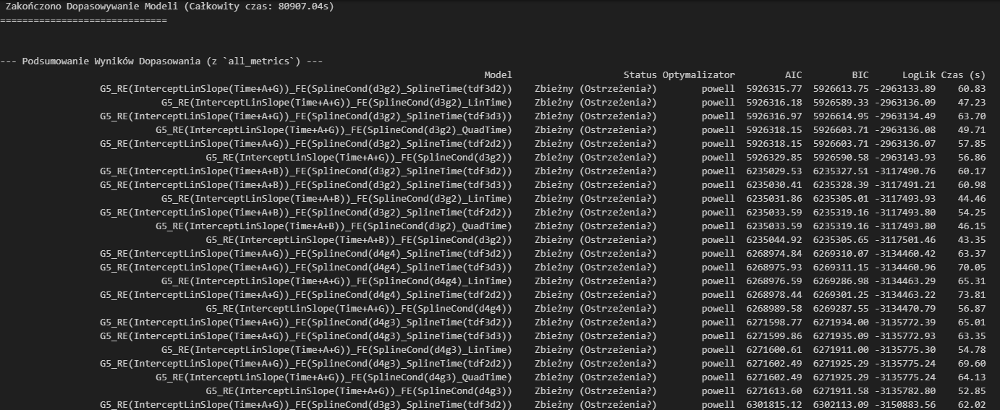
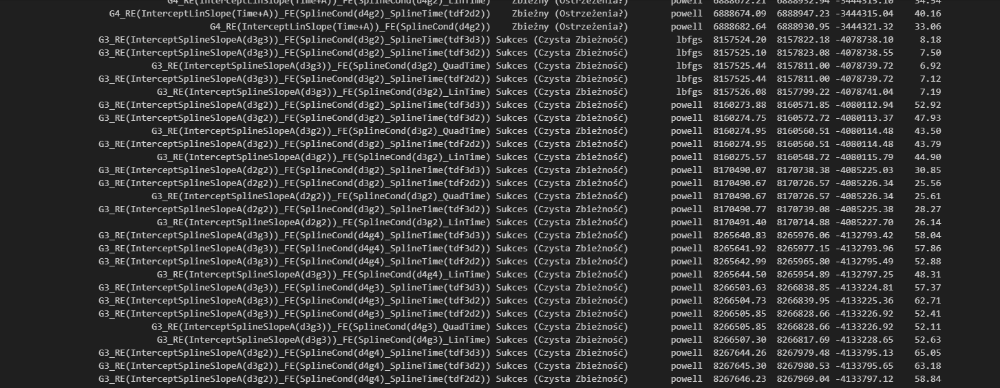

### Analiza Wyników

Ten fragment kodu odpowiada za proces **dopasowywania Liniowych Modeli Mieszanych (LMM)**, których specyfikacje (formuły) zostały wygenerowane we wcześniejszym etapie (`generated_models`). Skrypt iteruje przez listę definicji modeli, próbując dopasować każdy z nich do danych treningowych (`main_data_nested`) za pomocą funkcji `fit_lmm_safely`. Funkcja ta zapewnia robustność procesu poprzez testowanie wielu optymalizatorów (np. `powell`, `lbfgs`) i obsługę potencjalnych błędów czy problemów ze zbieżnością.

Podczas pętli iteracyjnej, kod starannie **zarządza pamięcią RAM**, usuwając duże obiekty wynikowe (`MixedLMResults`) po ekstrakcji kluczowych metryk (status zbieżności, AIC, BIC, LogLik, czas dopasowania). Jest to istotne przy testowaniu wielu potencjalnie złożonych modeli na dużym zbiorze danych.

### Podsumowanie Wyników Dopasowania

Po przetestowaniu wszystkich modeli, skrypt generuje **tabelaryczne podsumowanie** (`summary_df`) zawierające kluczowe metryki dla każdego z nich:
* **Model:** Nazwa wygenerowanej specyfikacji modelu, kodująca użytą grupę, strukturę RE i FE.
* **Status:** Informacja o wyniku dopasowania (np. "Sukces (Czysta Zbieżność)", "Zbieżny (Ostrzeżenia?)", "BŁĄD").
* **Optymalizator:** Nazwa algorytmu, który finalnie dopasował dany model.
* **AIC, BIC, LogLik:** Kryteria informacyjne i log-wiarygodność (niższe AIC/BIC generalnie wskazują na lepsze dopasowanie modelu przy danej złożoności, jeśli porównujemy modele estymowane tą samą metodą - tutaj ML).
* **Czas (s):** Czas potrzebny na dopasowanie danego modelu.

Przedstawiona tabela jest sortowana rosnąco według **AIC**, co ułatwia identyfikację modeli lepiej dopasowanych do danych. Widzimy, że wiele modeli uzyskało status "Zbieżny (Ostrzeżenia?)", co oznacza, że optymalizator znalazł rozwiązanie, ale mogły wystąpić problemy numeryczne lub ostrzeżenia systemowe (co wymagałoby dalszej inspekcji). Pewna liczba modeli na końcu tabeli (z niższym AIC) osiągnęła **"Sukces (Czysta Zbieżność)"**. Całkowity czas dopasowania wszystkich modeli był znaczny (ponad 22 godziny).

### Analiza Najlepszego Modelu

Następnie kod **identyfikuje najlepszy model**, który osiągnął **czystą zbieżność** i ma **najniższą wartość AIC**. Zgodnie z przedstawionym wynikiem, najlepszym modelem okazał się:

**`G3_RE(InterceptSplineSlopeA(d3g3))_FE(SplineCond(d3g2)_SplineTime(tdf3d3))`**

* **AIC:** ~8157524.20
* **Optymalizator:** `lbfgs`
* **Formuła FE (efekty stałe):** `Reaction ~ bs(Alpha_Condition, df=3, degree=2) + bs(Beta_Condition, df=3, degree=2) + bs(Gamma_Condition, df=3, degree=2) + bs(SampleNumber, df=3, degree=3)`
    * *Interpretacja FE:* Modeluje średnią `Reaction` używając splajnów kwadratowych (degree=2) z 3 stopniami swobody (df=3) dla każdego warunku (Alpha, Beta, Gamma) oraz splajnu kubicznego (degree=3) z 3 stopniami swobody dla czasu (`SampleNumber`).
* **Formuła RE (efekty losowe):** `~ 1 + bs(Alpha_Condition, df=3, degree=3)`
    * *Interpretacja RE:* Modeluje zmienność między podmiotami (`Subject`) poprzez losowy intercept (`~ 1`) oraz losowe nachylenia dla **splajnu kubicznego** (degree=3) z 3 stopniami swobody dla warunku `Alpha_Condition`. Oznacza to, że model ten pozwala, aby nie tylko bazowy poziom `Reaction`, ale także **kształt nieliniowej zależności `Reaction` od `Alpha_Condition`** różnił się między podmiotami.

Ten wybrany model jest **ponownie dopasowywany** (używając preferowanego optymalizatora `lbfgs`), tym razem w celu uzyskania **pełnego obiektu wynikowego** (`MixedLMResults`) i możliwości dalszej analizy. Drukowane jest jego szczegółowe podsumowanie (`.summary()`), które zawiera:
* Oszacowania **współczynników efektów stałych** (dla wyrazu wolnego oraz poszczególnych baz splajnów dla warunków i czasu).
* Oszacowania **komponentów wariancji i kowariancji dla efektów losowych** (tutaj: wariancja dla losowego interceptu (`Group Var`), wariancje dla 3 baz losowego splajnu `bs(Alpha_Condition, df=3, degree=3)` oraz ich kowariancje).
* Standardowe błędy, statystyki z i p-wartości dla efektów stałych.
* Ogólne statystyki dopasowania modelu (Log-Likelihood, AIC, BIC).

Na samym końcu, kod generuje **wykres diagnostyczny reszt vs wartości dopasowane** dla tego najlepszego modelu, co pomaga ocenić, czy założenia modelu (np. jednorodność wariancji reszt, brak wzorców) są spełnione.

#### Sprawdzenie dla najlepszego modelu

### Walidacja LLM

W celu kompleksowej oceny modelu liniowego mieszanego (LMM), wykraczającej poza standardowe kryteria dopasowania, takie jak AIC czy BIC, przeprowadzono dedykowaną procedurę walidacji predykcyjnej. Wykorzystano do tego celu dane wygenerowane zgodnie z mechanizmem symulacyjnym, co pozwoliło na porównanie predykcji modelu z rzeczywistymi, znanymi wartościami zmiennej odpowiedzi Reaction. Walidację przeprowadzono w dwóch komplementarnych scenariuszach, mających na celu ocenę różnych aspektów zdolności prognostycznej modelu.

Pierwszy scenariusz koncentrował się na walidacji wewnątrzobiektowej. Oceniano w nim zdolność modelu, wytrenowanego na początkowym zbiorze danych (obejmującym podmioty 1-9), do poprawnego przewidywania wartości Reaction dla tych samych podmiotów, ale w warunkach nowych kombinacji predyktorów (Alpha_Condition, Beta_Condition, Gamma_Condition, SampleNumber), które nie były obecne w oryginalnym zbiorze treningowym.
Ten test weryfikował przede wszystkim trafność zamodelowania średnich zależności (efektów stałych, w tym krzywych splajnowych) oraz zdolność do ekstrapolacji/interpolacji przy uwzględnieniu specyficznych dla podmiotu, oszacowanych efektów losowych.

Drugi scenariusz dotyczył walidacji międzyobiektowej, oceny zdolności modelu do generalizacji na nowe, nieobserwowane wcześniej podmioty. W tym celu wygenerowano dane dla grupy całkowicie nowych podmiotów, niebiorących udziału w procesie estymacji parametrów modelu. Następnie dokonano predykcji dla tych podmiotów, opierając się głównie na oszacowanych efektach stałych modelu (reprezentujących średnią populacyjną).
Porównanie tych predykcji z wartościami symulowanymi pozwoliło ocenić, jak dobrze model opisuje ogólne trendy w populacji i czy oszacowana struktura efektów losowych jest reprezentatywna.

2025-04-24 00:28:01,036 - INFO - --- Rozpoczęcie skryptu analizy LMM ---
2025-04-24 00:28:01,036 - INFO - Ładowanie definicji modeli...
2025-04-24 00:28:01,052 - INFO - Uzyskano 1706 definicji.
2025-04-24 00:28:01,053 - INFO - Wyszukiwanie modelu: G3_RE(InterceptSplineSlopeA(d3g3))_FE(SplineCond(d3g2)_SplineTime(tdf3d3))
2025-04-24 00:28:01,053 - INFO - Znaleziono definicję.
2025-04-24 00:28:01,054 - INFO - Formuła FE: Reaction ~ bs(Alpha_Condition, df=3, degree=2) + bs(Beta_Condition, df=3, degree=2) + bs(Gamma_Condition, df=3, degree=2) + bs(SampleNumber, df=3, degree=3)
2025-04-24 00:28:01,054 - INFO - Formuła RE (dla statsmodels): 1 + bs(Alpha_Condition, df=3, degree=3)
2025-04-24 00:28:01,055 - INFO - Kolumna grupująca: Subject
2025-04-24 00:28:01,055 - INFO - Przygotowywanie danych treningowych...
2025-04-24 00:28:01,080 - INFO - Dane treningowe gotowe (Rozmiar: (1822500, 12))
2025-04-24 00:28:01,081 - INFO - --- Trenowanie Modelu: G3_RE(InterceptSplineSlopeA(d3g3))_FE(SplineCond


--- Generowanie Struktur FE ---
 Poziom 1: Generowanie bazowych splajnów warunków...
   ... Liczba struktur FE po Poziomie 1: 6
 Poziom 1.5: Dodawanie splajnów czasu...
   ... Liczba struktur FE po Poziomie 1.5: 24
 Poziom 2: Dodawanie liniowego efektu czasu do baz...
   ... Liczba struktur FE po Poziomie 2: 30
 Poziom 3: Dodawanie kwadratowego efektu czasu do wybranych baz...
   ... Liczba struktur FE po Poziomie 3: 33
 Poziom 4: Dodawanie interakcji liniowych do baz: ['SplineCond(d3g3)_LinTime', 'SplineCond(d2g2)_LinTime']...
    Generowanie interakcji liniowych dla bazy: SplineCond(d3g3)_LinTime
    Generowanie interakcji liniowych dla bazy: SplineCond(d2g2)_LinTime
   ... Liczba struktur FE po Poziomie 4: 57
 Poziom 5: Dodawanie interakcji splajnów (d3g3) do bazy 'SplineCond(d3g3)_LinTime'...
   ... Liczba struktur FE po Poziomie 5: 62
 Poziom 6: Dodawanie interakcji splajn (d3g3) : czas do bazy 'SplineCond(d3g3)_LinTime'...
   ... Liczba struktur FE po Poziomie 6: 65

Zakończono 

2025-04-24 00:28:47,665 - INFO - --- Zakończono Trenowanie (Czas: 46.58s) ---
2025-04-24 00:28:47,665 - INFO - Status dopasowania: Success (Clean Convergence)
2025-04-24 00:28:47,666 - INFO - Typ obiektu wyniku: <class 'statsmodels.regression.mixed_linear_model.MixedLMResultsWrapper'>
2025-04-24 00:28:47,666 - INFO - Czy model ma re_names: False
2025-04-24 00:28:47,666 - WARNING - Atrybut 'model.re_names' NIE istnieje!
2025-04-24 00:28:47,667 - INFO - Nazwy predyktorów FE (model.exog_names): ['Intercept', 'bs(Alpha_Condition, df=3, degree=2)[0]', 'bs(Alpha_Condition, df=3, degree=2)[1]', 'bs(Alpha_Condition, df=3, degree=2)[2]', 'bs(Beta_Condition, df=3, degree=2)[0]', 'bs(Beta_Condition, df=3, degree=2)[1]', 'bs(Beta_Condition, df=3, degree=2)[2]', 'bs(Gamma_Condition, df=3, degree=2)[0]', 'bs(Gamma_Condition, df=3, degree=2)[1]', 'bs(Gamma_Condition, df=3, degree=2)[2]', 'bs(SampleNumber, df=3, degree=3)[0]', 'bs(SampleNumber, df=3, degree=3)[1]', 'bs(SampleNumber, df=3, degree=3)[2]

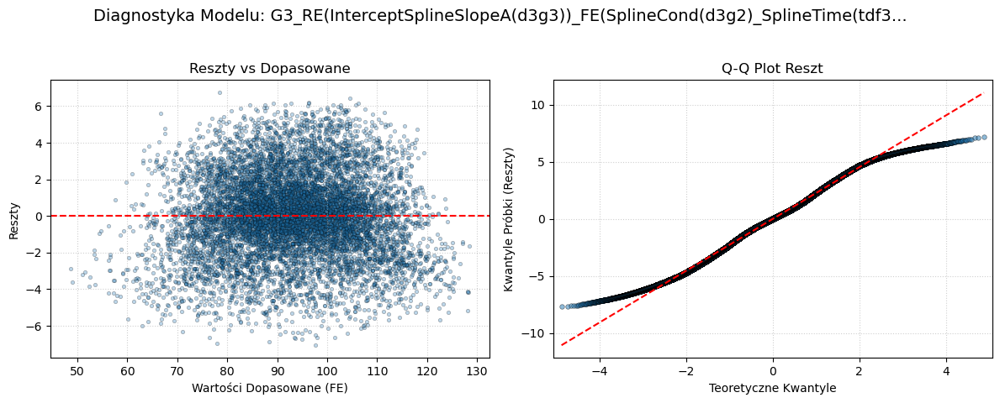

2025-04-24 00:28:49,913 - INFO - --- Wizualizacja Krzywych Indywidualnych ---
2025-04-24 00:28:50,056 - INFO - Znaleziono 9 podmiotów do wizualizacji.
2025-04-24 00:28:50,076 - WARNING - Brak 'model.re_names'.


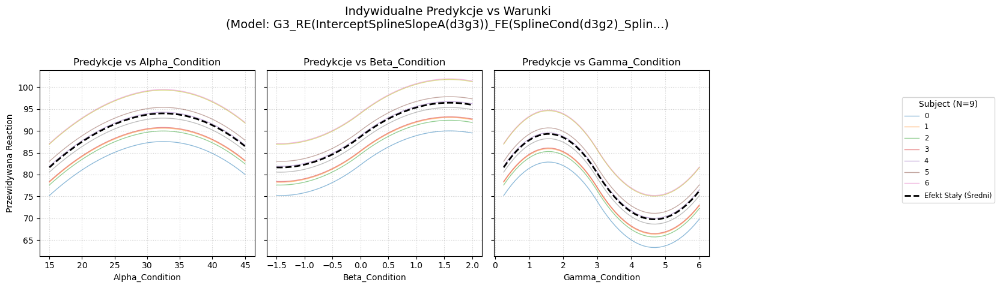

2025-04-24 00:28:50,624 - INFO - 
 Walidacja Predykcyjna 
2025-04-24 00:28:50,625 - INFO - --- Przygotowanie Danych Walidacyjnych (Transformacja Patsy) ---
2025-04-24 00:28:50,625 - INFO - Używana połączona formuła RHS dla Patsy dmatrix: ~ bs(Alpha_Condition, df=3, degree=2) + bs(Beta_Condition, df=3, degree=2) + bs(Gamma_Condition, df=3, degree=2) + bs(SampleNumber, df=3, degree=3) + bs(Alpha_Condition, df=3, degree=3)
2025-04-24 00:28:50,625 - INFO - Model oczekuje kolumn FE: {'Intercept', 'bs(Alpha_Condition, df=3, degree=2)[2]', 'bs(Beta_Condition, df=3, degree=2)[0]', 'bs(Beta_Condition, df=3, degree=2)[2]', 'bs(Gamma_Condition, df=3, degree=2)[2]', 'bs(Gamma_Condition, df=3, degree=2)[1]', 'bs(Alpha_Condition, df=3, degree=2)[1]', 'bs(Beta_Condition, df=3, degree=2)[1]', 'bs(SampleNumber, df=3, degree=3)[0]', 'bs(Alpha_Condition, df=3, degree=2)[0]', 'bs(SampleNumber, df=3, degree=3)[1]', 'bs(Gamma_Condition, df=3, degree=2)[0]', 'bs(SampleNumber, df=3, degree=3)[2]'}
2025-04-24 

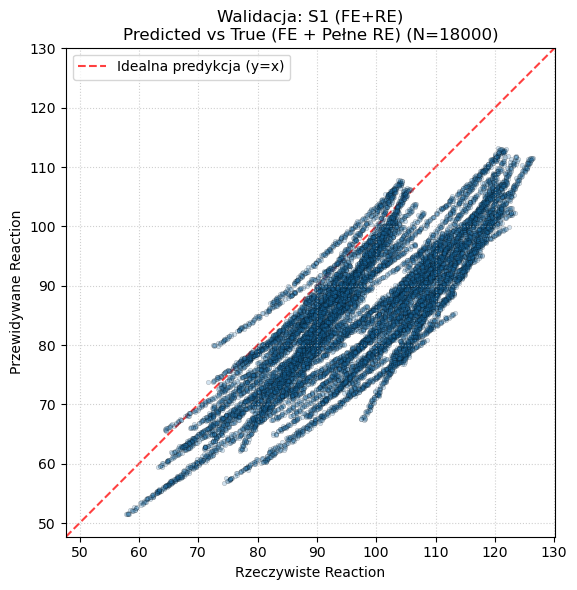

2025-04-24 00:28:51,615 - INFO - --- Zakończono walidację: S1 (FE+RE) (Czas: 0.16s) ---
2025-04-24 00:28:51,813 - INFO - --- Walidacja: Scenariusz 2 (Między, Tylko FE) ---
2025-04-24 00:28:51,814 - INFO - --- Rozpoczęcie walidacji: S2 (Tylko FE) ---
2025-04-24 00:28:51,862 - INFO - [S2 (Tylko FE)] Liczba obserwacji po predykcji FE i dopasowaniu indeksów: 607500 (z 607500 na wejściu)
2025-04-24 00:28:51,885 - INFO - [S2 (Tylko FE)] Pomijanie dodawania RE (use_random_effects=False).
2025-04-24 00:28:51,885 - INFO - [S2 (Tylko FE)] Obliczanie metryk...
2025-04-24 00:28:51,955 - INFO - Wyniki (S2 (Tylko FE)): RMSE=4.1532, MAE=3.5939, R²=0.8846 (N_obs=607500, N_subj=3)
2025-04-24 00:28:51,956 - INFO - [S2 (Tylko FE)] Generowanie wykresu Predicted vs True...


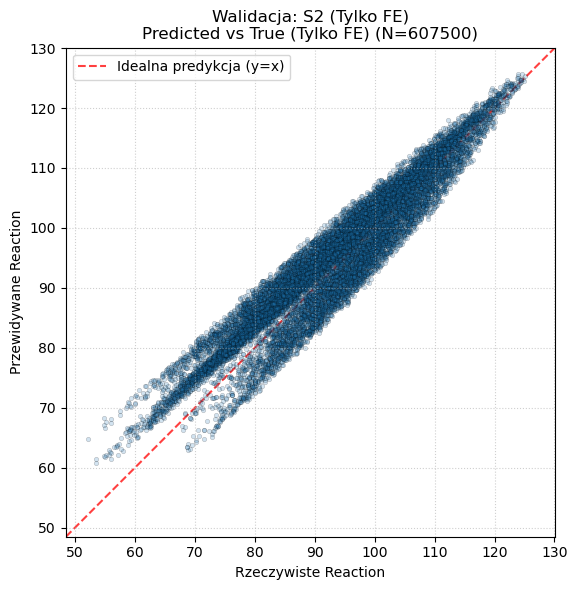

2025-04-24 00:28:52,116 - INFO - --- Zakończono walidację: S2 (Tylko FE) (Czas: 0.30s) ---
2025-04-24 00:28:52,312 - INFO - 
--- Podsumowanie metryk walidacji ---
2025-04-24 00:28:52,312 - INFO - S1 (FE+RE): {'RMSE': np.float64(14.013386650566488), 'MAE': 12.04711173270846, 'R2': -0.1732049762160175, 'N_obs': 18000, 'N_subj': 9}
2025-04-24 00:28:52,312 - INFO - S2 (FE):      {'RMSE': np.float64(4.153198867835048), 'MAE': 3.5938678276092495, 'R2': 0.884593789608991, 'N_obs': 607500, 'N_subj': 3}
2025-04-24 00:28:52,313 - INFO - --- Sprzątanie pamięci na koniec skryptu ---
2025-04-24 00:28:52,546 - INFO - Garbage collector zebrał 0 obiektów.
2025-04-24 00:28:52,546 - INFO - 
--- Zakończono skrypt analizy (Całkowity czas: 51.51s) ---


In [ ]:
# --- Konfiguracja Logging ---
logging.basicConfig(level=logging.INFO, format='%(asctime)s - %(levelname)s - %(message)s')

# --- Stałe Konfiguracyjne ---
MODEL_NAME_TO_ANALYZE = "G3_RE(InterceptSplineSlopeA(d3g3))_FE(SplineCond(d3g2)_SplineTime(tdf3d3))" 
GROUP_COL = "Subject"      
REACTION_VAR = "Reaction"
TIME_VAR = "SampleNumber" 
CONDITION_COLS: List[str] = ["Alpha_Condition", "Beta_Condition", "Gamma_Condition"] 

VALIDATION_DATA_S1_VARNAME = "validation_data_s1"
VALIDATION_DATA_S2_VARNAME = "validation_data_s2"

RUN_SUMMARY = True
RUN_DIAGNOSTICS = True
RUN_INDIVIDUAL_CURVES = True
RUN_VALIDATION = True
PLOT_VALIDATION_RESULTS = True

FIT_OPTIMIZERS = ['powell', 'lbfgs', 'bfgs']
FIT_PREFERRED_OPTIMIZER = 'powell'
FIT_USE_ML = True  
FIT_MAXITER = 10000
FIT_VERBOSE = True 

DIAGNOSTIC_PLOT_SAMPLE_SIZE: int = 10000
VALIDATION_PLOT_SAMPLE_SIZE = 20000
INDIVIDUAL_CURVES_PRED_POINTS: int = 50
LEGEND_SUBJ_LIMIT_FULL: int = 7
LEGEND_SUBJ_LIMIT_SIMPLIFIED: int = 15


def get_random_intercept(subj_re: Any, re_names: Optional[List[str]] = None) -> Optional[float]:
    """
    Wyodrębnia wartość losowego interceptu (skalar) z efektów losowych podmiotu.
    Stara się być odporna na różne formaty wejściowe.
    """
    subj_offset = None
    # Preferowane nazwy w kolejności sprawdzania w Series.index lub re_names
    intercept_keys_priority = ['Intercept', 'Group']
    try:
        # 1. Przypadek Skalarny: Wejście jest już liczbą
        if isinstance(subj_re, (int, float)):
            return float(subj_re)
        # 2. Przypadek pd.Series lub np.ndarray
        if isinstance(subj_re, (pd.Series, np.ndarray)):
            # --- Logika Wyszukiwania ---
            found_by_key = False
            # Priorytet 1: Sprawdź klucze w indeksie (tylko dla Series)
            if isinstance(subj_re, pd.Series) and subj_re.index is not None:
                for key in intercept_keys_priority:
                    if key in subj_re.index:
                        subj_offset = subj_re[key]
                        found_by_key = True
                        logging.debug(f"Znaleziono intercept przez klucz: '{key}'")
                        break
            # Priorytet 2: Sprawdź `re_names` (jeśli nie znaleziono po kluczu)
            if not found_by_key and re_names:
                idx_to_use = -1
                for key in intercept_keys_priority: # Sprawdź preferowane nazwy
                    try:
                        idx = re_names.index(key)
                        # Sprawdź czy indeks jest prawidłowy dla danych subj_re
                        if 0 <= idx < len(subj_re):
                            idx_to_use = idx
                            logging.debug(f"Znaleziono intercept przez re_names: '{key}' na pozycji {idx}")
                            break # Użyj pierwszej pasującej nazwy z listy priorytetowej
                    except ValueError:
                        continue # Nazwa nie występuje w re_names
                # Jeśli znaleziono poprawny indeks
                if idx_to_use != -1:
                    if isinstance(subj_re, pd.Series):
                        subj_offset = subj_re.iloc[idx_to_use]
                    else: # np.ndarray
                        subj_offset = subj_re[idx_to_use]
            # Priorytet 3: Heurystyka długości 1 (jeśli nic innego nie zadziałało)
            if subj_offset is None and len(subj_re) == 1:
                logging.debug("Nie znaleziono interceptu po nazwie/kluczu, używam jedynego elementu RE.")
                if isinstance(subj_re, pd.Series):
                     subj_offset = subj_re.iloc[0]
                else: # np.ndarray
                     subj_offset = subj_re[0]
        # 3. Zwróć wynik lub None
        if subj_offset is not None:
            # Upewnij się, że zwracana wartość jest typu float
            try:
                 return float(subj_offset)
            except (ValueError, TypeError):
                 logging.warning(f"Nie można przekonwertować znalezionego offsetu '{subj_offset}' na float. Zwracam None.")
                 return None
        else:
            # Nie udało się zidentyfikować interceptu żadną metodą
            logging.debug(f"Nie można zidentyfikować interceptu dla RE: {subj_re}. Zwracam None.")
            return None
    except Exception as e:
        # Złap wszystkie inne nieoczekiwane błędy
        logging.error(f"Nieoczekiwany błąd podczas ekstrakcji interceptu dla {subj_re}: {e}", exc_info=True)
        return None


def plot_lmm_diagnostics(result_object: Optional[MixedLMResults], model_name: str):
    """
    Generuje podstawowe wykresy diagnostyczne LMM: Reszty vs Dopasowane i Q-Q Plot.
    """
    logging.info(f"Generowanie wykresów diagnostycznych dla modelu: {model_name}")

    # --- Sprawdzenia Warunków Wstępnych ---
    if result_object is None:
        logging.warning("Brak obiektu wyniku modelu. Pomijanie diagnostyki.")
        return
    if not hasattr(result_object, 'resid') or not hasattr(result_object, 'fittedvalues'):
        logging.warning("Obiekt wyniku nie ma atrybutów 'resid' lub 'fittedvalues'. Pomijanie diagnostyki.")
        return

    try:
        # --- Pobranie Danych ---
        residuals = result_object.resid
        fitted = result_object.fittedvalues

        if residuals.empty or fitted.empty:
            logging.warning("Brak danych reszt lub wartości dopasowanych (są puste). Pomijanie diagnostyki.")
            return

        # --- Tworzenie Wykresów ---
        fig, axes = plt.subplots(1, 2, figsize=(12, 5))
        safe_model_name = str(model_name)[:70] # Pobierz max 70 znaków
        title_suffix = '...' if len(str(model_name)) > 70 else ''
        title_str = f"Diagnostyka Modelu: {safe_model_name}{title_suffix}"
        fig.suptitle(title_str, fontsize=14)

        # 1. Reszty vs Wartości dopasowane
        ax = axes[0]
        n_obs = len(fitted)
        sample_size = min(DIAGNOSTIC_PLOT_SAMPLE_SIZE, n_obs)
        if n_obs > sample_size:
             indices = np.random.choice(n_obs, sample_size, replace=False)
             fitted_sample = fitted.iloc[indices]
             residuals_sample = residuals.iloc[indices]
        else:
             fitted_sample = fitted
             residuals_sample = residuals

        ax.scatter(fitted_sample, residuals_sample, alpha=0.3, s=10, edgecolors='k', linewidths=0.5, rasterized=True)
        ax.axhline(0, color='red', linestyle='--')
        ax.set_xlabel("Wartości Dopasowane (FE)")
        ax.set_ylabel("Reszty")
        ax.set_title("Reszty vs Dopasowane")
        ax.grid(True, linestyle=':', alpha=0.6)

        # 2. Q-Q plot reszt
        ax = axes[1]
        sm.qqplot(residuals, line='s', ax=ax, alpha=0.5)
        # Stylizacja linii (bezpieczniejsze sprawdzanie)
        lines = ax.get_lines()
        if len(lines) > 1: # Linia referencyjna (druga linia)
             lines[1].set_color('red')
             lines[1].set_linestyle('--')
        if len(lines) > 0: # Punkty (pierwsza linia/element)
             lines[0].set_markerfacecolor('#1f77b4')
             lines[0].set_markeredgecolor('k')
             lines[0].set_markersize(4)
             lines[0].set_markeredgewidth(0.5)
        ax.set_title("Q-Q Plot Reszt")
        ax.grid(True, linestyle=':', alpha=0.6)
        ax.set_xlabel("Teoretyczne Kwantyle")
        ax.set_ylabel("Kwantyle Próbki (Reszty)")

        # Zakończenie i wyświetlenie
        plt.tight_layout(rect=[0, 0.03, 1, 0.95]) # Dostosuj marginesy
        plt.show()

    except Exception as e_plot:
        logging.error(f"BŁĄD podczas generowania wykresów diagnostycznych dla '{model_name}': {e_plot}", exc_info=True)
        # Bezpieczne zamknięcie figury, jeśli została stworzona
        if 'fig' in locals() and plt.fignum_exists(fig.number):
             plt.close(fig)

class IndividualCurvesPlotter:
    """
    Klasa do generowania wykresów krzywych indywidualnych dla modelu LMM.
    """
    def __init__(self, result_object: MixedLMResults, data: pd.DataFrame,
                 group_col: str, condition_vars: List[str], all_pred_vars: List[str],
                 model_name: str, reaction_var: str = "Reaction",
                 time_var: Optional[str] = None, 
                 pred_points: Optional[int] = None, 
                 legend_limit_full: Optional[int] = None, 
                 legend_limit_simplified: Optional[int] = None): 
        """Inicjalizuje plotter."""
        
        self.result_object = result_object
        self.data = data
        self.group_col = group_col
        self.condition_vars = condition_vars
        self.all_pred_vars = all_pred_vars
        self.model_name = model_name
        self.reaction_var = reaction_var

        # Ustaw wartości domyślne, używając stałych BEZ prefiksu DEFAULT_
        global TIME_VAR # Dostęp do globalnej
        self.time_var = time_var if time_var is not None else (TIME_VAR if 'TIME_VAR' in globals() else "SampleNumber") # Fallback
        self.pred_points = pred_points if pred_points is not None else INDIVIDUAL_CURVES_PRED_POINTS
        self.legend_limit_full = legend_limit_full if legend_limit_full is not None else LEGEND_SUBJ_LIMIT_FULL
        self.legend_limit_simplified = legend_limit_simplified if legend_limit_simplified is not None else LEGEND_SUBJ_LIMIT_SIMPLIFIED

        self.prepared_data: Optional[Dict[str, Any]] = None
        self.is_ready: bool = False
        try:
            self._prepare_data()
        except Exception as e:
             logging.critical(f"Krytyczny błąd inicjalizacji IndividualCurvesPlotter: {e}", exc_info=True)
             self.is_ready = False

    def _prepare_data(self):
        """Prywatna metoda przygotowująca dane do rysowania. Ustawia self.is_ready."""
        # (Implementacja _prepare_data bez zmian - jak w poprzedniej odpowiedzi)
        logging.debug("Przygotowywanie danych dla plottera krzywych...")
        self.is_ready = False
        if self.result_object is None or self.data is None or self.data.empty: raise ValueError("Brak obiektu modelu lub danych wejściowych.")
        if self.group_col not in self.data.columns: raise ValueError(f"Brak kolumny grupującej '{self.group_col}'.")
        if not hasattr(self.result_object, 'random_effects') or not hasattr(self.result_object, 'predict'): raise AttributeError("Brak atrybutów 'random_effects' lub 'predict'.")
        random_effects_dict = self.result_object.random_effects
        if not isinstance(random_effects_dict, dict) or not random_effects_dict: logging.info("Brak efektów losowych."); return
        if not self.all_pred_vars: raise ValueError("Lista `all_pred_vars` jest pusta.")
        subjects_in_data_str = sorted(self.data[self.group_col].astype(str).unique())
        subjects_in_model_str = set(map(str, random_effects_dict.keys()))
        subjects_to_plot = sorted([s for s in subjects_in_data_str if s in subjects_in_model_str])
        if not subjects_to_plot: logging.info("Brak wspólnych podmiotów."); return
        n_subj = len(subjects_to_plot); logging.info(f"Znaleziono {n_subj} podmiotów do wizualizacji.")
        palette = sns.color_palette("husl", n_colors=n_subj) if n_subj > 10 else sns.color_palette("tab10", n_colors=max(n_subj, 10))
        subj_color_map = {subj: palette[i % len(palette)] for i, subj in enumerate(subjects_to_plot)}
        valid_condition_vars = [cv for cv in self.condition_vars if cv in self.data.columns and cv in self.all_pred_vars]
        if not valid_condition_vars:
            logging.warning(f"Brak poprawnych condition_vars z {self.condition_vars}.")
            if self.time_var in self.data.columns and self.time_var in self.all_pred_vars:
                logging.info(f"Używam fallback: '{self.time_var}'."); valid_condition_vars = [self.time_var]
            else: raise ValueError(f"Nie można znaleźć zmiennej dla osi X (fallback '{self.time_var}' zawiódł).")
        other_preds_fixed_values = {}
        for pred_var in self.all_pred_vars:
            if pred_var in self.data.columns and pred_var not in valid_condition_vars:
                if self.data[pred_var].notna().any():
                    try: other_preds_fixed_values[pred_var] = self.data[pred_var].median()
                    except (TypeError, ValueError):
                        try: other_preds_fixed_values[pred_var] = self.data[pred_var].mode()[0]; logging.debug(f"Użyto mody dla {pred_var}")
                        except Exception as e_mode: logging.warning(f"Nie można obliczyć mediany/mody dla {pred_var}: {e_mode}.")
        model_re_names = getattr(getattr(self.result_object, 'model', None), 're_names', None)
        if model_re_names is None: logging.warning("Brak 'model.re_names'.")
        self.prepared_data = {
            "subjects_to_plot": subjects_to_plot, "n_subj": n_subj, "subj_color_map": subj_color_map,
            "valid_condition_vars": valid_condition_vars, "other_preds_fixed_values": other_preds_fixed_values,
            "random_effects_dict": random_effects_dict, "model_re_names": model_re_names
        }
        self.is_ready = True; logging.debug("Przygotowanie danych dla plottera krzywych zakończone.")

    def _plot_subplot(self, ax: plt.Axes, condition: str, is_first_subplot: bool) -> bool:
        """Prywatna metoda rysująca jeden subplot."""
        plot_successful = False
        # Pobierz przygotowane dane (bez zmian)
        subjects_to_plot = self.prepared_data["subjects_to_plot"]
        subj_color_map = self.prepared_data["subj_color_map"]
        other_preds_fixed_values = self.prepared_data["other_preds_fixed_values"]
        random_effects_dict = self.prepared_data["random_effects_dict"]
        model_re_names = self.prepared_data["model_re_names"] # Może być None!

        try:
            # --- Tworzenie DataFrame do predykcji ---
            if pd.api.types.is_numeric_dtype(self.data[condition].dtype):
                min_val, max_val = self.data[condition].agg(['min', 'max'])
                pred_vals = np.linspace(min_val, max_val, self.pred_points) if min_val != max_val else np.array([min_val])
            else: # Dla zmiennych kategorycznych
                pred_vals = sorted(self.data[condition].unique())

            # 1. Zacznij od kolumny, która się zmienia
            pred_df_fixed = pd.DataFrame({condition: pred_vals})

            # 2. Dodaj stałe wartości dla INNYCH predyktorów (NIE będących warunkami)
            for col, val in other_preds_fixed_values.items():
                if col != condition and col not in self.condition_vars: # Upewnij się, że nie nadpisujesz warunków
                    pred_df_fixed[col] = val
                    logging.debug(f"Plotter: Ustawiam '{col}' na stałą wartość {val}")

            # 3. Dodaj stałe wartości dla POZOSTAŁYCH warunków (tych, które nie są na osi X)
            for other_cond in self.condition_vars:
                if other_cond != condition:
                    # Użyj wartości modalnej (najczęstszej) z oryginalnych danych jako stałej
                    try:
                        fixed_val = self.data[other_cond].mode()[0]
                        pred_df_fixed[other_cond] = fixed_val
                        logging.debug(f"Plotter: Ustawiam warunek '{other_cond}' na stałą wartość (modę): {fixed_val}")
                    except KeyError:
                        logging.warning(f"Plotter: Nie znaleziono kolumny '{other_cond}' w danych do ustalenia wartości modalnej.")
                    except IndexError:
                        logging.warning(f"Plotter: Nie można znaleźć wartości modalnej dla '{other_cond}'. Pomijam ustawianie stałej wartości.")

            # --- Sprawdzenie kompletności DataFrame PRZED transformacją ---
            if not self.all_pred_vars:
                logging.error("Plotter: Brak listy `all_pred_vars`. Nie można zweryfikować kompletności danych do predykcji.")
            else:
                missing_original_cols = [p for p in self.all_pred_vars
                                        if p not in pred_df_fixed.columns
                                        and p != self.reaction_var # Reakcja nie jest predyktorem
                                        and p != self.group_col] # Grupa zwykle też nie
                if missing_original_cols:
                    logging.error(f"Plotter: Nadal brakuje oryginalnych kolumn w pred_df_fixed: {missing_original_cols}. Predykcja FE może zawieść.")
                    
            # --- Predykcja Efektów Stałych (FE) ---
            logging.debug(f"Plotter: Wywołuję predict dla FE z transform=True na danych: {pred_df_fixed.columns}")
            fixed_predictions = self.result_object.predict(exog=pred_df_fixed, transform=True)

            # Sprawdzenie wyniku predykcji (czy długość pasuje itp.)
            if not isinstance(fixed_predictions, (pd.Series, np.ndarray)) or len(fixed_predictions) != len(pred_vals):
                pred_len = len(fixed_predictions) if hasattr(fixed_predictions, '__len__') else 'N/A'
                raise ValueError(f"Niespójny wynik predykcji FE dla plottera. Oczekiwano {len(pred_vals)}, otrzymano {pred_len}.")
            # Konwertuj na numpy array dla łatwiejszego dodawania offsetu
            if isinstance(fixed_predictions, pd.Series):
                fixed_predictions = fixed_predictions.values

            # --- Pętla po podmiotach i rysowanie ---
            for subj_str in subjects_to_plot:
                subj_re = random_effects_dict.get(next((k for k in random_effects_dict if str(k) == subj_str), None))

                # Użyj get_random_intercept (lub bardziej zaawansowanej logiki jeśli chcesz pełne RE)
                subj_offset = get_random_intercept(subj_re, model_re_names)

                if subj_offset is None:
                    logging.debug(f"Plotter: Pomijam podmiot {subj_str}, brak offsetu RE.")
                    continue # Pomiń podmiot jeśli nie ma offsetu

                # Dodaj offset do predykcji FE
                individual_prediction = fixed_predictions + subj_offset

                label = subj_str if is_first_subplot else ""
                ax.plot(pred_vals, individual_prediction, color=subj_color_map[subj_str], label=label, alpha=0.5, linewidth=1)
                plot_successful = True # Wystarczy jeden sukces

            # --- Rysowanie średniej krzywej FE i finalizacja subplotu ---
            if plot_successful:
                label_avg = 'Efekt Stały (Średni)' if is_first_subplot else ""
                # fixed_predictions jest już ndarray
                ax.plot(pred_vals, fixed_predictions, color='black', linewidth=2, linestyle='--', label=label_avg)
                ax.set_title(f"Predykcje vs {condition}")
            else:
                ax.text(0.5, 0.5, "Brak krzywych\n(brak offsetów RE?)", ha='center', va='center', transform=ax.transAxes)
                ax.set_title(f"Predykcje vs {condition} (Brak danych)")

        except Exception as subplot_e:
            logging.error(f"BŁĄD subplotu dla '{condition}': {subplot_e}", exc_info=True) # Zmieniono na True dla pełnego tracebacku
            ax.set_title(f"Predykcje vs {condition} (BŁĄD)")
            ax.text(0.5, 0.5, "Błąd generowania\nsubplotu", ha='center', va='center', transform=ax.transAxes)
            plot_successful = False # Ustaw na False w razie błędu
        finally:
            # Finalizacja subplotu (bez zmian)
            if is_first_subplot: ax.set_ylabel(f"Przewidywana {self.reaction_var}")
            ax.set_xlabel(condition)
            ax.grid(True, linestyle=':', alpha=0.6)

        return plot_successful

    def _create_legend(self, fig: plt.Figure, ax_for_legend: plt.Axes):
        """Prywatna metoda tworząca legendę."""
        # (Implementacja _create_legend bez zmian - jak w poprzedniej odpowiedzi)
        n_subj = self.prepared_data["n_subj"]
        try:
            handles, labels = ax_for_legend.get_legend_handles_labels()
            if not labels: logging.warning("Brak etykiet do legendy."); fig.subplots_adjust(right=0.95); return
            legend_title = f"{self.group_col} (N={n_subj})"; bbox_anchor = (1.0, 0.5)
            right_adjust = 0.80 if n_subj <= self.legend_limit_simplified else 0.85
            unique_labels = {l: h for h, l in zip(handles, labels)}; handles = list(unique_labels.values()); labels = list(unique_labels.keys())
            avg_handle_label = 'Efekt Stały (Średni)'; avg_handle = unique_labels.get(avg_handle_label)
            if n_subj <= self.legend_limit_simplified:
                handles_to_show = handles[:min(n_subj, self.legend_limit_full)]; labels_to_show = labels[:min(n_subj, self.legend_limit_full)]
                if avg_handle and avg_handle_label not in labels_to_show: handles_to_show.append(avg_handle); labels_to_show.append(avg_handle_label)
                fig.legend(handles_to_show, labels_to_show, title=legend_title, loc='center left', bbox_to_anchor=bbox_anchor, fontsize='small')
            else:
                if avg_handle: fig.legend([avg_handle], [avg_handle_label], title=legend_title, loc='center left', bbox_to_anchor=bbox_anchor, fontsize='small')
                else: right_adjust = 0.95
            fig.subplots_adjust(right=right_adjust)
        except Exception as legend_e: logging.error(f"Błąd legendy: {legend_e}"); fig.subplots_adjust(right=0.95)


    def plot(self):
        """Generuje i wyświetla wykres krzywych indywidualnych."""
        # (Implementacja plot bez zmian - jak w poprzedniej odpowiedzi)
        if not self.is_ready or self.prepared_data is None:
            logging.error("Plotter nie jest gotowy. Nie można wygenerować wykresu.")
            return
        valid_condition_vars = self.prepared_data["valid_condition_vars"]
        n_conditions = len(valid_condition_vars)
        fig = None
        try:
            fig_width = max(5 * n_conditions, 7); fig_height = 5
            fig, axes = plt.subplots(1, n_conditions, figsize=(fig_width, fig_height), squeeze=False, sharex=False, sharey=True)
            title_str = f"Indywidualne Predykcje vs Warunki\n(Model: {self.model_name[:60]}{'...' if len(self.model_name)>60 else ''})"
            fig.suptitle(title_str, fontsize=14)
            any_plot_successful = False
            first_ax_with_data = None
            for i, condition in enumerate(valid_condition_vars):
                ax = axes[0, i]
                plot_successful = self._plot_subplot(ax, condition, is_first_subplot=(i == 0))
                if plot_successful: any_plot_successful = True; first_ax_with_data = ax if first_ax_with_data is None else first_ax_with_data
            if any_plot_successful and first_ax_with_data is not None:
                self._create_legend(fig, first_ax_with_data)
                try:
                    right_margin = fig.subplotpars.right if hasattr(fig, 'subplotpars') else 0.95
                    plt.tight_layout(rect=[0, 0.03, right_margin, 0.95]); plt.show()
                except Exception as e: logging.error(f"Błąd finalizacji/wyświetlania: {e}"); plt.close(fig)
            elif fig is not None: logging.warning("Nie udało się narysować subplotu z danymi."); plt.close(fig)
        except Exception as fig_e: logging.error(f"BŁĄD tworzenia figury/pętli subplotów: {fig_e}", exc_info=True); plt.close(fig) if fig is not None and plt.fignum_exists(fig.number) else None

class LMMValidator:
    """
    Klasa do przeprowadzania walidacji predykcyjnej modelu LMM.

    Hermetyzuje logikę predykcji, obliczania metryk i rysowania.
    """

    def __init__(self, result_object: 'MixedLMResults', validation_data: pd.DataFrame,
                 scenario_name: str, reaction_col: str, group_col: str,
                 plot: bool = True, use_random_effects: bool = False,
                 plot_sample_size: Optional[int] = None):
        """
        Inicjalizuje walidator LMM.

        Args:
            result_object: Obiekt wyniku dopasowanego modelu LMM (z statsmodels).
            validation_data: DataFrame z danymi do walidacji.
            scenario_name: Nazwa scenariusza walidacji (np. "S1 (FE+RE)").
            reaction_col: Nazwa kolumny ze zmienną zależną (obserwowaną).
            group_col: Nazwa kolumny grupującej (np. podmioty).
            plot: Czy generować wykres Predicted vs True?
            use_random_effects: Czy dodać efekty losowe do predykcji?
                                 Jeśli True, próbuje dodać PEŁNĄ strukturę RE
                                 (intercept + nachylenia).
            plot_sample_size: Maksymalna liczba punktów na wykresie walidacyjnym.
                              Używa stałej VALIDATION_PLOT_SAMPLE_SIZE jeśli None.
        """
        self.result_object = result_object
        self.validation_data = validation_data
        self.scenario_name = scenario_name
        self.reaction_col = reaction_col
        self.group_col = group_col
        self.plot = plot
        self.use_random_effects = use_random_effects
        # Użyj stałej globalnej, jeśli jest dostępna, inaczej fallback
        default_plot_size = 20000
        try:
            # Sprawdź czy stała istnieje globalnie
            global VALIDATION_PLOT_SAMPLE_SIZE
            if isinstance(VALIDATION_PLOT_SAMPLE_SIZE, int):
                 default_plot_size = VALIDATION_PLOT_SAMPLE_SIZE
        except NameError:
            logging.debug("Globalna stała VALIDATION_PLOT_SAMPLE_SIZE nie znaleziona, używam domyślnej = 20000.")
            pass # Użyj domyślnej zdefiniowanej wyżej
        self.plot_sample_size = plot_sample_size if plot_sample_size is not None else default_plot_size

        self.metrics: Optional[Dict[str, Any]] = None
        self.y_true_final: Optional[pd.Series] = None
        self.y_pred_final: Optional[pd.Series] = None
        self.model_predictors: List[str] = []
        self.is_ready = self._initial_checks()

    def _initial_checks(self) -> bool:
        """Sprawdza warunki początkowe."""
        if self.validation_data is None or self.validation_data.empty or self.result_object is None:
            logging.error(f"[{self.scenario_name}] Brak modelu lub danych walidacyjnych.")
            return False
        required_cols = {self.reaction_col, self.group_col}
        missing = required_cols - set(self.validation_data.columns)
        if missing:
            logging.error(f"[{self.scenario_name}] Brak wymaganych kolumn w danych walidacyjnych: {missing}.")
            return False

        # Pobierz nazwy predyktorów FE z modelu
        try:
            self.model_predictors = self.result_object.model.exog_names
            if not self.model_predictors:
                logging.warning(f"[{self.scenario_name}] Nie udało się pobrać `exog_names` z modelu.")
        except AttributeError:
            logging.warning(f"[{self.scenario_name}] Brak atrybutu `model.exog_names` w obiekcie wyniku.")
            # Można spróbować pobrać fe_params.index jako fallback, ale exog_names jest lepsze
            try:
                self.model_predictors = list(self.result_object.fe_params.index)
                logging.debug(f"[{self.scenario_name}] Użyto `fe_params.index` jako `model_predictors`.")
            except AttributeError:
                logging.warning(f"[{self.scenario_name}] Brak również `fe_params.index`. Nie można określić predyktorów FE.")
                # Kontynuuj, ale predykcja może zawieść

        # Sprawdzenie RE (tylko jeśli mają być użyte)
        if self.use_random_effects:
            if not hasattr(self.result_object, 'random_effects') or not self.result_object.random_effects:
                logging.error(f"[{self.scenario_name}] Żądano użycia RE, ale brak atrybutu 'random_effects' lub jest on pusty w modelu.")
                return False
            if not hasattr(self.result_object.model, 're_names') or not self.result_object.model.re_names:
                 logging.warning(f"[{self.scenario_name}] Żądano użycia RE, ale brak `model.re_names`. Dodanie RE może być niemożliwe lub niepoprawne.")
                 # Nie ustawiamy is_ready = False, ale ostrzegamy; _add_random_effects musi to obsłużyć

        logging.debug(f"[{self.scenario_name}] Wstępne sprawdzenia OK. Predyktory FE modelu: {self.model_predictors}")
        return True

    def _predict_fixed_effects(self, data_for_predict: pd.DataFrame) -> Optional[pd.Series]:
        """Wykonuje predykcję FE i zapewnia zwrot pd.Series."""
        logging.debug(f"[{self.scenario_name}] Rozpoczęcie predykcji FE...")
        try:
            # Wybierz tylko kolumny potrzebne modelowi FE, które są w danych walidacyjnych
            cols_for_predict = [col for col in self.model_predictors if col in data_for_predict.columns]
            # Sprawdź, czy brakuje jakichś kolumn oczekiwanych przez model (poza Intercept)
            expected_cols = {p for p in self.model_predictors if p != 'Intercept'}
            missing_fe_cols = expected_cols - set(cols_for_predict)
            if missing_fe_cols:
                 logging.warning(f"[{self.scenario_name}] Brakujące kolumny FE w danych walidacyjnych: {missing_fe_cols}. Predykcja może być niekompletna.")

            # Przygotuj exog dla predict - może być None jeśli model to tylko Intercept
            # lub jeśli żadne z potrzebnych kolumn nie były w danych (cols_for_predict puste)
            exog_for_predict = data_for_predict[cols_for_predict] if cols_for_predict else None

            logging.debug(f"Wywołanie predict(exog=DataFrame shape: {exog_for_predict.shape if exog_for_predict is not None else 'None'})")
            y_pred_raw = self.result_object.predict(exog=exog_for_predict, transform=False)

            # --- Obsługa Wyniku Predict ---
            if isinstance(y_pred_raw, pd.Series):
                logging.debug("Wynik predict: pd.Series.")
                if y_pred_raw.index.equals(data_for_predict.index):
                    return y_pred_raw
                else:
                    logging.warning(f"[{self.scenario_name}] Indeks zwróconej serii predict różni się od indeksu danych wejściowych! Próba reindeksacji.")
                    try:
                        # Reindeksuj używając indeksu oryginalnych danych
                        return y_pred_raw.reindex(data_for_predict.index)
                    except Exception as reindex_e:
                        raise ValueError(f"Nie można dopasować indeksu wyniku predict (Series) do danych wejściowych: {reindex_e}")

            elif isinstance(y_pred_raw, np.ndarray):
                logging.debug("Wynik predict: np.ndarray.")
                len_pred = len(y_pred_raw)
                len_data = len(data_for_predict)
                if len_pred == len_data:
                    logging.debug("Długość ndarray zgadza się z danymi wej., tworzenie pd.Series.")
                    return pd.Series(y_pred_raw, index=data_for_predict.index)
                else:
                    len_train = getattr(self.result_object.model, 'nobs', "nieznana")
                    err_msg = (f"Niespodziewana długość ndarray z predict ({len_pred}), "
                               f"oczekiwano długości danych walidacyjnych ({len_data}). "
                               f"Dł. danych treningowych: {len_train}. "
                               "Prawdopodobnie predict zignorował/źle użył dane `exog`.")
                    raise ValueError(err_msg)
            else:
                raise TypeError(f"Nieoczekiwany typ wyniku predict: {type(y_pred_raw)}")
        except Exception as e:
            logging.error(f"[{self.scenario_name}] Błąd podczas predykcji FE: {e}", exc_info=True)
            return None

    def _add_random_effects(self, y_pred_fixed: pd.Series, data_aligned: pd.DataFrame) -> pd.Series:
        """
        Dodaje efekty losowe (pełna struktura: intercept + nachylenia) do predykcji FE.

        Jeśli brakuje `model.re_names`, próbuje odgadnąć nazwy RE z `result_object.random_effects`.
        Jeśli brakuje wymaganych kolumn predyktorów dla nachyleń w danych walidacyjnych,
        loguje ostrzeżenia i stosuje tylko część efektów.
        """
        y_pred = y_pred_fixed.copy()
        if not self.use_random_effects:
            logging.info(f"[{self.scenario_name}] Pomijanie dodawania RE (use_random_effects=False).")
            return y_pred # Zwróć niezmienione, jeśli nie używamy RE

        logging.info(f"[{self.scenario_name}] Dodawanie PEŁNYCH RE (Intercept + Slopes)...")
        model_re_names: Optional[List[str]] = None
        random_effects_dict: Optional[Dict] = None

        # --- Krok 1: Pobranie nazw RE ---
        try:
            # 1a. Sprawdź, czy random_effects istnieją w ogóle
            random_effects_dict = self.result_object.random_effects
            if not random_effects_dict:
                logging.warning(f"[{self.scenario_name}] Słownik 'random_effects' jest pusty lub nie istnieje. Nie można dodać RE.")
                return y_pred_fixed

            # 1b. Spróbuj pobrać model.re_names (preferowane)
            try:
                model_re_names = self.result_object.model.re_names
                if not model_re_names: # Jeśli jest pusta lista/None
                    logging.warning(f"[{self.scenario_name}] Atrybut `model.re_names` istnieje, ale jest pusty. Próba odgadnięcia nazw RE.")
                    model_re_names = None # Resetuj, aby spróbować odgadnąć
                else:
                     logging.debug(f"[{self.scenario_name}] Użyto nazw RE z `model.re_names`: {model_re_names}")

            except AttributeError:
                logging.warning(f"[{self.scenario_name}] Atrybut `model.re_names` nie istnieje. Próba odgadnięcia nazw RE.")
                model_re_names = None # Spróbuj odgadnąć

            # 1c. Jeśli model.re_names zawiodło, spróbuj odgadnąć z random_effects
            if model_re_names is None:
                 logging.info(f"[{self.scenario_name}] Odgadywanie nazw RE ze struktury `random_effects`...")
                 try:
                     # Weź pierwszy element ze słownika RE (zakładając, że struktura jest spójna)
                     first_subj_re = next(iter(random_effects_dict.values()))
                     if hasattr(first_subj_re, 'index'): # Sprawdź czy to Series/dict z indeksem
                         model_re_names = list(first_subj_re.index)
                         logging.info(f"[{self.scenario_name}] Odgadnięte nazwy RE: {model_re_names}")
                     else:
                         logging.error(f"[{self.scenario_name}] Nie można odgadnąć nazw RE - pierwszy element w `random_effects` nie ma atrybutu 'index'.")
                         # Nie ustawiamy model_re_names, więc poniższy warunek zwróci błąd
                 except StopIteration: # Jeśli random_effects_dict jest pusty (już sprawdzone, ale dla pewności)
                      logging.error(f"[{self.scenario_name}] Słownik `random_effects` okazał się pusty podczas próby odgadywania nazw.")
                 except Exception as e_infer:
                      logging.error(f"[{self.scenario_name}] Nieoczekiwany błąd podczas odgadywania nazw RE: {e_infer}")

        except AttributeError:
             # Ten błąd złapie, jeśli samo self.result_object.random_effects nie istnieje
             logging.error(f"[{self.scenario_name}] Brak atrybutu 'random_effects' w obiekcie wyniku. Nie można dodać RE.")
             return y_pred_fixed
        except Exception as e_outer:
             logging.error(f"[{self.scenario_name}] Nieoczekiwany błąd podczas pobierania danych RE: {e_outer}")
             return y_pred_fixed


        # --- Krok 2: Ostateczne sprawdzenie nazw RE i identyfikacja struktury ---
        if not model_re_names:
             logging.error(f"[{self.scenario_name}] Nie udało się uzyskać nazw RE ani przez `model.re_names` ani przez odgadywanie. Nie można zinterpretować i dodać RE.")
             return y_pred_fixed # Zwróć tylko FE, jeśli nie udało się ustalić nazw

        logging.debug(f"[{self.scenario_name}] Finalnie używane nazwy RE do dalszego przetwarzania: {model_re_names}")

        # Identyfikacja interceptu i nachyleń na podstawie uzyskanych nazw
        intercept_re_name: Optional[str] = None
        slope_re_names_map: Dict[str, str] = {} # Mapowanie: Nazwa RE -> Nazwa kolumny predyktora w data_aligned

        # Wyszukaj intercept (zakładając standardowe nazwy)
        possible_intercept_names = ['Intercept', 'Group']
        intercept_found = False
        for i, name in enumerate(model_re_names):
            if name in possible_intercept_names and not intercept_found:
                 intercept_re_name = name
                 intercept_found = True
                 logging.debug(f"Znaleziono intercept RE: '{intercept_re_name}' na pozycji {i}")
                 break # Znaleziono pierwszy pasujący

        # Jeśli nie znaleziono standardowego, a jest tylko jeden RE, załóż, że to intercept
        if not intercept_found and len(model_re_names) == 1:
             intercept_re_name = model_re_names[0]
             intercept_found = True
             logging.debug(f"Nie znaleziono interceptu RE po nazwie, zakładam, że jedyny RE '{intercept_re_name}' to intercept.")

        # Identyfikuj nachylenia (wszystkie RE, które nie są interceptem)
        for name in model_re_names:
            if name != intercept_re_name: # Jeśli to nie jest zidentyfikowany intercept
                 # Kluczowe: Sprawdź, czy kolumna o TEJ SAMEJ NAZWIE istnieje w danych walidacyjnych
                 # Dane `data_aligned` zawierają kolumny wygenerowane przez Patsy (jak widać w logach FE)
                 if name in data_aligned.columns:
                     slope_re_names_map[name] = name # Mapuj nazwę RE na tę samą nazwę kolumny
                     logging.debug(f"Znaleziono pasujące nachylenie RE i kolumnę w danych walidacyjnych: '{name}'")
                 else:
                     logging.warning(f"[{self.scenario_name}] Brak kolumny '{name}' w danych walidacyjnych (data_aligned), "
                                     f"wymaganej dla losowego nachylenia o tej samej nazwie. Ten efekt nachylenia zostanie pominięty.")

        if not intercept_found:
            logging.warning(f"[{self.scenario_name}] Nie udało się jednoznacznie zidentyfikować interceptu RE w {model_re_names} używając nazw {possible_intercept_names}. Może to prowadzić do błędów w dodawaniu RE, jeśli jest więcej niż jeden efekt losowy.")
            # Można by dodać bardziej agresywny fallback, np. zawsze brać pierwszy element jako intercept, ale to ryzykowne.

        logging.debug(f"Zidentyfikowany intercept RE: {intercept_re_name}")
        logging.debug(f"Mapowanie RE nachyleń na kolumny: {slope_re_names_map}")

        # --- Krok 3: Konwersja kluczy RE na stringi i przygotowanie do pętli ---
        random_effects_dict_str_keys = {str(k): v for k, v in random_effects_dict.items()}
        subjects_in_model_re = set(random_effects_dict_str_keys.keys())
        n_missing_subj = 0
        missing_subj_list = []

        # --- Krok 4: Główna pętla po podmiotach w danych walidacyjnych ---
        val_group_str = data_aligned[self.group_col].astype(str)
        for subj_str, group_indices in data_aligned.groupby(val_group_str).groups.items():
            if subj_str in subjects_in_model_re:
                subj_re_full = random_effects_dict_str_keys[subj_str]

                # Upewnij się, że subj_re_full jest słownikiem lub serią (ma .get lub [])
                if not hasattr(subj_re_full, 'get') and not isinstance(subj_re_full, (pd.Series, np.ndarray)):
                     logging.warning(f"[{self.scenario_name}] Niespodziewany typ efektów losowych dla podmiotu {subj_str}: {type(subj_re_full)}. Pomijam RE.")
                     continue

                # Sprawdź, czy liczba efektów losowych dla podmiotu zgadza się z oczekiwaniami
                # To może być problematyczne, jeśli 'get' nie zadziała dobrze dla ndarray
                try:
                    num_re_subj = len(subj_re_full)
                    if num_re_subj != len(model_re_names):
                         logging.warning(f"[{self.scenario_name}] Niespójna liczba RE dla {subj_str}. "
                                         f"Oczekiwano {len(model_re_names)} ({model_re_names}), "
                                         f"jest {num_re_subj}. Pomijam dodawanie RE dla tego podmiotu.")
                         continue # Przejdź do następnego podmiotu
                except TypeError: # Np. jeśli subj_re_full jest skalarem
                     if len(model_re_names) == 1: # Jeśli oczekiwano tylko jednego RE
                          pass # OK, może być skalar
                     else:
                          logging.warning(f"[{self.scenario_name}] Niespójny typ/liczba RE dla {subj_str} (jest skalar?). Oczekiwano {len(model_re_names)}. Pomijam.")
                          continue


                # Inicjalizuj wkład RE dla tego podmiotu
                subj_data_rows = data_aligned.loc[group_indices]
                subj_re_contribution = pd.Series(0.0, index=group_indices)

                # 4a. Dodaj wkład interceptu
                if intercept_re_name:
                    try:
                        # Użyj .get() dla słowników/serii, lub indeksowania dla ndarray
                        if isinstance(subj_re_full, (dict, pd.Series)):
                             re_intercept_val = float(subj_re_full.get(intercept_re_name, 0.0))
                        elif isinstance(subj_re_full, np.ndarray):
                             # Znajdź indeks interceptu w model_re_names
                             idx = model_re_names.index(intercept_re_name)
                             re_intercept_val = float(subj_re_full[idx])
                        else: # Skalar
                             re_intercept_val = float(subj_re_full)

                        subj_re_contribution += re_intercept_val
                    except (ValueError, TypeError, KeyError, IndexError) as e_int:
                        logging.warning(f"[{self.scenario_name}] Problem z pobraniem lub konwersją interceptu RE "
                                        f"('{intercept_re_name}') dla podmiotu {subj_str}: {e_int}. Intercept pominięty.")

                # 4b. Dodaj wkład nachyleń
                # Sprawdź, czy są jakiekolwiek nachylenia do przetworzenia
                if slope_re_names_map:
                     # Wybierz tylko potrzebne kolumny z danych podmiotu RAZ
                     subj_data_subset = subj_data_rows[list(slope_re_names_map.values())]

                     for re_name, col_name in slope_re_names_map.items():
                         try:
                             # Pobierz wartość nachylenia RE dla podmiotu
                             if isinstance(subj_re_full, (dict, pd.Series)):
                                  re_slope_val = float(subj_re_full.get(re_name, 0.0))
                             elif isinstance(subj_re_full, np.ndarray):
                                  # Znajdź indeks nachylenia w model_re_names
                                  idx = model_re_names.index(re_name)
                                  re_slope_val = float(subj_re_full[idx])
                             else:
                                  re_slope_val = 0.0 # Nie można mieć nachyleń jeśli RE jest skalarem

                             if re_slope_val != 0.0:
                                 # Mnożenie wektorowe: wartość nachylenia * kolumna predyktora
                                 slope_effect = re_slope_val * subj_data_subset[col_name]
                                 subj_re_contribution = subj_re_contribution.add(slope_effect, fill_value=0) # Bezpieczniejsze dodawanie
                         except (ValueError, TypeError, KeyError, IndexError) as e_slope:
                             logging.warning(f"[{self.scenario_name}] Problem z nachyleniem '{re_name}' (kolumna '{col_name}') "
                                             f"dla podmiotu {subj_str}: {e_slope}. Efekt tego nachylenia pominięty.")

                # Dodaj obliczony całkowity wkład RE do predykcji FE dla tego podmiotu
                y_pred.loc[group_indices] = y_pred.loc[group_indices].add(subj_re_contribution, fill_value=0)

            else: # Podmiot z danych walidacyjnych nie ma RE w modelu
                n_missing_subj += 1
                if n_missing_subj <= 10: # Loguj tylko kilka pierwszych
                    missing_subj_list.append(subj_str)
                # Dla tych podmiotów predykcja pozostanie tylko jako FE

        if n_missing_subj > 0:
            logging.warning(f"[{self.scenario_name}] Nie znaleziono RE dla {n_missing_subj} podmiotów z danych walidacyjnych "
                            f"(np. {missing_subj_list}{'...' if n_missing_subj > 10 else ''}). "
                            "Dla nich użyto tylko predykcji FE.")

        logging.info(f"[{self.scenario_name}] Zakończono próbę dodawania RE.")
        return y_pred


    def _calculate_metrics(self, y_true: pd.Series, y_pred: pd.Series, n_subjects: Union[int, str]) -> Optional[Dict[str, Any]]:
        """Oblicza metryki walidacyjne."""
        logging.info(f"[{self.scenario_name}] Obliczanie metryk...")
        # Usuń NaN i dopasuj indeksy raz jeszcze na wszelki wypadek
        valid_idx = y_true.dropna().index.intersection(y_pred.dropna().index)
        if valid_idx.empty:
            logging.error(f"[{self.scenario_name}] Brak wspólnych, nie-NaN obserwacji w y_true i y_pred po dopasowaniu.")
            return None

        self.y_true_final = y_true.loc[valid_idx]
        self.y_pred_final = y_pred.loc[valid_idx]
        n_obs = len(self.y_true_final)

        if n_obs == 0:
            logging.error(f"[{self.scenario_name}] Brak obserwacji (po usunięciu NaN) do obliczenia metryk.")
            return None
        # Dodajmy sprawdzenie, czy nie ma samych NaN w predykcjach, co czasem się zdarza
        if self.y_pred_final.isnull().all():
            logging.error(f"[{self.scenario_name}] Wszystkie wartości predykcji (y_pred_final) są NaN. Nie można obliczyć metryk.")
            return None


        try:
            rmse = np.sqrt(mean_squared_error(self.y_true_final, self.y_pred_final))
            mae = mean_absolute_error(self.y_true_final, self.y_pred_final)
            # R2 score może być < 0 lub NaN, jeśli model jest bardzo zły lub y_true jest stałe
            if self.y_true_final.nunique() > 1:
                 r2 = r2_score(self.y_true_final, self.y_pred_final)
            else:
                 r2 = np.nan # R2 jest niezdefiniowane dla stałej y_true
                 logging.warning(f"[{self.scenario_name}] Wartości y_true są stałe. R² jest niezdefiniowane (ustawiono na NaN).")

            self.metrics = {'RMSE': rmse, 'MAE': mae, 'R2': r2, 'N_obs': n_obs, 'N_subj': n_subjects}
            logging.info(f"Wyniki ({self.scenario_name}): RMSE={rmse:.4f}, MAE={mae:.4f}, R²={r2:.4f} (N_obs={n_obs}, N_subj={n_subjects})")
            return self.metrics
        except Exception as metric_e:
            logging.error(f"[{self.scenario_name}] Błąd podczas obliczania metryk: {metric_e}", exc_info=True)
            self.metrics = None
            self.y_true_final = None
            self.y_pred_final = None
            return None

    def _plot_results(self):
        """Generuje wykres Predicted vs True."""
        if self.y_true_final is None or self.y_pred_final is None:
            logging.warning(f"[{self.scenario_name}] Brak danych (y_true_final/y_pred_final) do wygenerowania wykresu walidacji.")
            return

        logging.info(f"[{self.scenario_name}] Generowanie wykresu Predicted vs True...")
        fig = None # Inicjalizuj fig=None
        try:
            fig = plt.figure(figsize=(7, 6)) # Przypisz tutaj
            n_plot = len(self.y_true_final)
            # Użyj self.plot_sample_size zamiast stałej bezpośrednio
            sample_size = min(self.plot_sample_size, n_plot)

            if n_plot > sample_size:
                indices = np.random.choice(n_plot, sample_size, replace=False)
                y_true_sample = self.y_true_final.iloc[indices]
                y_pred_sample = self.y_pred_final.iloc[indices]
            else:
                indices = np.arange(n_plot) # Nie ma potrzeby losować
                y_true_sample = self.y_true_final
                y_pred_sample = self.y_pred_final


            plt.scatter(y_true_sample, y_pred_sample, alpha=0.2, s=10, edgecolors='k', linewidths=0.5, rasterized=True)

            # Użyj pełnych danych do określenia zakresu osi dla linii y=x
            combined = pd.concat([self.y_true_final, self.y_pred_final]).dropna()
            if not combined.empty:
                lim_min, lim_max = combined.min(), combined.max()
                range_ = lim_max - lim_min
                padding = range_ * 0.05 if range_ > 1e-9 else 0.5 # Dodaj padding
                lims = [lim_min - padding, lim_max + padding]
                plt.plot(lims, lims, 'r--', alpha=0.75, zorder=0, label='Idealna predykcja (y=x)')
                plt.xlim(lims)
                plt.ylim(lims)
            else:
                logging.warning(f"[{self.scenario_name}] Brak danych do określenia zakresu osi wykresu.")


            plt.xlabel(f"Rzeczywiste {self.reaction_col}")
            plt.ylabel(f"Przewidywane {self.reaction_col}")
            title_suffix = "(FE + Pełne RE)" if self.use_random_effects else "(Tylko FE)"
            # Użyj N z metryk, jeśli dostępne, inaczej licz z próbkki
            n_display = self.metrics['N_obs'] if self.metrics else sample_size
            plt.title(f"Walidacja: {self.scenario_name}\nPredicted vs True {title_suffix} (N={n_display})")
            plt.grid(True, linestyle=':', alpha=0.6)
            plt.legend()
            plt.gca().set_aspect('equal', adjustable='box')
            plt.tight_layout()
            plt.show()

        except Exception as plot_e:
            logging.error(f"[{self.scenario_name}] BŁĄD generowania wykresu walidacji: {plot_e}", exc_info=True)
            # Bezpieczne zamknięcie figury, jeśli została stworzona i wystąpił błąd
            if fig is not None and plt.fignum_exists(fig.number):
                 plt.close(fig)


    def validate(self) -> Optional[Dict[str, Any]]:
        """Główna metoda uruchamiająca proces walidacji."""
        if not self.is_ready:
            logging.error(f"[{self.scenario_name}] Walidator nie jest gotowy (błąd inicjalizacji lub brak danych/modelu).")
            return None

        logging.info(f"--- Rozpoczęcie walidacji: {self.scenario_name} ---")
        validation_start_time = time.time() # Zakładając import time

        try:
            # Krok 1: Predykcja FE
            # Pracuj na kopii danych walidacyjnych, aby uniknąć modyfikacji oryginału
            val_data_prepared = self.validation_data.copy()
            y_true_original = val_data_prepared[self.reaction_col]

            y_pred_fixed = self._predict_fixed_effects(val_data_prepared)
            if y_pred_fixed is None:
                logging.error(f"[{self.scenario_name}] Predykcja FE nie powiodła się. Przerywam walidację.")
                return None # Błąd w predykcji FE

            # Krok 2: Dopasowanie Indeksów po predykcji FE
            # Znajdź wspólne indeksy, gdzie zarówno y_true jak i y_pred_fixed mają wartości (nie-NaN domyślnie w intersection)
            common_index = y_true_original.dropna().index.intersection(y_pred_fixed.dropna().index)
            if len(common_index) == 0:
                 logging.error(f"[{self.scenario_name}] Brak wspólnych obserwacji (po predykcji FE i usunięciu NaN) między y_true i y_pred_fixed.")
                 return None # Nie można kontynuować

            logging.info(f"[{self.scenario_name}] Liczba obserwacji po predykcji FE i dopasowaniu indeksów: {len(common_index)} (z {len(y_true_original)} na wejściu)")
            y_true_aligned = y_true_original.loc[common_index]
            y_pred_aligned = y_pred_fixed.loc[common_index]
            # Dopasowane dane (DataFrame) potrzebne do dodania RE (zawierają kolumny predyktorów i grupującą)
            data_aligned = val_data_prepared.loc[common_index]

            # Krok 3: Dodanie RE (jeśli use_random_effects=True)
            # Metoda _add_random_effects zwróci y_pred_aligned jeśli use_random_effects=False
            # lub jeśli wystąpi błąd uniemożliwiający dodanie RE.
            y_pred_final_temp = self._add_random_effects(y_pred_aligned, data_aligned)


            # Krok 4: Obliczenie Metryk
            # Użyj dopasowanych danych (data_aligned) do policzenia liczby unikalnych podmiotów
            n_subjects = data_aligned[self.group_col].nunique() if self.group_col in data_aligned else 'N/A'
            self.metrics = self._calculate_metrics(y_true_aligned, y_pred_final_temp, n_subjects)
            # self.y_true_final i self.y_pred_final są ustawiane wewnątrz _calculate_metrics na podstawie `valid_idx`

            # Krok 5: Rysowanie (jeśli włączone i metryki zostały pomyślnie obliczone)
            if self.plot and self.metrics is not None:
                self._plot_results()

            validation_duration = time.time() - validation_start_time
            logging.info(f"--- Zakończono walidację: {self.scenario_name} (Czas: {validation_duration:.2f}s) ---")

            return self.metrics

        except Exception as e:
            logging.critical(f"[{self.scenario_name}] BŁĄD KRYTYCZNY podczas procesu walidacji: {e}", exc_info=True)
            # Resetuj stan na wypadek, gdyby obiekt był reużywany (chociaż zwykle tworzy się nowy)
            self.metrics = None
            self.y_true_final = None
            self.y_pred_final = None
            return None

if __name__ == "__main__":

    logging.basicConfig(level=logging.INFO, format='%(asctime)s - %(levelname)s - %(message)s')
    logging.info("--- Rozpoczęcie skryptu analizy LMM ---")
    script_start_time = time.time()
    result_object: Optional['MixedLMResults'] = None # Użyj Optional i stringa dla type hint jeśli klasa nie jest jeszcze znana
    train_result_info: Optional[Dict[str, Any]] = None
    plotter: Optional['IndividualCurvesPlotter'] = None
    validator_s1: Optional['LMMValidator'] = None
    validator_s2: Optional['LMMValidator'] = None
    training_data_local: Optional[pd.DataFrame] = None
    target_model_def: Optional[Dict[str, Any]] = None
    generated_models: Optional[List[Dict[str, Any]]] = None


    try:
        # Sprawdzenie wymaganych elementów (bez zmian)
        # UWAGA: Dodano 'patsy' do sprawdzenia, jeśli nie jest importowane globalnie
        required_elements = {'main': callable, 'fit_lmm_safely': callable, 'patsy': lambda x: hasattr(x, 'dmatrix')}
        if RUN_DIAGNOSTICS: required_elements['plot_lmm_diagnostics'] = callable
        if RUN_INDIVIDUAL_CURVES: required_elements['IndividualCurvesPlotter'] = lambda x: isinstance(x, type)
        if RUN_VALIDATION: required_elements['LMMValidator'] = lambda x: isinstance(x, type)
        if RUN_INDIVIDUAL_CURVES or RUN_VALIDATION: required_elements['get_random_intercept'] = callable

        missing = []
        for name, check in required_elements.items():
            if name not in globals() or not check(globals()[name]):
                missing.append(name)
        if missing:
            raise NameError(f"Brak definicji wymaganych funkcji/klas/modułów: {', '.join(missing)}")

        PLOT_LIBS_AVAILABLE = True # Załóżmy, że są dostępne jeśli nie ma NameError
        # Można dodać tu try-import dla matplotlib, seaborn
    except NameError as e:
        logging.critical(f"{e}. Przerywam.", exc_info=True)
        exit(1)
    except ImportError as e:
         logging.critical(f"Brak wymaganej biblioteki: {e}. Przerywam.", exc_info=True)
         exit(1)

    # --- Główny blok operacji ---
    try:
        # --- Krok 1: Definicje Modeli (bez zmian) ---
        logging.info("Ładowanie definicji modeli...")
        generated_models = main() # Wywołaj funkcję main z Twojego generatora
        if not isinstance(generated_models, list) or not generated_models:
            raise RuntimeError("Funkcja main() nie zwróciła poprawnej listy modeli.")
        logging.info(f"Uzyskano {len(generated_models)} definicji.")

        # --- Krok 2: Wybór Modelu (bez zmian) ---
        logging.info(f"Wyszukiwanie modelu: {MODEL_NAME_TO_ANALYZE}")
        target_model_def = next((m for m in generated_models if m.get("name") == MODEL_NAME_TO_ANALYZE), None)
        if target_model_def is None:
            raise ValueError(f"Nie znaleziono definicji dla modelu: {MODEL_NAME_TO_ANALYZE}.")
        logging.info(f"Znaleziono definicję.")

        fixed_formula = target_model_def.get('fixed_formula')
        # Użyj re_formula_statsmodels z generatora, jeśli istnieje, inaczej base
        re_formula_for_fit = target_model_def.get('re_formula_statsmodels', target_model_def.get('re_formula_base'))
        all_model_predictors = target_model_def.get('all_predictors', [])

        if not fixed_formula: raise ValueError("Brak 'fixed_formula' w definicji.")
        if not all_model_predictors and (RUN_INDIVIDUAL_CURVES): # Potrzebne głównie dla Plottera
             logging.warning(f"Klucz 'all_predictors' jest pusty lub go brak w definicji modelu '{MODEL_NAME_TO_ANALYZE}'. "
                             "Wizualizacja krzywych indywidualnych może nie działać poprawnie.")

        logging.info(f"Formuła FE: {fixed_formula}")
        logging.info(f"Formuła RE (dla statsmodels): {re_formula_for_fit if re_formula_for_fit else 'Brak (tylko intercept domyślnie)'}")
        logging.info(f"Kolumna grupująca: {GROUP_COL}")

        # --- Krok 3: Przygotowanie Danych Treningowych (bez zmian) ---
        logging.info("Przygotowywanie danych treningowych...")
        # Zakładamy, że 'training_data' jest dostępne globalnie
        if 'training_data' not in globals() or not isinstance(globals()['training_data'], pd.DataFrame):
             raise ValueError("Brak globalnej zmiennej 'training_data' typu DataFrame.")
        training_data = globals()['training_data']
        if training_data.empty: raise ValueError("'training_data' jest pusta.")

        # Sprawdź wymagane kolumny (REACTION_VAR, GROUP_COL + ew. all_model_predictors)
        required_cols_set = {GROUP_COL, REACTION_VAR}
        if all_model_predictors:
             required_cols_set.update(all_model_predictors) # Sprawdza tylko ORYGINALNE nazwy
        else:
            # Jeśli brak all_predictors, spróbuj zgadnąć z formuł (uproszczone)
            try:
                desc_fe = patsy.ModelDesc.from_formula(fixed_formula)
                desc_re = patsy.ModelDesc.from_formula(re_formula_for_fit if re_formula_for_fit else "~1")
                terms = desc_fe.rhs_termlist + desc_re.rhs_termlist
                factors = set(f.name() for term in terms for f in term.factors if hasattr(f, 'name'))
                required_cols_set.update(factors)
                logging.info(f"Automatycznie wykryte potencjalne predyktory: {factors}")
            except Exception as e_parse:
                logging.warning(f"Nie udało się sparsować formuł w celu sprawdzenia kolumn: {e_parse}")
                # W najgorszym razie sprawdzi tylko GROUP_COL i REACTION_VAR

        missing_cols = {col for col in required_cols_set if col not in training_data.columns} # Sprawdź tylko te, które powinny być kolumnami
        if missing_cols:
            # Sprawdźmy, czy brakujące kolumny to nie są przypadkiem terminy z formuły, a nie nazwy kolumn
            potential_formula_terms = {'Intercept'} # Patsy może generować terminy, które nie są kolumnami
            missing_actual_cols = missing_cols - potential_formula_terms
            if missing_actual_cols:
                 raise ValueError(f"Brakujące kolumny w danych treningowych: {missing_actual_cols}")
            else:
                 logging.info("Wszystkie wymagane kolumny (poza potencjalnymi terminami formuł jak 'Intercept') obecne w danych treningowych.")


        training_data_local = training_data.copy()
        logging.info(f"Dane treningowe gotowe (Rozmiar: {training_data_local.shape})")

        # --- Krok 4: Trenowanie Modelu (bez zmian) ---
        logging.info(f"--- Trenowanie Modelu: {MODEL_NAME_TO_ANALYZE} ---")
        start_time_train = time.time()
        train_result_info = fit_lmm_safely(
             formula=fixed_formula, # Przekaż pełną formułę FE
             re_formula=re_formula_for_fit, # Przekaż formułę RE dla statsmodels
             data=training_data_local,
             group_col=GROUP_COL,
             optimizers=FIT_OPTIMIZERS,
             preferred_optimizer=FIT_PREFERRED_OPTIMIZER,
             use_ml=FIT_USE_ML,
             maxiter=FIT_MAXITER,
             verbose=FIT_VERBOSE
        )
        train_duration = time.time() - start_time_train
        logging.info(f"--- Zakończono Trenowanie (Czas: {train_duration:.2f}s) ---")

        if not train_result_info: raise RuntimeError("fit_lmm_safely nie zwróciła wyników.")
        result_object = train_result_info.get('result')

        # Logowanie statusu dopasowania (bez zmian)
        if result_object and train_result_info.get('converged_cleanly'): logging.info("Status dopasowania: Success (Clean Convergence)")
        elif result_object: logging.info("Status dopasowania: Converged with warnings")
        else: logging.error(f"Status dopasowania: Failed ({train_result_info.get('error_message', 'Unknown error')})")

        # --- DODATKOWE LOGOWANIE (do diagnostyki re_names) ---
        if result_object:
            logging.info(f"Typ obiektu wyniku: {type(result_object)}")
            if hasattr(result_object, 'model'):
                 logging.info(f"Czy model ma re_names: {hasattr(result_object.model, 're_names')}")
                 if hasattr(result_object.model, 're_names'):
                     logging.info(f"Wartość model.re_names: {result_object.model.re_names}")
                 else:
                     logging.warning("Atrybut 'model.re_names' NIE istnieje!")
                 logging.info(f"Nazwy predyktorów FE (model.exog_names): {getattr(result_object.model, 'exog_names', 'Brak exog_names')}")
                 # Sprawdź formułę zapisaną w modelu
                 formula_in_model_fe = getattr(result_object.model, 'formula', None)
                 if formula_in_model_fe:
                      logging.info(f"Formuła FE zapisana w modelu: {formula_in_model_fe}")
                 else:
                      logging.warning("Brak formuły FE zapisanej w modelu.")
            else:
                 logging.warning("Obiekt wyniku nie ma atrybutu 'model'!")
        else:
            logging.error("Obiekt 'result_object' jest None po dopasowaniu!")

        # --- Krok 5: Analiza, Wizualizacja, Walidacja ---
        if result_object:
            logging.info("\n--- Analiza Dopasowanego Modelu ---")

            # Podsumowanie i Diagnostyka (bez zmian)
            if RUN_SUMMARY:
                logging.info("--- Podsumowanie modelu ---")
                try: logging.info("\n" + result_object.summary().as_text())
                except Exception as e: logging.error(f"Błąd generowania podsumowania: {e}")

            if RUN_DIAGNOSTICS and PLOT_LIBS_AVAILABLE:
                logging.info("--- Diagnostyka Modelu ---")
                try: plot_lmm_diagnostics(result_object, MODEL_NAME_TO_ANALYZE)
                except Exception as e: logging.error(f"Błąd plot_lmm_diagnostics: {e}", exc_info=True)

            # Wizualizacja Krzywych Indywidualnych (bez zmian, ale z ostrzeżeniem o all_predictors)
            if RUN_INDIVIDUAL_CURVES and PLOT_LIBS_AVAILABLE:
                if not all_model_predictors:
                     logging.error("Brak listy 'all_predictors' w definicji modelu. Pomijanie wizualizacji krzywych.")
                else:
                     logging.info("--- Wizualizacja Krzywych Indywidualnych ---")
                     try:
                         plotter = IndividualCurvesPlotter(
                             result_object=result_object, data=training_data_local, group_col=GROUP_COL,
                             condition_vars=CONDITION_COLS, all_pred_vars=all_model_predictors,
                             model_name=MODEL_NAME_TO_ANALYZE, reaction_var=REACTION_VAR
                         )
                         if plotter.is_ready: plotter.plot()
                         else: logging.error("Inicjalizacja plottera krzywych indywidualnych nie powiodła się.")
                     except Exception as e: logging.error(f"Błąd IndividualCurvesPlotter: {e}", exc_info=True)
                     finally:
                         if 'plotter' in locals(): del plotter; gc.collect()

            if RUN_VALIDATION and PLOT_LIBS_AVAILABLE:
                logging.info("\n" + "="*50 + "\n Walidacja Predykcyjna \n" + "="*50)
                metrics_s1, metrics_s2 = None, None
                data_s1_raw = globals().get(VALIDATION_DATA_S1_VARNAME) # Dane surowe
                data_s2_raw = globals().get(VALIDATION_DATA_S2_VARNAME) # Dane surowe
                data_s1_transformed = None # Dane po transformacji Patsy
                data_s2_transformed = None # Dane po transformacji Patsy

                # --- Krok 5.1: Transformacja Danych Walidacyjnych za pomocą Patsy ---
                logging.info("--- Przygotowanie Danych Walidacyjnych (Transformacja Patsy) ---")
                if not fixed_formula:
                     logging.error("Brak 'fixed_formula' w definicji modelu. Nie można przetransformować danych walidacyjnych.")
                else:
                     try:
                         # ################################################################
                         # ### POCZĄTEK ZMIAN: Tworzenie połączonej formuły dla Patsy ###
                         # ################################################################

                         # 1. Pobierz prawą stronę (RHS) z formuły FE
                         if '~' in fixed_formula:
                             fe_rhs = fixed_formula.split("~", 1)[1].strip()
                         else:
                             fe_rhs = fixed_formula.strip() # Zakładając, że to tylko RHS

                         # 2. Pobierz prawą stronę (RHS) z formuły RE (dla statsmodels)
                         #    i usuń '1 +', jeśli istnieje, aby dostać tylko terminy nachyleń
                         re_rhs_terms_only = ""
                         if re_formula_for_fit and re_formula_for_fit.strip() != '1':
                              re_rhs_raw = re_formula_for_fit.strip()
                              # Usuń potencjalne '1 +' na początku
                              if re_rhs_raw.startswith('1 +'):
                                   re_rhs_terms_only = re_rhs_raw[len('1 +'):].strip()
                              elif re_rhs_raw == '1': # Jeśli formuła RE to tylko intercept
                                   re_rhs_terms_only = ""
                              else: # Jeśli nie zaczyna się od '1 +' (np. tylko 'x' albo '0 + x')
                                   re_rhs_terms_only = re_rhs_raw

                         # 3. Zbuduj kombinowaną formułę RHS dla Patsy, unikając duplikatów
                         #    Rozbij terminy FE i RE na listy
                         fe_terms_list = [t.strip() for t in fe_rhs.split('+')]
                         re_terms_list = [t.strip() for t in re_rhs_terms_only.split('+')] if re_rhs_terms_only else []

                         # Zbierz wszystkie unikalne terminy
                         all_unique_terms = []
                         seen_terms = set()
                         for term in fe_terms_list + re_terms_list:
                              if term and term not in seen_terms: # Sprawdź czy nie pusty i unikalny
                                   all_unique_terms.append(term)
                                   seen_terms.add(term)

                         # 4. Stwórz finalną formułę RHS dla patsy.dmatrix
                         if all_unique_terms:
                              formula_rhs_combined = "~ " + " + ".join(all_unique_terms)
                         else:
                              formula_rhs_combined = "~ 1" # Fallback na sam intercept, jeśli nic innego nie ma

                         logging.info(f"Używana połączona formuła RHS dla Patsy dmatrix: {formula_rhs_combined}")
                         # Zapisz oryginalną formułę RHS z FE (może się przydać do logowania/debugowania)
                         formula_rhs_fe_only = "~ " + fe_rhs

                         # ##############################################################
                         # ### KONIEC ZMIAN: Tworzenie połączonej formuły dla Patsy ###
                         # ##############################################################

                         try:
                             model_exog_names = set(result_object.model.exog_names)
                             model_expects_intercept = 'Intercept' in model_exog_names
                             logging.info(f"Model oczekuje kolumn FE: {model_exog_names}")
                         except AttributeError:
                             logging.error("Nie można pobrać 'exog_names' z dopasowanego modelu! Przerywam transformację.")
                             raise # Rzuć błąd dalej, aby zatrzymać walidację

                         # --- Transformacja S1 ---
                         if isinstance(data_s1_raw, pd.DataFrame) and not data_s1_raw.empty:
                             # Używamy formula_rhs_combined do generowania macierzy projektowej
                             logging.info(f"Transformowanie danych walidacyjnych S1 (rozmiar wej.: {data_s1_raw.shape}) formułą: {formula_rhs_combined}")
                             try:
                                 # Użyj NA_action='raise', aby wykryć NaN w predyktorach przed transformacją
                                 transformed_exog_s1 = patsy.dmatrix(formula_rhs_combined, data_s1_raw, return_type='dataframe', NA_action='raise')
                                 logging.info(f"Patsy wygenerowało dla S1 kolumny ({transformed_exog_s1.shape[1]}): {list(transformed_exog_s1.columns)}")

                                 # Weryfikacja Interceptu - bez zmian
                                 patsy_added_intercept = 'Intercept' in transformed_exog_s1.columns
                                 if patsy_added_intercept and not model_expects_intercept:
                                      logging.warning("Patsy dodał Intercept (S1), ale model go nie oczekuje. Usuwam.")
                                      transformed_exog_s1 = transformed_exog_s1.drop('Intercept', axis=1)
                                 elif not patsy_added_intercept and model_expects_intercept:
                                      logging.warning("Model oczekuje Interceptu (S1), ale Patsy go nie dodał. Dodaję kolumnę jedynek.")
                                      transformed_exog_s1.insert(0, 'Intercept', 1.0)

                                 # Sprawdzenie zgodności nazw kolumn - teraz może logować ostrzeżenia o dodatkowych kolumnach, co jest oczekiwane!
                                 generated_cols_s1 = set(transformed_exog_s1.columns)
                                 if generated_cols_s1 != model_exog_names:
                                      missing_in_patsy = model_exog_names - generated_cols_s1
                                      extra_in_patsy = generated_cols_s1 - model_exog_names
                                      # Zmieniamy logowanie, aby było mniej alarmujące dla dodatkowych kolumn RE
                                      if missing_in_patsy:
                                          logging.error(f"[S1] KRYTYCZNE: Brakuje kolumn oczekiwanych przez FE! Model oczekuje: {model_exog_names}. Patsy wygenerowało: {generated_cols_s1}. Brakuje: {missing_in_patsy}")
                                          # Można tu rzucić błąd, jeśli brakuje kolumn FE
                                      if extra_in_patsy:
                                          logging.info(f"[S1] Informacja: Patsy wygenerowało dodatkowe kolumny (prawdopodobnie dla RE): {extra_in_patsy}")
                                      # Usunięto ostrzeżenie o niezgodności, jeśli są tylko dodatkowe kolumny

                                 # Połącz zachowując WSZYSTKIE kolumny z transformed_exog_s1
                                 data_s1_transformed = data_s1_raw[[REACTION_VAR, GROUP_COL]].join(transformed_exog_s1, how='inner')
                                 logging.info(f"Przetransformowane dane S1 gotowe (rozmiar wyj.: {data_s1_transformed.shape})")

                             except Exception as e_patsy_s1:
                                 logging.error(f"Transformacja Patsy nie powiodła się dla danych S1: {e_patsy_s1}", exc_info=True)
                                 data_s1_transformed = None # Nie kontynuuj z S1

                         # --- Transformacja S2 (analogicznie) ---
                         if isinstance(data_s2_raw, pd.DataFrame) and not data_s2_raw.empty:
                              # Używamy formula_rhs_combined do generowania macierzy projektowej
                             logging.info(f"Transformowanie danych walidacyjnych S2 (rozmiar wej.: {data_s2_raw.shape}) formułą: {formula_rhs_combined}")
                             try:
                                 transformed_exog_s2 = patsy.dmatrix(formula_rhs_combined, data_s2_raw, return_type='dataframe', NA_action='raise')
                                 logging.info(f"Patsy wygenerowało dla S2 kolumny ({transformed_exog_s2.shape[1]}): {list(transformed_exog_s2.columns)}")

                                 # Weryfikacja Interceptu - bez zmian
                                 patsy_added_intercept = 'Intercept' in transformed_exog_s2.columns
                                 if patsy_added_intercept and not model_expects_intercept:
                                      logging.warning("Patsy dodał Intercept (S2), ale model go nie oczekuje. Usuwam.")
                                      transformed_exog_s2 = transformed_exog_s2.drop('Intercept', axis=1)
                                 elif not patsy_added_intercept and model_expects_intercept:
                                      logging.warning("Model oczekuje Interceptu (S2), ale Patsy go nie dodał. Dodaję kolumnę jedynek.")
                                      transformed_exog_s2.insert(0, 'Intercept', 1.0)

                                 # Sprawdzenie zgodności nazw kolumn - j.w.
                                 generated_cols_s2 = set(transformed_exog_s2.columns)
                                 if generated_cols_s2 != model_exog_names:
                                     missing_in_patsy = model_exog_names - generated_cols_s2
                                     extra_in_patsy = generated_cols_s2 - model_exog_names
                                     if missing_in_patsy:
                                         logging.error(f"[S2] KRYTYCZNE: Brakuje kolumn oczekiwanych przez FE! Model oczekuje: {model_exog_names}. Patsy wygenerowało: {generated_cols_s2}. Brakuje: {missing_in_patsy}")
                                     if extra_in_patsy:
                                         logging.info(f"[S2] Informacja: Patsy wygenerowało dodatkowe kolumny (prawdopodobnie dla RE): {extra_in_patsy}")

                                 # Połącz zachowując WSZYSTKIE kolumny
                                 data_s2_transformed = data_s2_raw[[REACTION_VAR, GROUP_COL]].join(transformed_exog_s2, how='inner')
                                 logging.info(f"Przetransformowane dane S2 gotowe (rozmiar wyj.: {data_s2_transformed.shape})")

                             except Exception as e_patsy_s2:
                                 logging.error(f"Transformacja Patsy nie powiodła się dla danych S2: {e_patsy_s2}", exc_info=True)
                                 data_s2_transformed = None # Nie kontynuuj z S2

                     except ImportError:
                          logging.error("Biblioteka 'patsy' nie jest zainstalowana. Nie można przetransformować danych walidacyjnych.")
                          data_s1_transformed = None
                          data_s2_transformed = None
                     except Exception as e_transform:
                           logging.error(f"Nieoczekiwany błąd podczas przygotowywania transformacji: {e_transform}", exc_info=True)
                           data_s1_transformed = None
                           data_s2_transformed = None

                # --- Krok 5.2: Uruchomienie Walidacji (na przetransformowanych danych) ---
                # Ta część pozostaje bez zmian - LMMValidator powinien teraz działać poprawnie

                # Walidacja S1
                if data_s1_transformed is not None and not data_s1_transformed.empty:
                    logging.info("--- Walidacja: Scenariusz 1 (Wewnątrz, FE+RE) ---")
                    try:
                        # Użyj klasy LMMValidator z poprzedniej odpowiedzi (z odgadywaniem nazw RE)
                        validator_s1 = LMMValidator(
                            result_object=result_object,
                            validation_data=data_s1_transformed, # Użyj PRZETRANSFORMOWANYCH danych!
                            scenario_name="S1 (FE+RE)",
                            reaction_col=REACTION_VAR, group_col=GROUP_COL,
                            plot=PLOT_VALIDATION_RESULTS, use_random_effects=True
                        )
                        if validator_s1.is_ready:
                            metrics_s1 = validator_s1.validate()
                        else:
                            logging.error("Inicjalizacja LMMValidator dla S1 nie powiodła się (sprawdź wcześniejsze logi).")
                    except Exception as e: logging.error(f"Błąd podczas uruchamiania walidacji S1: {e}", exc_info=True)
                    finally:
                        if 'validator_s1' in locals(): del validator_s1; gc.collect()
                else:
                    logging.warning(f"Brak danych '{VALIDATION_DATA_S1_VARNAME}', są puste lub błąd transformacji. Pomijanie walidacji S1.")


                # Walidacja S2
                if data_s2_transformed is not None and not data_s2_transformed.empty:
                    logging.info("--- Walidacja: Scenariusz 2 (Między, Tylko FE) ---")
                    try:
                        # Użyj klasy LMMValidator z poprzedniej odpowiedzi (z odgadywaniem nazw RE)
                        validator_s2 = LMMValidator(
                            result_object=result_object,
                            validation_data=data_s2_transformed, # Użyj PRZETRANSFORMOWANYCH danych!
                            scenario_name="S2 (Tylko FE)",
                            reaction_col=REACTION_VAR, group_col=GROUP_COL,
                            plot=PLOT_VALIDATION_RESULTS, use_random_effects=False
                        )
                        if validator_s2.is_ready:
                            metrics_s2 = validator_s2.validate()
                        else:
                            logging.error("Inicjalizacja LMMValidator dla S2 nie powiodła się (sprawdź wcześniejsze logi).")
                    except Exception as e: logging.error(f"Błąd podczas uruchamiania walidacji S2: {e}", exc_info=True)
                    finally:
                        if 'validator_s2' in locals(): del validator_s2; gc.collect()
                else:
                     logging.warning(f"Brak danych '{VALIDATION_DATA_S2_VARNAME}', są puste lub błąd transformacji. Pomijanie walidacji S2.")

                # --- Krok 5.3: Podsumowanie Metryk Walidacji (bez zmian) ---
                logging.info("\n--- Podsumowanie metryk walidacji ---")
                logging.info(f"S1 (FE+RE): {metrics_s1 if metrics_s1 else 'Nie przeprowadzono / Błąd / Brak danych'}")
                logging.info(f"S2 (FE):      {metrics_s2 if metrics_s2 else 'Nie przeprowadzono / Błąd / Brak danych'}")


            else: # Jeśli result_object nie istnieje
                 logging.warning("Model nie został poprawnie dopasowany. Pominięto analizę i walidację.")

    # --- Złap wszystkie inne błędy (bez zmian) ---
    except Exception as e:
         logging.critical(f"Nieoczekiwany błąd na głównym poziomie skryptu: {e}", exc_info=True)

    # --- Ostateczne Sprzątanie (bez zmian) ---
    finally:
         logging.info("--- Sprzątanie pamięci na koniec skryptu ---")
         # Dodaj data_s1_raw, data_s2_raw, data_s1_transformed, data_s2_transformed do listy usuwania
         objects_to_del = ['result_object', 'train_result_info', 'training_data_local',
                           'generated_models', 'target_model_def', 'plotter',
                           'validator_s1', 'validator_s2',
                           'data_s1_raw', 'data_s2_raw', 'data_s1_transformed', 'data_s2_transformed'] # Dodano zmienne

         for obj_name in objects_to_del:
              if obj_name in locals():
                   try: del locals()[obj_name]; logging.debug(f"Usunięto zmienną lokalną: {obj_name}")
                   except NameError: pass
              if obj_name in globals():
                   try:
                       # Usuwaj DataFrame i obiekty klas LMM
                       obj = globals().get(obj_name)
                       if isinstance(obj, (IndividualCurvesPlotter, LMMValidator)) or ('MixedLMResults' in str(type(obj)) if obj is not None else False) or isinstance(obj, pd.DataFrame):
                            del globals()[obj_name]
                            logging.debug(f"Usunięto zmienną globalną: {obj_name}")
                   except (NameError, KeyError): pass

         collected = gc.collect()
         logging.info(f"Garbage collector zebrał {collected} obiektów.")
         script_end_time = time.time()
         logging.info(f"\n--- Zakończono skrypt analizy (Całkowity czas: {script_end_time - script_start_time:.2f}s) ---")


### Trenowanie, Diagnostyka i Walidacja Wybranego Modelu LMM

Ten skrypt koncentruje się na **szczegółowej analizie i walidacji jednego, konkretnego Liniowego Modelu Mieszanego (LMM)**, który został wcześniej wybrany (np. na podstawie wyników masowego dopasowania). Proces jest kontrolowany przez szereg stałych konfiguracyjnych definiujących m.in. nazwę analizowanego modelu (`MODEL_NAME_TO_ANALYZE`), nazwy kluczowych kolumn, parametry dopasowania (`FIT_*`) oraz flagi włączające/wyłączające poszczególne etapy analizy (`RUN_*`).

### 1. Przygotowanie i Trenowanie Modelu

* **Wybór Modelu:** Na podstawie stałej `MODEL_NAME_TO_ANALYZE`, skrypt wyszukuje odpowiednią definicję modelu (formułę dla efektów stałych FE i losowych RE) z listy `generated_models`.
* **Przygotowanie Danych:** Dane treningowe (`training_data`) są przygotowywane, m.in. poprzez zapewnienie, że kolumna grupująca (`GROUP_COL`) jest typu kategorycznego.
* **Trenowanie:** Wybrany model LMM jest dopasowywany do danych treningowych za pomocą funkcji `fit_lmm_safely`. Funkcja ta, jak opisano wcześniej, zapewnia robustność procesu estymacji, zwracając obiekt dopasowanego modelu (`result_object`) oraz informacje o zbieżności i ewentualnych problemach.

### 2. Diagnostyka Dopasowanego Modelu

Jeśli model został pomyślnie dopasowany (`result_object` istnieje), przeprowadzana jest jego diagnostyka (jeśli flagi `RUN_SUMMARY`, `RUN_DIAGNOSTICS`, `RUN_INDIVIDUAL_CURVES` są `True`):

* **Podsumowanie Statystyczne:** Wyświetlane jest pełne podsumowanie modelu (`result_object.summary()`) zawierające oszacowane współczynniki, błędy standardowe, statystyki testowe i miary dopasowania.
* **Diagnostyka Graficzna (`plot_lmm_diagnostics`):** Generowane są standardowe wykresy diagnostyczne (Reszty vs Wartości Dopasowane, Wykres Q-Q Reszt) w celu oceny założeń modelu na danych treningowych.
* **Wizualizacja Krzywych Indywidualnych (`IndividualCurvesPlotter`):** Tworzony jest wykres pokazujący przewidywane trajektorie `Reaction` dla poszczególnych podmiotów w zależności od zmian w głównych predyktorach warunkowych (`CONDITION_COLS`). Porównuje on krzywe indywidualne (uwzględniające przynajmniej losowy intercept podmiotu - *zgodnie z implementacją `get_random_intercept`*) ze średnią krzywą populacyjną (efekty stałe).

### 3. Walidacja Predykcyjna Modelu (`LMMValidator`)

Najważniejszym etapem jest ocena zdolności predykcyjnej dopasowanego modelu na danych walidacyjnych (jeśli flaga `RUN_VALIDATION` jest `True`). Proces ten jest hermetyzowany w klasie `LMMValidator`:

* **Przygotowanie Danych Walidacyjnych:** Kluczowym krokiem przed predykcją jest **transformacja danych walidacyjnych** (`validation_data_s1`, `validation_data_s2`) za pomocą biblioteki `patsy`. Używa ona formuły efektów stałych (`fixed_formula`) dopasowanego modelu, aby utworzyć macierze danych (`exog`) o strukturze kolumn (np. z bazami splajnów, interakcjami) dokładnie odpowiadającej tej, której oczekuje metoda `.predict()` obiektu `result_object`. Ten krok jest niezbędny dla modeli o złożonych formułach FE.
* **Dwa Scenariusze Walidacji:** Instancje klasy `LMMValidator` są tworzone i uruchamiane (`.validate()`) dwukrotnie:
    1.  **Scenariusz 1 (`validation_data_s1`)**: Używa danych **znanych podmiotów** w nowych warunkach. Walidacja przeprowadzana jest z opcją `use_random_effects=True`, co oznacza, że do predykcji wartości `Reaction` wykorzystywane są zarówno oszacowane efekty stałe, jak i **oszacowane efekty losowe** dla tych podmiotów. Testuje to zdolność modelu do precyzyjnych predykcji wewnątrzobiektowych.
    2.  **Scenariusz 2 (`validation_data_s2`)**: Używa danych **nowych, niewidzianych wcześniej podmiotów**. Walidacja przeprowadzana jest z opcją `use_random_effects=False`. Ponieważ dla nowych podmiotów nie mamy oszacowanych efektów losowych, predykcje opierają się **wyłącznie na efektach stałych** modelu. Testuje to zdolność modelu do **generalizacji** na nowe obiekty.
* **Obliczanie Metryk i Wizualizacja:** Dla każdego scenariusza, klasa `LMMValidator` oblicza metryki **RMSE, MAE, R²** i (jeśli `PLOT_VALIDATION_RESULTS` jest `True`) generuje wykres **Wartości Przewidywane vs Rzeczywiste**.

### Podsumowanie Procesu

Ten kod wykonuje kompleksową analizę pojedynczego, wybranego modelu LMM. Obejmuje jego robustne dopasowanie, diagnostykę na danych treningowych oraz, co najważniejsze, ocenę jego zdolności predykcyjnych w dwóch kluczowych scenariuszach walidacyjnych, dostarczając metryk ilościowych (RMSE, MAE, R²) i wizualizacji pozwalających ocenić jego potencjalną użyteczność praktyczną.

# To DO To Do
## Podejścia Bayesowskie:  Metody MCMC 

# **********************************************************************************************************************